# Experimentos para WDA

## Pre-procesamiento

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path

from tensorflow.keras.models import load_model, Model
from tensorflow.keras import layers
from matplotlib.lines import Line2D
from sklearn.decomposition import PCA, KernelPCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering
from sklearn.metrics import silhouette_score

from ipywidgets import interact, widgets

import seaborn as sns
from sklearn.metrics.cluster import contingency_matrix

In [2]:
project_dir = Path().resolve().parent

model_path = os.path.join(project_dir, r"models\model_4C_3FC.h5")
data_path = os.path.join(project_dir, r"data\raw\sdss_dat_files")
labels_path = os.path.join(project_dir, r"data\raw\label_data")

print(project_dir)
print(model_path)
print(data_path)
print(labels_path)

C:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF
C:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF\models\model_4C_3FC.h5
C:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF\data\raw\sdss_dat_files
C:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF\data\raw\label_data


## Funciones

### Función process_spectrum

In [3]:
def process_spectrum(file_path):
    try:
        sed = np.loadtxt(file_path, unpack=True)
        flux = sed[1, 48:-400]   # 4200 puntos

        # Ajuste a 3750 puntos, como espera la red
        if len(flux) > 3750:
            diff = len(flux) - 3750
            start = diff // 2
            flux = flux[start:start + 3750]
        elif len(flux) < 3750:
            flux = np.pad(flux, (0, 3750 - len(flux)), mode='constant')

        norm_val = flux[2100]
        if norm_val == 0 or np.isnan(norm_val):
            norm_val = np.mean(flux)

        if norm_val == 0 or np.isnan(norm_val):
            return None

        flux = flux / norm_val

        if np.isnan(flux).any():
            return None

        return flux.astype(np.float32)

    except Exception:
        return None

In [4]:
fields = ['File Name', 'MJD', 'Target ID', 'DB ID', 'Classification', 'Data Quality']
raw_labels_df = pd.DataFrame()

for filename in os.listdir(labels_path):
    if filename.endswith('.csv'):
        file_path = os.path.join(labels_path, filename)
        df = pd.read_csv(file_path, usecols=fields)
        raw_labels_df = pd.concat([raw_labels_df, df], ignore_index=True)

print(raw_labels_df.shape)
print(raw_labels_df['Classification'].value_counts().head(20))

(35253, 6)
Classification
WDA        13748
STAR        8749
WD+MS       2555
DUNNO       2086
UNCLASS     1441
WDC         1353
WDB         1186
WDELM       1069
sdX          744
WD           743
WDZ          383
CV           356
EXGAL        301
WDH          272
WDO          184
WDQ           81
WELM           1
DA             1
Name: count, dtype: int64


In [5]:
raw_labels_df

,Classification,DB ID,Data Quality,File Name,MJD,Target ID
0,WDA,21899,NaN,spec-15249-59265-04601916346-21899.png,59265,4601916346
1,sdX,23360,BLEND,spec-15301-59338-04602344336-23360.png,59338,4602344336
2,WDA,18900,SNR,spec-15113-59217-04538755416-18900.png,59217,4538755416
3,WDA,18575,NaN,spec-15086-59267-04474143209-18575.png,59267,4474143209
4,WD,20528,SNR,spec-15198-59269-04351438385-20528.png,59269,4351438385
...,...,...,...,...,...,...
35248,WDA,15895,SNR,spec-15011-59222-04399876473-15895.png,59222,4399876473
35249,WDA,20605,NaN,spec-15200-59324-04589320996-20605.png,59324,4589320996
35250,WDA,19388,NaN,spec-15193-59243-04594923329-19388.png,59243,4594923329
35251,DUNNO,19161,SNR,spec-15121-59212-04342114705-19161.png,59212,4342114705


In [6]:
file_dict = {}

for folder in os.listdir(data_path):
    folder_full_path = os.path.join(data_path, folder)
    if os.path.isdir(folder_full_path):
        for filename in os.listdir(folder_full_path):
            if filename.endswith('.dat'):
                key = filename.split('-')[-2] + '_' + filename.split('_')[-1]
                file_dict[key] = os.path.join(folder, filename)

print(f"Archivos .dat indexados: {len(file_dict)}")

Archivos .dat indexados: 33698


In [7]:
full_model = load_model(model_path)

dummy_input = np.zeros((1, 3750, 1), dtype=np.float32)
_ = full_model.predict(dummy_input, verbose=0)

full_model.summary()

c:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF\.venv\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
c:\Users\javip\OneDrive - Universidad Técnica Federico Santa María\6to año\elo308\ML_NPF\.venv\lib\site-packages\keras\src\optimizers\base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 1874, 128)      │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 937, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 467, 64)        │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 233, 64)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 115, 32)        │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 57, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 27, 16)         │         2,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 13, 16)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 208)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        26,752 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 12)             │           396 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 81,246 (317.37 KB)

 Trainable params: 81,244 (317.36 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

### Construir extractores de capas

In [8]:
def build_extractor_until(layer_name, full_model):
    input_layer = layers.Input(shape=(3750, 1))
    x = input_layer

    for layer in full_model.layers:
        x = layer(x)
        if layer.name == layer_name:
            break

    extractor = Model(inputs=input_layer, outputs=x)
    return extractor

flatten_extractor = build_extractor_until("flatten", full_model)
dense_extractor   = build_extractor_until("dense", full_model)
dense1_extractor  = build_extractor_until("dense_1", full_model)
dense2_extractor  = build_extractor_until("dense_2", full_model)

print("extrat listos")

extrat listos


In [9]:
def build_class_dataframe(class_name):
    star_df = raw_labels_df[raw_labels_df['Classification'] == class_name].copy()

    spectrum_list = []
    for _, row in star_df.iterrows():
        filekey = str(row['MJD']) + '_' + str(row['Target ID']) + '.dat'
        if filekey in file_dict:
            spectrum_list.append({
                'filename': file_dict[filekey],
                'classID': row['Classification']
            })

    spectrum_df = pd.DataFrame(spectrum_list)
    return spectrum_df

In [10]:
# fc que carga espectros de una clase, los preprocesa y los deja listo para entrar a la NN
def load_class_spectra(class_name, n_samples=1100, random_state=42):
    spectrum_df = build_class_dataframe(class_name)
    print(f"{class_name}: disponibles con match a .dat = {len(spectrum_df)}")

    if len(spectrum_df) < n_samples:
        raise ValueError(f"No hay suficientes espectros para {class_name}. Disponibles: {len(spectrum_df)}")

    selected_df = spectrum_df.sample(n=n_samples, random_state=random_state).reset_index(drop=True)

    X_list = []
    valid_rows = []

    for _, row in selected_df.iterrows():
        f_path = os.path.join(data_path, row['filename'])
        spec = process_spectrum(f_path)
        if spec is not None:
            X_list.append(spec)
            valid_rows.append(row)

    X_final = np.array(X_list, dtype=np.float32)
    X_input = X_final.reshape((X_final.shape[0], X_final.shape[1], 1))
    valid_df = pd.DataFrame(valid_rows).reset_index(drop=True)

    print(f"{class_name}: espectros válidos finales = {X_input.shape[0]}")
    return X_input, valid_df

In [11]:
# fc que carga los espectros y los conserva en formado 2D para poder graficarlos después
# retorna X_final, que son los espectros originales preprocesados, listos para graficiar
def load_class_spectra_DRACULA(class_name, n_samples=1100, random_state=42):
    spectrum_df = build_class_dataframe(class_name)
    print(f"{class_name}: disponibles con match a .dat = {len(spectrum_df)}")

    if len(spectrum_df) < n_samples:
        raise ValueError(f"No hay suficientes espectros para {class_name}. Disponibles: {len(spectrum_df)}")

    selected_df = spectrum_df.sample(n=n_samples, random_state=random_state).reset_index(drop=True)

    X_list = []
    valid_rows = []

    for _, row in selected_df.iterrows():
        f_path = os.path.join(data_path, row['filename'])
        spec = process_spectrum(f_path)
        if spec is not None:
            X_list.append(spec)
            valid_rows.append(row)

    X_final = np.array(X_list, dtype=np.float32)
    X_input = X_final.reshape((X_final.shape[0], X_final.shape[1], 1))
    valid_df = pd.DataFrame(valid_rows).reset_index(drop=True)

    print(f"{class_name}: espectros válidos finales = {X_input.shape[0]}")
    return X_final, X_input, valid_df

In [12]:
# fc que carga espectros, conserva el flujo (eje y) normalizado y conserva el eje real de longitud de onda
def load_class_spectra_DRACULA_with_wavelength(class_name, n_samples=1100, random_state=42):
    spectrum_df = build_class_dataframe(class_name)
    print(f"{class_name}: disponibles con match a .dat = {len(spectrum_df)}")

    if len(spectrum_df) < n_samples:
        raise ValueError(f"No hay suficientes espectros para {class_name}. Disponibles: {len(spectrum_df)}")

    selected_df = spectrum_df.sample(n=n_samples, random_state=random_state).reset_index(drop=True)

    wave_list = []
    flux_list = []
    valid_rows = []

    for _, row in selected_df.iterrows():
        f_path = os.path.join(data_path, row['filename'])

        wave, flux = process_spectrum_with_wavelength(f_path)

        if wave is not None and flux is not None:
            wave_list.append(wave)
            flux_list.append(flux)
            valid_rows.append(row)

    W_final = np.array(wave_list, dtype=np.float32)
    X_final = np.array(flux_list, dtype=np.float32)

    X_input = X_final.reshape((X_final.shape[0], X_final.shape[1], 1))
    valid_df = pd.DataFrame(valid_rows).reset_index(drop=True)

    print(f"{class_name}: espectros válidos finales = {X_input.shape[0]}")
    print(f"{class_name}: shape wavelength = {W_final.shape}")
    print(f"{class_name}: shape flux = {X_final.shape}")

    return W_final, X_final, X_input, valid_df

'''
Uso de esta fc -> mostrar un espectro / muestra
W_wda, X_wda_spec, X_wda_input, df_wda_DRAC = load_class_spectra_DRACULA_with_wavelength(
    "WDA",
    n_samples=1100,
    random_state=42
)

sample_idx = 0

plt.figure(figsize=(10, 5))
plt.plot(W_wda[sample_idx], X_wda_spec[sample_idx])
plt.xlabel("Wavelength [Å]")
plt.ylabel("Normalized flux")
plt.title(f"WDA - sample {sample_idx}")
plt.tight_layout()
plt.show()
''' 

'''
Uso de esta fc -> mostrar el promedio + lo anterior
mean_wave = np.nanmean(W_wda, axis=0)
mean_flux = np.nanmean(X_wda_spec, axis=0)

plt.figure(figsize=(10, 5))
plt.plot(mean_wave, mean_flux, label="Total mean spectrum")
plt.xlabel("Wavelength [Å]")
plt.ylabel("Normalized flux")
plt.title("WDA - Total mean spectrum")
plt.legend()
plt.tight_layout()
plt.show()
'''

'\nUso de esta fc -> mostrar el promedio + lo anterior\nmean_wave = np.nanmean(W_wda, axis=0)\nmean_flux = np.nanmean(X_wda_spec, axis=0)\n\nplt.figure(figsize=(10, 5))\nplt.plot(mean_wave, mean_flux, label="Total mean spectrum")\nplt.xlabel("Wavelength [Å]")\nplt.ylabel("Normalized flux")\nplt.title("WDA - Total mean spectrum")\nplt.legend()\nplt.tight_layout()\nplt.show()\n'

In [13]:
def extract_layer_features(X_input): # fc que extrae representaciones internas de la red
    flatten_features = flatten_extractor.predict(X_input, batch_size=64, verbose=1)
    dense_features   = dense_extractor.predict(X_input, batch_size=64, verbose=1)
    dense1_features  = dense1_extractor.predict(X_input, batch_size=64, verbose=1)
    dense2_features  = dense2_extractor.predict(X_input, batch_size=64, verbose=1)

    print("flatten:", flatten_features.shape)
    print("dense:", dense_features.shape)
    print("dense_1:", dense1_features.shape)
    print("dense_2:", dense2_features.shape)

    return flatten_features, dense_features, dense1_features, dense2_features

In [14]:
def reduce_all_to_32(flatten_features, dense_features, dense1_features, dense2_features): # fc que reduce a 32d
    flatten_32 = PCA(n_components=32, random_state=42).fit_transform(flatten_features)
    dense_32   = PCA(n_components=32, random_state=42).fit_transform(dense_features)
    dense1_32  = PCA(n_components=32, random_state=42).fit_transform(dense1_features)
    dense2_32  = dense2_features.copy()  # ya está en 32

    print("flatten_32:", flatten_32.shape)
    print("dense_32:", dense_32.shape)
    print("dense1_32:", dense1_32.shape)
    print("dense2_32:", dense2_32.shape)

    return {
        "flatten": flatten_32,
        "dense": dense_32,
        "dense_1": dense1_32,
        "dense_2": dense2_32
    }

### Funciones para graficar

In [15]:
# fc que grafica los features_nd en 2D
def plot_internal_structure_2d(
    features_nd,
    class_name,
    layer_name,
    method="pca",
    xlim=None,
    ylim=None,
    kpca_kernel="rbf",
    kpca_gamma=None,
    kpca_degree=3,
    kpca_coef0=1,
    scale_before_pca=False,
    scale_before_tsne=False,
    scale_before_kpca=True
):
    method = method.lower()

    if method == "pca":
        X_plotPCA = features_nd.copy()

        if scale_before_pca:
            X_plotPCA = StandardScaler().fit_transform(X_plotPCA)

        emb_2d = PCA(n_components=2, random_state=42).fit_transform(X_plotPCA)

    elif method == "tsne":
        X_plotTSNE = features_nd.copy()

        if scale_before_tsne:
            X_plotTSNE = StandardScaler().fit_transform(X_plotTSNE)

        emb_2d = TSNE(
            n_components=2,
            random_state=42,
            perplexity=30,
            init='pca'
        ).fit_transform(X_plotTSNE)

    elif method == "kpca":
        X_kpca = features_nd.copy()

        if scale_before_kpca:
            X_kpca = StandardScaler().fit_transform(X_kpca)

        emb_2d = KernelPCA(
            n_components=2,
            kernel=kpca_kernel,
            gamma=kpca_gamma,
            degree=kpca_degree,
            coef0=kpca_coef0
        ).fit_transform(X_kpca)

    else:
        raise ValueError("method debe ser 'pca', 'tsne' o 'kpca'")

    plt.figure(figsize=(6, 5))
    plt.scatter(emb_2d[:, 0], emb_2d[:, 1], s=10, alpha=0.65)

    if method == "kpca":
        extra = " + scaled" if scale_before_kpca else ""
        n_samples = features_nd.shape[0]
        plt.title(f"{class_name} - {layer_name} - estructura interna (KPCA-{kpca_kernel}{extra}, n={n_samples})")

    elif method == "pca":
        extra = " + scaled" if scale_before_pca else ""
        n_samples = features_nd.shape[0]
        plt.title(f"{class_name} - {layer_name} - estructura interna (PCA{extra}, n={n_samples})")

    elif method == "tsne":
        extra = " + scaled" if scale_before_tsne else ""
        n_samples = features_nd.shape[0]
        plt.title(f"{class_name} - {layer_name} - estructura interna (TSNE{extra}, n={n_samples})")

    plt.xlabel("Comp. 1")
    plt.ylabel("Comp. 2")

    if xlim is not None:
        plt.xlim(xlim)
    if ylim is not None:
        plt.ylim(ylim)

    plt.tight_layout()
    plt.show()

In [16]:
# funcion para graficar el espectro promedio total
def plot_total_mean_spectrum(
    spectra_2d,
    title="Total mean spectrum",
    wavelength=None,
    figsize=(10, 5),
    save_path=None
):
    """
    Grafica el espectro promedio total de todas las muestras.

    Parameters
    ----------
    spectra_2d : np.ndarray
        Matriz shape (n_samples, n_wavelengths)
    title : str
        Título del gráfico
    wavelength : np.ndarray or None
        Eje x. Si None, usa índice espectral
    figsize : tuple
    save_path : str or None
        Si se entrega, guarda la figura
    """

    spectra_2d = np.asarray(spectra_2d)

    if spectra_2d.ndim != 2:
        raise ValueError(f"spectra_2d debe ser 2D. Shape actual: {spectra_2d.shape}")

    mean_spec = spectra_2d.mean(axis=0)

    if wavelength is None:
        wavelength = np.arange(spectra_2d.shape[1])

    plt.figure(figsize=figsize)
    plt.plot(wavelength, mean_spec, label="Total mean spectrum")
    plt.xlabel("Spectral index")
    plt.ylabel("Normalized flux")
    plt.title(title)
    plt.legend()
    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")

    plt.show()

In [17]:
# función para graficar una muestra individual 
def plot_single_spectrum(
    spectra_2d,
    sample_idx,
    valid_df=None,
    title=None,
    wavelength=None,
    figsize=(10, 5),
    save_path=None
):
    """
    Grafica un espectro individual a partir de su índice.

    Parameters
    ----------
    spectra_2d : np.ndarray
        Matriz shape (n_samples, n_wavelengths)
    sample_idx : int
        Índice de la muestra a graficar
    valid_df : pd.DataFrame or None
        Metadata opcional para mostrar info adicional en el título
    title : str or None
        Si None, construye uno automático
    wavelength : np.ndarray or None
        Eje x. Si None, usa índice espectral
    figsize : tuple
    save_path : str or None
        Si se entrega, guarda la figura
    """

    spectra_2d = np.asarray(spectra_2d)

    if spectra_2d.ndim != 2:
        raise ValueError(f"spectra_2d debe ser 2D. Shape actual: {spectra_2d.shape}")

    if sample_idx < 0 or sample_idx >= spectra_2d.shape[0]:
        raise IndexError(f"sample_idx fuera de rango. Debe estar entre 0 y {spectra_2d.shape[0]-1}")

    spectrum = spectra_2d[sample_idx]

    if wavelength is None:
        wavelength = np.arange(spectra_2d.shape[1])

    if title is None:
        title = f"Single spectrum - sample {sample_idx}"

        if valid_df is not None and sample_idx < len(valid_df):
            row = valid_df.iloc[sample_idx]

            extra_parts = []
            if "filename" in row.index:
                extra_parts.append(f"file: {row['filename']}")
            if "classID" in row.index:
                extra_parts.append(f"class: {row['classID']}")

            if len(extra_parts) > 0:
                title += "\n" + " | ".join(extra_parts)

    plt.figure(figsize=figsize)
    plt.plot(wavelength, spectrum, label=f"Sample {sample_idx}")
    plt.xlabel("Spectral index")
    plt.ylabel("Normalized flux")
    plt.title(title)
    plt.legend()
    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")

    plt.show()

In [18]:
def plot_multiple_spectra(
    spectra_2d,
    sample_indices,
    valid_df=None,
    title="Selected spectra",
    wavelength=None,
    figsize=(10, 5),
    alpha=0.9,
    save_path=None
):
    """
    Grafica varias muestras individuales en la misma figura.

    Parameters
    ----------
    spectra_2d : np.ndarray
        Matriz shape (n_samples, n_wavelengths)
    sample_indices : list or array-like
        Índices de las muestras a graficar
    valid_df : pd.DataFrame or None
    title : str
    wavelength : np.ndarray or None
    figsize : tuple
    alpha : float
    save_path : str or None
    """

    spectra_2d = np.asarray(spectra_2d)

    if spectra_2d.ndim != 2:
        raise ValueError(f"spectra_2d debe ser 2D. Shape actual: {spectra_2d.shape}")

    if wavelength is None:
        wavelength = np.arange(spectra_2d.shape[1])

    plt.figure(figsize=figsize)

    for idx in sample_indices:
        if idx < 0 or idx >= spectra_2d.shape[0]:
            raise IndexError(f"sample_idx {idx} fuera de rango.")

        label = f"sample {idx}"

        if valid_df is not None and idx < len(valid_df):
            row = valid_df.iloc[idx]
            if "filename" in row.index:
                label += f" | {row['filename']}"

        plt.plot(wavelength, spectra_2d[idx], alpha=alpha, label=label)

    plt.xlabel("Spectral index")
    plt.ylabel("Normalized flux")
    plt.title(title)
    plt.legend(fontsize=8)
    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")

    plt.show()

### Espectro representativo de clase — diagnóstico de normalización

In [19]:
def plot_class_mean_spectrum(
        spectra_2d, wavelength, class_name,
        use_median=True,
        show_individuals=False,
        n_individuals=10,
        percentile_band=(10, 90),
        flux_clip=(-0.5, 5.0),
        figsize=(13, 5)
):
    """
    Muestra el espectro promedio (o mediana) de una clase completa.

    Parametros
    ----------
    spectra_2d       : array (n x 3750) con los espectros normalizados
    wavelength       : array de longitudes de onda
    class_name       : str, solo para el titulo
    use_median       : True -> usa mediana (mas robusta a outliers)
                       False -> usa media
    show_individuals : si True, grafica n_individuals espectros individuales
    n_individuals    : cuantos espectros individuales mostrar
    percentile_band  : tupla (p_low, p_high) para la banda de dispersion
    flux_clip        : (min, max) para detectar espectros anomalos.
                       None = no filtrar
    """
    spectra_2d = np.asarray(spectra_2d, dtype=np.float32)
    wavelength = np.asarray(wavelength)
    n_total    = spectra_2d.shape[0]

    # ── Diagnostico de espectros anomalos ──────────────────────────────
    flux_min = spectra_2d.min(axis=1)   # minimo de cada espectro
    flux_max = spectra_2d.max(axis=1)   # maximo de cada espectro

    print(f'\n=== Diagnostico {class_name} (n={n_total}) ===')
    print(f'  Flux minimo por espectro:  media={flux_min.mean():.3f}  '
          f'p5={np.percentile(flux_min,5):.3f}  '
          f'p95={np.percentile(flux_min,95):.3f}')
    print(f'  Flux maximo por espectro:  media={flux_max.mean():.3f}  '
          f'p5={np.percentile(flux_max,5):.3f}  '
          f'p95={np.percentile(flux_max,95):.3f}')

    if flux_clip is not None:
        clip_lo, clip_hi = flux_clip
        bad_mask = (flux_min < clip_lo) | (flux_max > clip_hi)
        n_bad    = bad_mask.sum()
        pct_bad  = 100 * n_bad / n_total
        print(f'  Espectros fuera de [{clip_lo}, {clip_hi}]: '
              f'{n_bad} ({pct_bad:.1f}%)')
        spectra_clean = spectra_2d[~bad_mask]
        label_clean   = f'n={spectra_clean.shape[0]} (sin anomalos)'
    else:
        spectra_clean = spectra_2d
        label_clean   = f'n={n_total}'

    # ── Calcular curvas representativas ───────────────────────────────
    if use_median:
        central = np.median(spectra_clean, axis=0)
        central_label = f'Mediana {class_name} ({label_clean})'
    else:
        central = np.mean(spectra_clean, axis=0)
        central_label = f'Media {class_name} ({label_clean})'

    p_lo = np.percentile(spectra_clean, percentile_band[0], axis=0)
    p_hi = np.percentile(spectra_clean, percentile_band[1], axis=0)

    # tambien con todos (sin filtrar) para comparar
    if flux_clip is not None:
        central_all = (np.median(spectra_2d, axis=0) if use_median
                       else np.mean(spectra_2d, axis=0))
    else:
        central_all = None

    # ── Grafico ───────────────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=figsize)

    # Espectros individuales (opcional)
    if show_individuals:
        idx_sample = np.random.choice(spectra_clean.shape[0],
                                      size=min(n_individuals, spectra_clean.shape[0]),
                                      replace=False)
        for i in idx_sample:
            ax.plot(wavelength, spectra_clean[i], color='steelblue',
                    linewidth=0.4, alpha=0.3)

    # Banda de percentiles
    ax.fill_between(wavelength, p_lo, p_hi,
                    alpha=0.15, color='steelblue',
                    label=f'P{percentile_band[0]}–P{percentile_band[1]}')

    # Curva representativa SIN filtrar (si se filtro)
    if central_all is not None:
        ax.plot(wavelength, central_all, linewidth=1.2, color='gray',
                linestyle='--', alpha=0.6, label='Todos (con anomalos)')

    # Curva representativa limpia
    ax.plot(wavelength, central, linewidth=2.2, color='steelblue',
            label=central_label)

    # Linea en flux=1 (punto de normalizacion)
    ax.axhline(1.0, linestyle=':', linewidth=1.0, color='black',
               alpha=0.5, label='flux = 1 (punto normaliz. ~6158 A)')

    add_balmer_lines(ax)

    ax.set_xlabel('Wavelength [A]')
    ax.set_ylabel('Normalized flux  (norm. en ~6158 A)')
    ax.set_title(f'Espectro representativo de clase {class_name}')
    ax.legend(fontsize=9)
    plt.tight_layout()
    plt.show()

    return {
        'central'       : central,
        'p_lo'          : p_lo,
        'p_hi'          : p_hi,
        'spectra_clean' : spectra_clean,
        'n_bad'         : int(bad_mask.sum()) if flux_clip is not None else 0
    }


### Función que agrega líneas de Balmer (mientras no tengo el paquete)

In [20]:
def add_balmer_lines(ax, y_text=None, alpha=0.6, fontsize=9):
    """
    Agrega líneas verticales de Balmer al eje.
    """
    balmer_lines = {
        "Hε": 3970.1,
        "Hδ": 4101.7,
        "Hγ": 4340.5,
        "Hβ": 4861.3,
        "Hα": 6562.8
    }

    ymin, ymax = ax.get_ylim()

    if y_text is None:
        y_text = ymax - 0.03 * (ymax - ymin)

    for name, lam in balmer_lines.items():
        ax.axvline(lam, linestyle="--", alpha=alpha, linewidth=1.0)
        ax.text(
            lam,
            y_text,
            name,
            rotation=90,
            va="top",
            ha="right",
            fontsize=fontsize
        )

### Función que genera archivos de salida

In [21]:
# =========================================================
# FUNCIÓN PRINCIPAL PARA GENERAR OUTPUTS ESPECTRALES -> ESPECTROS POR CLUSTER
# =========================================================
def generate_cluster_spectra_outputs(
    spectra_2d,              # shape (n_samples, n_wavelengths)
    cluster_labels,          # shape (n_samples,)
    valid_df,                # metadata alineada con spectra_2d
    class_name,
    layer_name,
    method_name,
    output_dir="dracula_outputs",
    ignore_noise=False,
    wavelength=None
):
    """
    Genera salidas para análisis espectral por cluster.

    Guarda:
    - sample_cluster_map.csv
    - cluster_summary.csv
    - spectra.dat general
    - clusters.dat general
    - wavelength.dat
    - spectra individuales por cluster
    - mean por cluster
    - std por cluster

    Parameters
    ----------
    spectra_2d : np.ndarray
        Matriz de espectros originales, shape (n_samples, n_wavelengths)
    cluster_labels : np.ndarray
        Etiquetas de clustering, shape (n_samples,)
    valid_df : pd.DataFrame
        Metadata alineada con spectra_2d
    class_name : str
    layer_name : str
    method_name : str
    output_dir : str
    ignore_noise : bool
        Si True, elimina cluster -1 (útil para DBSCAN)
    wavelength : np.ndarray or None
        Vector de longitudes de onda. Si None, usa 0..n_wavelengths-1

    Returns
    -------
    dict con rutas y dataframes útiles
    """

    spectra_2d = np.asarray(spectra_2d)
    cluster_labels = np.asarray(cluster_labels)

    # -----------------------------
    # Validaciones
    # -----------------------------
    if spectra_2d.ndim != 2:
        raise ValueError(f"spectra_2d debe ser 2D. Shape actual: {spectra_2d.shape}")

    if len(cluster_labels) != spectra_2d.shape[0]:
        raise ValueError(
            f"cluster_labels y spectra_2d no coinciden: "
            f"{len(cluster_labels)} vs {spectra_2d.shape[0]}"
        )

    if len(valid_df) != spectra_2d.shape[0]:
        raise ValueError(
            f"valid_df y spectra_2d no coinciden: "
            f"{len(valid_df)} vs {spectra_2d.shape[0]}"
        )

    if wavelength is None:
        wavelength = np.arange(spectra_2d.shape[1], dtype=np.float32)

    # -----------------------------
    # Crear carpeta base
    # -----------------------------
    base_name = f"{class_name}_{layer_name}_{method_name}"
    base_dir = os.path.join(output_dir, class_name, layer_name, method_name)
    os.makedirs(base_dir, exist_ok=True)

    # -----------------------------
    # Crear dataframe muestra -> cluster
    # -----------------------------
    cluster_df = valid_df.copy().reset_index(drop=True)
    cluster_df["sample_idx"] = np.arange(len(cluster_df))
    cluster_df["cluster"] = cluster_labels

    # -----------------------------
    # Manejo de ruido DBSCAN (-1)
    # -----------------------------
    if ignore_noise:
        mask = cluster_df["cluster"] != -1
        cluster_df = cluster_df.loc[mask].reset_index(drop=True)
        spectra_used = spectra_2d[mask.to_numpy()]
        labels_used = cluster_df["cluster"].to_numpy()
    else:
        spectra_used = spectra_2d
        labels_used = cluster_labels

    unique_clusters = np.unique(labels_used)

    # -----------------------------
    # Guardar mapa muestra -> cluster
    # -----------------------------
    cluster_map_csv = os.path.join(base_dir, f"{base_name}_sample_cluster_map.csv")
    cluster_df.to_csv(cluster_map_csv, index=False)

    # -----------------------------
    # Guardar archivos generales
    # -----------------------------
    spectra_dat = os.path.join(base_dir, f"{base_name}_spectra.dat")
    labels_dat = os.path.join(base_dir, f"{base_name}_clusters.dat")
    wavelength_dat = os.path.join(base_dir, f"{base_name}_wavelength.dat")

    np.savetxt(spectra_dat, spectra_used, fmt="%.8e")
    np.savetxt(labels_dat, labels_used.astype(int), fmt="%d")
    np.savetxt(wavelength_dat, wavelength, fmt="%.8e")

    # -----------------------------
    # Guardar resumen y archivos por cluster
    # -----------------------------
    summary_rows = []

    for c in unique_clusters:
        mask_c = labels_used == c
        cluster_spectra = spectra_used[mask_c]

        mean_spec = cluster_spectra.mean(axis=0)
        std_spec = cluster_spectra.std(axis=0)

        n_cluster = int(mask_c.sum())

        summary_rows.append({
            "cluster": int(c),
            "n_samples": n_cluster
        })

        # metadata del cluster
        cluster_meta = cluster_df.loc[cluster_df["cluster"] == c].copy()
        cluster_meta_csv = os.path.join(base_dir, f"{base_name}_cluster_{c}_metadata.csv")
        cluster_meta.to_csv(cluster_meta_csv, index=False)

        # todos los espectros del cluster
        cluster_specs_path = os.path.join(base_dir, f"{base_name}_cluster_{c}_spectra.dat")
        np.savetxt(cluster_specs_path, cluster_spectra, fmt="%.8e")

        # media del cluster
        mean_path = os.path.join(base_dir, f"{base_name}_cluster_{c}_mean.dat")
        np.savetxt(mean_path, mean_spec, fmt="%.8e")

        # std del cluster
        std_path = os.path.join(base_dir, f"{base_name}_cluster_{c}_std.dat")
        np.savetxt(std_path, std_spec, fmt="%.8e")

    summary_df = pd.DataFrame(summary_rows).sort_values("cluster").reset_index(drop=True)
    summary_csv = os.path.join(base_dir, f"{base_name}_cluster_summary.csv")
    summary_df.to_csv(summary_csv, index=False)

    return {
        "base_dir": base_dir,
        "cluster_map_csv": cluster_map_csv,
        "spectra_dat": spectra_dat,
        "labels_dat": labels_dat,
        "wavelength_dat": wavelength_dat,
        "summary_csv": summary_csv,
        "summary_df": summary_df,
        "cluster_df": cluster_df
    }

In [22]:
# fc que automatiza la generación de archivos de salida para todos los experimentos de una clase
def generate_all_outputs_for_class(
    spectra_2d,
    valid_df,
    class_name,
    labels_dict_for_class,
    output_dir="dracula_outputs",
    ignore_noise_for_dbscan=False,
    wavelength=None
):
    """
    Recorre todas las capas y métodos de una clase y genera outputs espectrales.

    Parameters
    ----------
    spectra_2d : np.ndarray
        Espectros originales shape (n_samples, n_wavelengths)
    valid_df : pd.DataFrame
    class_name : str
    labels_dict_for_class : dict
        Ejemplo:
        cluster_labels_all["WDA"]
    output_dir : str
    ignore_noise_for_dbscan : bool
    wavelength : np.ndarray or None

    Returns
    -------
    dict
    """

    all_outputs = {}

    for layer_name, methods_dict in labels_dict_for_class.items():
        all_outputs[layer_name] = {}

        for method_name, labels in methods_dict.items():
            ignore_noise = (method_name == "dbscan" and ignore_noise_for_dbscan)

            result = generate_cluster_spectra_outputs(
                spectra_2d=spectra_2d,
                cluster_labels=labels,
                valid_df=valid_df,
                class_name=class_name,
                layer_name=layer_name,
                method_name=method_name,
                output_dir=output_dir,
                ignore_noise=ignore_noise,
                wavelength=wavelength
            )

            all_outputs[layer_name][method_name] = result

    return all_outputs

### Contenedores -> diccionarios anidados que contienen array de enteros donde cada posición es una muestra y el valor es el cluster al que fue asignado. 
Tiene más o menos esta forma: cluster_labels_all -> "WDA" -> "flatten" -> "spectral" -> np.array([0,1,2,0,2,1,...]) shape (n_muestras,)

In [23]:
cluster_labels_all = {
    "WDA": {},
    "WDB": {}
}



In [24]:
#guarda labels dentro del diccionario general cluster_labels_all.
def save_cluster_labels(container, class_name, layer_name, method_name, labels):
    """
    estructura final:
    cluster_labels_all["WDA"]["dense_1"]["spectral"] = labels
    """

    if class_name not in container:
        container[class_name] = {}

    if layer_name not in container[class_name]:
        container[class_name][layer_name] = {}

    container[class_name][layer_name][method_name] = np.asarray(labels).copy()

### Funciones que consideran las longitudes de onda

In [25]:
def process_spectrum_with_wavelength(file_path):
    try:
        sed = np.loadtxt(file_path, unpack=True)

        wave = sed[0, 48:-400]
        flux = sed[1, 48:-400]

        # Ajuste a 3750 puntos, como espera la red
        if len(flux) > 3750:
            diff = len(flux) - 3750
            start = diff // 2

            flux = flux[start:start + 3750]
            wave = wave[start:start + 3750]

        elif len(flux) < 3750:
            pad_len = 3750 - len(flux)

            flux = np.pad(flux, (0, pad_len), mode='constant')

            # Para wavelength, mejor evitar inventar demasiado.
            # Extendemos linealmente usando el paso medio.
            if len(wave) > 1:
                dw = np.nanmedian(np.diff(wave))
                extra_wave = wave[-1] + dw * np.arange(1, pad_len + 1)
                wave = np.concatenate([wave, extra_wave])
            else:
                wave = np.pad(wave, (0, pad_len), mode='constant')

        norm_val = flux[2100]

        if norm_val == 0 or np.isnan(norm_val):
            norm_val = np.nanmean(flux)

        if norm_val == 0 or np.isnan(norm_val):
            return None, None

        flux = flux / norm_val

        if np.isnan(flux).any() or np.isnan(wave).any():
            return None, None

        return wave.astype(np.float32), flux.astype(np.float32)

    except Exception:
        return None, None

In [26]:
def load_class_spectra_DRACULA_with_wavelength(class_name, n_samples=1100, random_state=42):
    spectrum_df = build_class_dataframe(class_name)
    print(f"{class_name}: disponibles con match a .dat = {len(spectrum_df)}")

    if len(spectrum_df) < n_samples:
        raise ValueError(f"No hay suficientes espectros para {class_name}. Disponibles: {len(spectrum_df)}")

    selected_df = spectrum_df.sample(n=n_samples, random_state=random_state).reset_index(drop=True)

    wave_list = []
    flux_list = []
    valid_rows = []

    for _, row in selected_df.iterrows():
        f_path = os.path.join(data_path, row['filename'])

        wave, flux = process_spectrum_with_wavelength(f_path)

        if wave is not None and flux is not None:
            wave_list.append(wave)
            flux_list.append(flux)
            valid_rows.append(row)

    W_final = np.array(wave_list, dtype=np.float32)
    X_final = np.array(flux_list, dtype=np.float32)

    X_input = X_final.reshape((X_final.shape[0], X_final.shape[1], 1))
    valid_df = pd.DataFrame(valid_rows).reset_index(drop=True)

    print(f"{class_name}: espectros válidos finales = {X_input.shape[0]}")
    print(f"{class_name}: shape wavelength = {W_final.shape}")
    print(f"{class_name}: shape flux = {X_final.shape}")

    return W_final, X_final, X_input, valid_df

### Función para evaluación de K con Silhouette Score

In [27]:
def evaluate_kmeans_k(features_32, class_name, layer_name, k_values=range(2, 9)):
    Xs = StandardScaler().fit_transform(features_32)

    #inertias = []
    silhouettes = []

    for k in k_values:
        km = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = km.fit_predict(Xs)

        #inertias.append(km.inertia_)
        silhouettes.append(silhouette_score(Xs, labels))

    plt.figure(figsize=(12,4))
    
    '''
    plt.subplot(1,2,1)
    plt.plot(list(k_values), inertias, marker='o')
    plt.title(f"{class_name} - {layer_name} - Elbow")
    plt.xlabel("k")
    plt.ylabel("Inercia")
    '''
    #plt.subplot(1,2,2)
    n_samples = features_32.shape[0]
    plt.plot(list(k_values), silhouettes, marker='o')
    plt.title(f"{class_name} - {layer_name} - Silhouette(n={n_samples})")
    #plt.legend([f"n={n_samples}"])
    plt.xlabel("k")
    plt.ylabel("Silhouette")

    plt.tight_layout()
    plt.show()

### Función para hacer matrices (de contingencia) y analizar cambios de k para Spectral Clustering

In [28]:
def plot_migration_matrix(labels_a, labels_b, ka, kb, title=None, figsize=(6, 5)):
    cm = contingency_matrix(labels_a, labels_b)
    
    rows_labels = [f'C{i}' for i in range(cm.shape[0])]
    cols_labels = [f'C{j}' for j in range(cm.shape[1])]

    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=cols_labels,
        yticklabels=rows_labels,
        ax=ax
    )
    ax.set_xlabel(f'Clústeres k={kb}', fontsize=11)
    ax.set_ylabel(f'Clústeres k={ka}', fontsize=11)
    _title = title if title else f'Migración k={ka} → k={kb}  (Flatten, WDA)'
    ax.set_title(_title, fontsize=12, fontweight='bold')
    plt.tight_layout()
    plt.show()

### Visualización de un espectro con la longitud de onda correcta

WDA: disponibles con match a .dat = 13723
WDA: espectros válidos finales = 1100
WDA: shape wavelength = (1100, 3750)
WDA: shape flux = (1100, 3750)


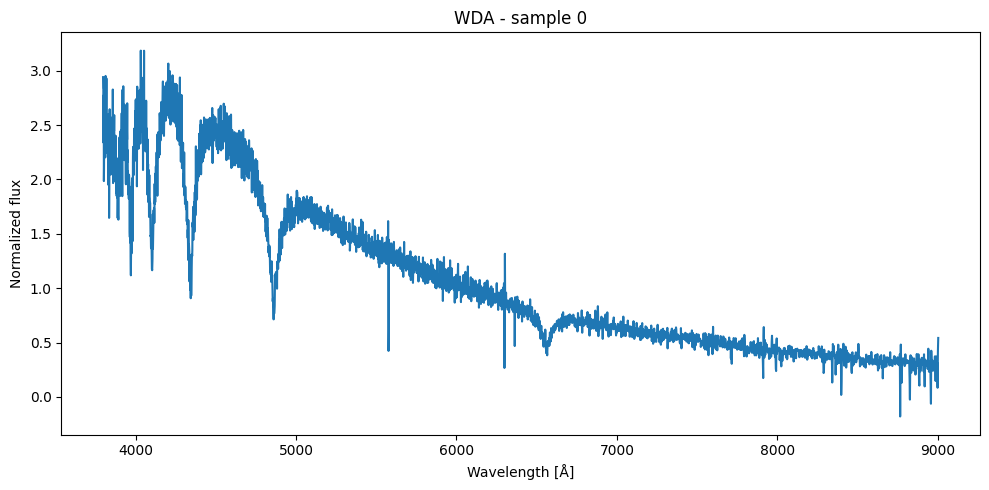

In [29]:
W_wda, X_wda_spec, X_wda_input, df_wda_DRAC = load_class_spectra_DRACULA_with_wavelength(
    "WDA",
    n_samples=1100,
    random_state=42
)

sample_idx = 0

plt.figure(figsize=(10, 5))
plt.plot(W_wda[sample_idx], X_wda_spec[sample_idx])
plt.xlabel("Wavelength [Å]")
plt.ylabel("Normalized flux")
plt.title(f"WDA - sample {sample_idx}")
plt.tight_layout()
plt.show()

### Funciones que hacen cluster y plot según método, y generan espectros a partir de los clusters encontrados en cada método. Se implementa interact

In [30]:
def _add_cluster_legend(ax, labels, cmap=plt.cm.viridis):
    unique_labels = np.unique(labels)
    label_min, label_max = unique_labels.min(), unique_labels.max()
    handles = []
    for lab in unique_labels:
        count = int(np.sum(labels == lab))
        if lab == -1:
            color, text = "black", f"ruido (-1): n={count}"
        else:
            norm = 0.5 if label_max == label_min else (lab - label_min) / (label_max - label_min)
            color, text = cmap(norm), f"cluster {lab}: n={count}"
        handles.append(Line2D([0], [0], marker='o', color='w',
                               markerfacecolor=color, markersize=8, label=text))
    ax.legend(handles=handles, title="Clusters", loc="best", fontsize=9)

In [31]:
def _print_metrics_box(class_name, layer_name, method, param_str, metrics, dbcv=None):
    k     = metrics['n_clusters']
    noise = metrics['n_noise']
    sil   = f"{metrics['silhouette']:.4f}"        if metrics['silhouette']        is not None else 'N/A'
    db    = f"{metrics['davies_bouldin']:.4f}"    if metrics['davies_bouldin']    is not None else 'N/A'
    ch    = f"{metrics['calinski_harabasz']:.2f}" if metrics['calinski_harabasz'] is not None else 'N/A'
    sep   = chr(9472) * 64
    print(f'\n  \u250c{sep}\u2510')
    print(f'  \u2502  {class_name} | {layer_name} | {method} | {param_str}')
    print(f'  \u2502  clusters={k}  noise={noise}  sil={sil}  DB={db}  CH={ch}')
    if dbcv is not None:
        dbcv_str = f'{dbcv:.4f}' if dbcv == dbcv else 'N/A'
        print(f'  \u2502  DBCV = {dbcv_str}  (rango [-1,1], especifico DBSCAN)')
    print(f'  \u2514{sep}\u2518\n')


def cluster_plot_KMeans(features_32, class_name, layer_name,
                        kmeans_k=3, random_state=42,
                        vis_method="pca", xlim=None, ylim=None,
                        container=None):

    Xs = StandardScaler().fit_transform(features_32)

    if vis_method.lower() == "pca":
        emb_2d = PCA(n_components=2, random_state=42).fit_transform(Xs)
    elif vis_method.lower() == "tsne":
        emb_2d = TSNE(n_components=2, random_state=42,
                      perplexity=30, init='pca').fit_transform(Xs)
    else:
        raise ValueError("vis_method debe ser 'pca' o 'tsne'")

    km_labels = KMeans(n_clusters=kmeans_k, random_state=random_state,
                       n_init=10).fit_predict(Xs)

    if container is not None:
        save_cluster_labels(container, class_name, layer_name, "kmeans", km_labels)

    fig, ax = plt.subplots(figsize=(9, 6))
    ax.scatter(emb_2d[:, 0], emb_2d[:, 1], c=km_labels, s=30, alpha=0.6, cmap='viridis')
    ax.set_title(f"{class_name} \u2014 {layer_name} \u2014 KMeans "
                 f"(k={kmeans_k}, n={features_32.shape[0]})", fontsize=15)
    _add_cluster_legend(ax, km_labels)
    ax.set_xlabel("Comp. 1"); ax.set_ylabel("Comp. 2")
    if xlim: ax.set_xlim(xlim)
    if ylim: ax.set_ylim(ylim)
    plt.tight_layout(); plt.show()

    metrics = compute_cluster_metrics(Xs, km_labels)
    _print_metrics_box(class_name, layer_name, "kmeans", f"k={kmeans_k}", metrics)
    return {"kmeans": km_labels, "metrics": metrics}


def cluster_plot_Spect(features_32, class_name, layer_name,
                       spectral_k=3, random_state=42,
                       vis_method="pca", xlim=None, ylim=None,
                       container=None):

    Xs = StandardScaler().fit_transform(features_32)

    if vis_method.lower() == "pca":
        emb_2d = PCA(n_components=2, random_state=42).fit_transform(Xs)
    elif vis_method.lower() == "tsne":
        emb_2d = TSNE(n_components=2, random_state=42,
                      perplexity=30, init='pca').fit_transform(Xs)
    else:
        raise ValueError("vis_method debe ser 'pca' o 'tsne'")

    sc_labels = SpectralClustering(n_clusters=spectral_k, random_state=random_state,
                                   affinity='nearest_neighbors').fit_predict(Xs)

    if container is not None:
        save_cluster_labels(container, class_name, layer_name, "spectral", sc_labels)

    fig, ax = plt.subplots(figsize=(9, 6))
    ax.scatter(emb_2d[:, 0], emb_2d[:, 1], c=sc_labels, s=30, alpha=0.6, cmap='viridis')
    ax.set_title(f"{class_name} \u2014 {layer_name} \u2014 Spectral "
                 f"(k={spectral_k}, n={features_32.shape[0]})", fontsize=15)
    _add_cluster_legend(ax, sc_labels)
    ax.set_xlabel("Comp. 1"); ax.set_ylabel("Comp. 2")
    if xlim: ax.set_xlim(xlim)
    if ylim: ax.set_ylim(ylim)
    plt.tight_layout(); plt.show()

    metrics = compute_cluster_metrics(Xs, sc_labels)
    _print_metrics_box(class_name, layer_name, "spectral", f"k={spectral_k}", metrics)
    return {"spectral": sc_labels, "metrics": metrics}


def cluster_plot_DBSCAN(features_32, class_name, layer_name,
                        dbscan_eps=1.5, dbscan_min_samples=10,
                        vis_method="pca", xlim=None, ylim=None,
                        container=None):

    Xs = StandardScaler().fit_transform(features_32)

    if vis_method.lower() == "pca":
        emb_2d = PCA(n_components=2, random_state=42).fit_transform(Xs)
    elif vis_method.lower() == "tsne":
        emb_2d = TSNE(n_components=2, random_state=42,
                      perplexity=30, init='pca').fit_transform(Xs)
    else:
        raise ValueError("vis_method debe ser 'pca' o 'tsne'")

    db_labels = DBSCAN(eps=dbscan_eps,
                       min_samples=dbscan_min_samples).fit_predict(Xs)

    if container is not None:
        save_cluster_labels(container, class_name, layer_name, "dbscan", db_labels)

    fig, ax = plt.subplots(figsize=(9, 6))
    ax.scatter(emb_2d[:, 0], emb_2d[:, 1], c=db_labels, s=30, alpha=0.3, cmap='viridis')
    ax.set_title(f"{class_name} \u2014 {layer_name} \u2014 DBSCAN "
                 f"(eps={dbscan_eps}, n={features_32.shape[0]})", fontsize=15)
    _add_cluster_legend(ax, db_labels)
    ax.set_xlabel("Comp. 1"); ax.set_ylabel("Comp. 2")
    if xlim: ax.set_xlim(xlim)
    if ylim: ax.set_ylim(ylim)
    plt.tight_layout(); plt.show()

    metrics = compute_cluster_metrics(Xs, db_labels)
    n_pts   = int(np.sum(db_labels != -1))
    dbcv    = dbcv_score(Xs, db_labels) if n_pts <= 5000 else None
    if n_pts > 5000:
        print(f'  [DBCV omitido: {n_pts} puntos no-ruido > 5000]')
    _print_metrics_box(class_name, layer_name, "dbscan", f"eps={dbscan_eps}", metrics, dbcv=dbcv)
    return {"dbscan": db_labels, "metrics": metrics, "dbcv": dbcv}


In [32]:
def _plot_cluster_spectra_base(
    spectra_2d, labels, wavelength,
    class_name, layer_name, method_name,
    linewidth_mean=2.4,
    figsize=(11, 5),
    mark_balmer=True,
    robust_ylim=True,
    ignore_noise=False,
    diff_percentiles=(1, 99),
    show_std=False,
    smooth_sigma=3             # suavizado Gaussian para el plot de diferencia (pixeles)
):
    spectra_2d = np.asarray(spectra_2d)
    labels     = np.asarray(labels)
    wavelength = np.asarray(wavelength)

    if ignore_noise:
        mask       = labels != -1
        spectra_2d = spectra_2d[mask]
        labels     = labels[mask]

    unique_clusters = np.sort(np.unique(labels))
    total_mean      = np.mean(spectra_2d, axis=0)
    group_means     = {int(c): np.mean(spectra_2d[labels == c], axis=0)
                       for c in unique_clusters}

    n_clusters = len(unique_clusters)
    cmap       = plt.cm.get_cmap("tab10", n_clusters)

    # promedio de cada cluster por separado
    for i, c in enumerate(unique_clusters):
        group_spectra = spectra_2d[labels == c]
        group_mean    = group_means[int(c)]
        n             = int(group_spectra.shape[0])
        #color         = cmap(i)

        if c == -1:
            color = "gray"
            label_mean = f"Ruido (-1) mean (n={n})"
            title_tag = f"Ruido (-1) (n={n})"
        else:
            color = cmap(i)
            label_mean = f"Cluster {c} mean (n={n})"
            title_tag = f"Cluster {c} (n={n})"

        fig, ax = plt.subplots(figsize=figsize)

        if show_std:
            std = np.std(group_spectra, axis=0)
            ax.fill_between(wavelength,
                            group_mean - std,
                            group_mean + std,
                            alpha=0.18, color=color, label="±1σ")

        ax.plot(wavelength, group_mean, linewidth=linewidth_mean,
                color=color, label=f"Cluster {c} mean (n={n})")

        ax.set_xlabel("Wavelength [Å]")
        ax.set_ylabel("Normalized flux")
        ax.set_title(f"{class_name} — {layer_name} — {method_name}\n{title_tag}")

        if robust_ylim:
            p_low, p_high = np.percentile(group_mean, [1, 99])
            margin = 0.10 * (p_high - p_low)
            ax.set_ylim(p_low - margin, p_high + margin)

        if mark_balmer:
            add_balmer_lines(ax)

        ax.legend()
        plt.tight_layout()
        plt.show()

    # promedio total ──
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot(wavelength, total_mean, linewidth=linewidth_mean,
            color="black", label=f"Total mean (n={spectra_2d.shape[0]})")

    ax.set_xlabel("Wavelength [Å]")
    ax.set_ylabel("Normalized flux")
    ax.set_title(f"{class_name} — {layer_name} — {method_name}\n"
                 f"Total mean spectrum")

    if robust_ylim:
        p_low, p_high = np.percentile(total_mean, [1, 99])
        margin = 0.10 * (p_high - p_low)
        ax.set_ylim(p_low - margin, p_high + margin)

    if mark_balmer:
        add_balmer_lines(ax)

    ax.legend()
    plt.tight_layout()
    plt.show()

    # diferencia: promedio cluster − promedio total
    from scipy.ndimage import gaussian_filter1d
    for i, c in enumerate(unique_clusters):
        diff        = group_means[int(c)] - total_mean
        diff_smooth = gaussian_filter1d(diff, sigma=smooth_sigma)
    # ruido dbscan
        if c == -1:
            color     = "gray"
            diff_label = "Ruido (-1) − total mean"
            diff_title = "Diff: Ruido (-1) mean − total mean"
        else:
            color      = cmap(i)
            diff_label = f"Cluster {c} − total mean"
            diff_title = f"Diff: Cluster {c} mean − total mean"

        fig, ax = plt.subplots(figsize=figsize)
        ax.plot(wavelength, diff,        linewidth=0.8, color=color,
                alpha=0.25, label="raw")
        ax.plot(wavelength, diff_smooth, linewidth=linewidth_mean, color=color,
                alpha=1.0,  label=f"{diff_label} (σ={smooth_sigma}px)")
        ax.axhline(0.0, linestyle="--", linewidth=1.2, color="gray", alpha=0.7)

        ax.set_xlabel("Wavelength [Å]")
        ax.set_ylabel("Δ Normalized flux")
        ax.set_title(f"{class_name} — {layer_name} — {method_name}\n{diff_title}")

        if robust_ylim:
            p_low, p_high = np.percentile(diff_smooth, diff_percentiles)
            margin = 0.15 * (p_high - p_low + 1e-8)
            ax.set_ylim(p_low - margin, p_high + margin)

        if mark_balmer:
            add_balmer_lines(ax)

        ax.legend()
        plt.tight_layout()
        plt.show()

    # todos los promedios juntos 
    fig, ax = plt.subplots(figsize=figsize)
    all_curves = []

    for i, c in enumerate(unique_clusters):
        group_spectra = spectra_2d[labels == c]
        mean_spec     = group_means[int(c)]
        n_in_cluster  = int(np.sum(labels == c))
        #color         = cmap(i)
        if c == -1:
            color = "gray"
            leg   = f"Ruido (-1) (n={n_in_cluster})"
        else:
            color = cmap(i)
            leg   = f"Cluster {c} mean (n={n_in_cluster})"     

        if show_std:
            std = np.std(spectra_2d[labels==c], axis=0)
            ax.fill_between(wavelength,
                            mean_spec - std,
                            mean_spec + std,
                            alpha=0.18, color=color)

        ax.plot(wavelength, mean_spec, linewidth=2.2,
                color=color, label=leg)
        all_curves.append(mean_spec)

    ax.plot(wavelength, total_mean, linewidth=2.4, linestyle="--",
            color="black", label=f"Total mean (n={spectra_2d.shape[0]})")

    ax.set_xlabel("Wavelength [Å]")
    ax.set_ylabel("Normalized flux")
    ax.set_title(f"{class_name} — {layer_name} — {method_name}\n"
                 f"All cluster means")

    if robust_ylim:
        stacked = np.vstack([*all_curves, total_mean])
        p_low, p_high = np.percentile(stacked, [1, 99])
        margin = 0.10 * (p_high - p_low + 1e-8)
        ax.set_ylim(p_low - margin, p_high + margin)

    if mark_balmer:
        add_balmer_lines(ax)

    ax.legend()
    plt.tight_layout()
    plt.show()

    return {
        "total_mean"     : total_mean,
        "group_means"    : group_means,
        "unique_clusters": unique_clusters
    }

In [33]:
def plot_spectra_kmeans(spectra_2d, labels, wavelength, class_name, layer_name,
                        linewidth_mean=2.4, figsize=(11,5),
                        mark_balmer=True, robust_ylim=True, show_std=False,
                        smooth_sigma=3):
    return _plot_cluster_spectra_base(
        spectra_2d, labels, wavelength,
        class_name, layer_name, method_name="kmeans",
        linewidth_mean=linewidth_mean, figsize=figsize,
        mark_balmer=mark_balmer, robust_ylim=robust_ylim,
        ignore_noise=False, show_std=show_std, smooth_sigma=smooth_sigma
    )

def plot_spectra_spectral(spectra_2d, labels, wavelength, class_name, layer_name,
                          linewidth_mean=2.4, figsize=(11,5),
                          mark_balmer=True, robust_ylim=True, show_std=False,
                          smooth_sigma=3):
    return _plot_cluster_spectra_base(
        spectra_2d, labels, wavelength,
        class_name, layer_name, method_name="spectral",
        linewidth_mean=linewidth_mean, figsize=figsize,
        mark_balmer=mark_balmer, robust_ylim=robust_ylim,
        ignore_noise=False, show_std=show_std, smooth_sigma=smooth_sigma
    )

def plot_spectra_dbscan(spectra_2d, labels, wavelength, class_name, layer_name,
                        ignore_noise=False, linewidth_mean=2.4, figsize=(11,5),
                        mark_balmer=True, robust_ylim=True, show_std=False,
                        smooth_sigma=3):
    return _plot_cluster_spectra_base(
        spectra_2d, labels, wavelength,
        class_name, layer_name, method_name="dbscan",
        linewidth_mean=linewidth_mean, figsize=figsize,
        mark_balmer=mark_balmer, robust_ylim=robust_ylim,
        ignore_noise=ignore_noise, show_std=show_std, smooth_sigma=smooth_sigma
    )

In [34]:
# Widget interactivo para explorar los espectros promedio por cluster
def interactive_plot_cluster_spectra(
    spectra_2d,
    wavelength,
    class_name,
    container,
    linewidth_mean=2.4,
    figsize=(13, 5),
    mark_balmer=True
):
    """
    Controles:
    - Capa       : flatten / dense / dense_1 / dense_2
    - Método     : kmeans / spectral / dbscan
    - Mostrar ±1σ: activa/desactiva la banda de desviación estándar
    """
    spectra_2d = np.asarray(spectra_2d)
    wavelength = np.asarray(wavelength)

    # leer capas y métodos disponibles desde el container
    available_layers  = list(container[class_name].keys())
    available_methods = list(next(iter(container[class_name].values())).keys())

    layer_dropdown = widgets.Dropdown(
        options=available_layers,
        value=available_layers[0],
        description="Capa:"
    )
    method_dropdown = widgets.Dropdown(
        options=available_methods,
        value=available_methods[0],
        description="Método:"
    )
    std_toggle = widgets.ToggleButtons(
        options=["No", "Sí"],
        value="No",
        description="Mostrar ±1σ:",
        button_style=""
    )

    def _plot(layer_name, method_name, mostrar_std):
        if method_name not in container[class_name].get(layer_name, {}):
            print(f"Sin labels para {class_name} — {layer_name} — {method_name}")
            return

        labels          = np.asarray(container[class_name][layer_name][method_name])
        unique_clusters = np.sort(np.unique(labels))
        total_mean      = np.mean(spectra_2d, axis=0)
        n_clusters      = len(unique_clusters)
        cmap            = plt.cm.get_cmap("tab10", n_clusters)
        show_std        = mostrar_std == "Sí"

        fig, ax = plt.subplots(figsize=figsize)

        for i, c in enumerate(unique_clusters):
            mask          = labels == c
            group_spectra = spectra_2d[mask]
            group_mean    = np.mean(group_spectra, axis=0)
            n_in_cluster  = int(mask.sum())
            color         = cmap(i)

            if show_std:
                std = np.std(group_spectra, axis=0)
                ax.fill_between(wavelength,
                                group_mean - std,
                                group_mean + std,
                                alpha=0.18, color=color)

            ax.plot(wavelength, group_mean, linewidth=linewidth_mean,
                    color=color, label=f"Cluster {c} (n={n_in_cluster})")

        ax.plot(wavelength, total_mean, linewidth=2.0, linestyle="--",
                color="black", label=f"Total mean (n={spectra_2d.shape[0]})")

        ax.set_xlabel("Wavelength [Å]")
        ax.set_ylabel("Normalized flux")
        ax.set_title(f"{class_name} — {layer_name} — {method_name}"
                     + ("   [±1σ]" if show_std else ""))

        if mark_balmer:
            add_balmer_lines(ax)

        ax.legend()
        plt.tight_layout()
        plt.show()

    interact(
        _plot,
        layer_name=layer_dropdown,
        method_name=method_dropdown,
        mostrar_std=std_toggle
    )

### Función para el cálculo de métricas Davies Bouldin Score, Calinsi-Harabasz Score y Silhouette Score para un clustering dado

In [35]:
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score


def compute_cluster_metrics(Xs, labels):
    """
    Calcula DB, CH y Silhouette sobre el espacio escalado.
    Excluye ruido (-1) automaticamente.
    Retorna dict con metricas, o None en cada metrica si hay menos de 2 clusters.
    """
    mask         = labels != -1
    Xs_clean     = Xs[mask]
    labels_clean = labels[mask]

    n_clusters = len(np.unique(labels_clean))
    n_noise    = int(np.sum(~mask))

    if n_clusters < 2:
        return {
            "n_clusters"        : n_clusters,
            "n_noise"           : n_noise,
            "silhouette"        : None,
            "davies_bouldin"    : None,
            "calinski_harabasz" : None
        }

    return {
        "n_clusters"        : n_clusters,
        "n_noise"           : n_noise,
        "silhouette"        : round(silhouette_score(Xs_clean, labels_clean), 6),
        "davies_bouldin"    : round(davies_bouldin_score(Xs_clean, labels_clean), 6),
        "calinski_harabasz" : round(calinski_harabasz_score(Xs_clean, labels_clean), 4)
    }


In [36]:
# censity based clustering validation (DBCV)
from scipy.spatial.distance import cdist
from scipy.sparse.csgraph import minimum_spanning_tree
from scipy.sparse import csr_matrix


def dbcv_score(X, labels, noise_id=-1):
    """
    rango [-1, 1]. Mas alto = mejor.
    los puntos de ruido (noise_id=-1) se excluyen automaticamente.
    complejidad O(n^2). Recomendado para n <= 5000.
    """
    X      = np.asarray(X, dtype=np.float64)
    labels = np.asarray(labels)

    mask   = labels != noise_id
    X      = X[mask]
    labels = labels[mask]

    unique = np.unique(labels)
    if len(unique) < 2:
        return np.nan

    n = X.shape[0]

    # matriz de distancias completa
    D = cdist(X, X)
    np.fill_diagonal(D, np.inf)

    # distancia core: media armonica de distancias dentro del cluster
    # d_core(x_i) = (|C|-1) / sum_{j in C, j!=i} (1/d(x_i,x_j))
    core_dists = np.full(n, np.inf)
    for label in unique:
        idx = np.where(labels == label)[0]
        if len(idx) <= 1:
            continue
        D_sub = D[np.ix_(idx, idx)]
        with np.errstate(divide='ignore'):
            inv_d = np.where(np.isinf(D_sub), 0.0, 1.0 / D_sub)
        harmonic_core = (len(idx) - 1) / inv_d.sum(axis=1)
        for k, i in enumerate(idx):
            core_dists[i] = harmonic_core[k]

    # Mutual reachability distance: mrd(i,j) = max(core_i, core_j, d(i,j))
    D_fin = np.where(np.isinf(D), 0.0, D)
    mrd   = np.maximum(
        np.maximum(core_dists[:, None], core_dists[None, :]),
        D_fin
    )

    # Arbol de expansion minima sobre mrd
    mst     = minimum_spanning_tree(csr_matrix(mrd)).toarray()
    mst_sym = np.maximum(mst, mst.T)

    # DSC: max arista interna del MST por cluster (dispersion interna)
    dsc = {}
    for label in unique:
        idx      = np.where(labels == label)[0]
        internal = mst_sym[np.ix_(idx, idx)]
        dsc[label] = float(internal.max()) if internal.size > 0 else 0.0

    # DSPC: min MRD entre clusters distintos (separacion entre clusters)
    dspc = {}
    for i, li in enumerate(unique):
        for j, lj in enumerate(unique):
            if i >= j:
                continue
            ix_i = np.where(labels == li)[0]
            ix_j = np.where(labels == lj)[0]
            val  = float(mrd[np.ix_(ix_i, ix_j)].min())
            dspc[(li, lj)] = dspc[(lj, li)] = val

    # Validez por cluster: (separacion - dispersion) / max(separacion, dispersion)
    validity = {}
    for label in unique:
        min_sep = min(dspc[(label, o)] for o in unique if o != label)
        denom   = max(min_sep, dsc[label])
        validity[label] = 0.0 if denom == 0 else (min_sep - dsc[label]) / denom

    # Score global: promedio ponderado por tamano de cluster
    score = sum(
        (np.sum(labels == label) / n) * validity[label]
        for label in unique
    )
    return round(float(score), 6)


In [37]:
# tabla de métricas
def build_metrics_table(
    representations_32,
    class_name,
    spectral_k_values    = [2, 3, 4, 5],
    dbscan_eps_values    = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0],
    dbscan_min_samples   = 10,
    random_state         = 42
):
    """
    Itera sobre todas las combinaciones capa × método × parámetro
    y devuelve una tabla con las métricas de clustering.

    Solo considera Spectral Clustering y DBSCAN.

    Parameters
    ----------
    representations_32 : dict {layer_name: np.ndarray shape (n, 32)}
    class_name         : str
    spectral_k_values  : list de k a probar para Spectral
    dbscan_eps_values  : list de eps a probar para DBSCAN
    dbscan_min_samples : int

    Returns
    -------
    pd.DataFrame con columnas:
        class | layer | method | param | param_value |
        n_clusters | n_noise | silhouette | davies_bouldin | calinski_harabasz
    """
    rows = []

    for layer_name, feats in representations_32.items():
        Xs = StandardScaler().fit_transform(feats)

        # ── Spectral Clustering: barre sobre k ──
        for k in spectral_k_values:
            labels = SpectralClustering(
                n_clusters    = k,
                affinity      = "nearest_neighbors",
                assign_labels = "kmeans",
                random_state  = random_state
            ).fit_predict(Xs)

            metrics = compute_cluster_metrics(Xs, labels)

            rows.append({
                "class"             : class_name,
                "layer"             : layer_name,
                "method"            : "spectral",
                "param"             : "k",
                "param_value"       : k,
                **metrics
            })

        # ── DBSCAN: barre sobre eps ──
        for eps in dbscan_eps_values:
            labels = DBSCAN(
                eps         = eps,
                min_samples = dbscan_min_samples
            ).fit_predict(Xs)

            metrics = compute_cluster_metrics(Xs, labels)

            rows.append({
                "class"             : class_name,
                "layer"             : layer_name,
                "method"            : "dbscan",
                "param"             : "eps",
                "param_value"       : eps,
                **metrics
            })

    df = pd.DataFrame(rows, columns=[
        "class", "layer", "method", "param", "param_value",
        "n_clusters", "n_noise",
        "silhouette", "davies_bouldin", "calinski_harabasz"
    ])

    return df

In [38]:
# identificar las mejores configuraciones
def get_best_configs(metrics_df, top_n=5, min_clusters=2):
    """
    Rankea las configuraciones usando las tres métricas combinadas.

    Criterios:
        silhouette        → mayor es mejor
        davies_bouldin    → menor es mejor
        calinski_harabasz → mayor es mejor

    Se filtran filas con métricas None o n_clusters < min_clusters.

    Parameters
    ----------
    metrics_df  : output de build_metrics_table
    top_n       : cuántas configuraciones mostrar
    min_clusters: mínimo de clusters para considerar válida la fila

    Returns
    -------
    pd.DataFrame con las top_n configuraciones y su score_compuesto
    """
    df = metrics_df.dropna(subset=["silhouette", "davies_bouldin",
                                    "calinski_harabasz"]).copy()
    df = df[df["n_clusters"] >= min_clusters].reset_index(drop=True)

    # Ranking por cada métrica (1 = mejor)
    df["rank_sil"] = df["silhouette"].rank(ascending=False)
    df["rank_db"]  = df["davies_bouldin"].rank(ascending=True)   # menor es mejor
    df["rank_ch"]  = df["calinski_harabasz"].rank(ascending=False)

    # Score compuesto: promedio de los tres rankings (menor = mejor)
    df["score_compuesto"] = (df["rank_sil"] + df["rank_db"] + df["rank_ch"]) / 3

    top = (df.sort_values("score_compuesto")
             .head(top_n)
             .reset_index(drop=True))

    cols_show = [
        "class", "layer", "method", "param_value", "n_clusters", "n_noise",
        "silhouette", "davies_bouldin", "calinski_harabasz", "score_compuesto"
    ]

    return top[cols_show]

In [39]:
# visualización tabla 
def plot_metrics_heatmap(metrics_df, metric="silhouette", class_name=None):
    """
    Heatmap de una métrica para todas las combinaciones capa × configuración.

    Parameters
    ----------
    metric : "silhouette" | "davies_bouldin" | "calinski_harabasz"
    """
    if class_name:
        df = metrics_df[metrics_df["class"] == class_name].copy()
    else:
        df = metrics_df.copy()

    df["config"] = df["method"] + " " + df["param"] + "=" + df["param_value"].astype(str)

    pivot = df.pivot_table(index="layer", columns="config",
                           values=metric, aggfunc="first")

    # Para DB, invertir la escala visualmente (menor = mejor = más oscuro)
    ascending = metric != "davies_bouldin"

    fig, ax = plt.subplots(figsize=(max(10, len(pivot.columns)), 4))
    sns.heatmap(
        pivot,
        annot=True, fmt=".4f",
        cmap="RdYlGn" if ascending else "RdYlGn_r",
        ax=ax,
        linewidths=0.5,
        cbar_kws={"label": metric}
    )
    title_note = "(↑ mejor)" if ascending else "(↓ mejor)"
    ax.set_title(f"{class_name or ''} — {metric} {title_note}", fontsize=13)
    ax.set_xlabel("")
    ax.set_ylabel("Capa")
    plt.xticks(rotation=30, ha="right")
    plt.tight_layout()
    plt.show()

### Caracterización espectral — profundidad de líneas Balmer por cluster

In [40]:
BALMER_LINES = {
    'Hε': 3970,
    'Hδ': 4101,
    'Hγ': 4340,
    'Hβ': 4861,
    'Hα': 6563,
}


def _measure_line(flux, wave, center,
                  line_hw=20, cont_offset=50, cont_hw=25):
    wave = np.asarray(wave)
    flux = np.asarray(flux)

    line_mask = np.abs(wave - center) <= line_hw
    cont_mask = (
        ((wave >= center - cont_offset - cont_hw) & (wave <= center - cont_offset)) |
        ((wave >= center + cont_offset)           & (wave <= center + cont_offset + cont_hw))
    )

    if line_mask.sum() == 0 or cont_mask.sum() == 0:
        return np.nan, np.nan

    F_cont = np.mean(flux[cont_mask])
    if F_cont == 0:
        return np.nan, np.nan

    F_line = flux[line_mask]
    W_line = wave[line_mask]
    depth  = F_cont - np.min(F_line)
    d_lam  = np.abs(np.gradient(W_line)).mean()
    ew     = np.sum(np.clip(1.0 - F_line / F_cont, 0, None)) * d_lam
    return round(float(depth), 6), round(float(ew), 4)


def compute_balmer_depths(group_means, wavelength,
                          class_name, layer_name, method_name,
                          label_counts=None):
    """
    Calcula profundidad y pseudo-EW de lineas Balmer para cada cluster.

    group_means  : dict {cluster_id: array espectro medio}  <- viene de _plot_cluster_spectra_base
    label_counts : dict {cluster_id: n_muestras}  (opcional)

    Retorna pd.DataFrame  filas=clusters, columnas=profundidad/EW por linea
    """
    wavelength = np.asarray(wavelength)
    rows = []

    for cid in sorted(group_means.keys()):
        mean_spec = np.asarray(group_means[cid])
        row = {
            'class'  : class_name,
            'layer'  : layer_name,
            'method' : method_name,
            'cluster': cid,
        }
        if label_counts is not None:
            row['n'] = label_counts.get(cid, None)

        for line_name, center in BALMER_LINES.items():
            if center < wavelength.min() or center > wavelength.max():
                row[f'{line_name}_depth'] = np.nan
                row[f'{line_name}_ew']    = np.nan
                continue
            depth, ew = _measure_line(mean_spec, wavelength, center)
            row[f'{line_name}_depth'] = depth
            row[f'{line_name}_ew']    = ew

        rows.append(row)

    return pd.DataFrame(rows)


def plot_balmer_comparison(balmer_df, metric='depth', figsize=(10, 4)):
    """
    Barras agrupadas: profundidad (o EW) de cada linea Balmer por cluster.
    metric : 'depth' o 'ew'
    """
    cols = [f'{ln}_{metric}' for ln in BALMER_LINES if f'{ln}_{metric}' in balmer_df.columns]
    n_clusters = len(balmer_df)
    x          = np.arange(len(cols))
    width      = 0.8 / n_clusters
    cmap       = plt.cm.get_cmap('tab10', n_clusters)

    fig, ax = plt.subplots(figsize=figsize)
    for i, (_, row) in enumerate(balmer_df.iterrows()):
        vals  = [row[c] for c in cols]
        label = f"Cluster {int(row['cluster'])}"
        if 'n' in row and row['n'] is not None:
            label += f" (n={int(row['n'])})"
        ax.bar(x + i * width, vals, width=width, color=cmap(i), alpha=0.85, label=label)

    ax.set_xticks(x + width * (n_clusters - 1) / 2)
    ax.set_xticklabels([c.replace(f'_{metric}', '') for c in cols], fontsize=11)
    ax.set_ylabel('Profundidad (flux units)' if metric == 'depth' else 'Pseudo-EW [A]')
    row0 = balmer_df.iloc[0]
    ax.set_title(f"Balmer {metric} por cluster — {row0['class']} | {row0['layer']} | {row0['method']}")
    ax.legend()
    plt.tight_layout(); plt.show()


### Estabilidad de clusters — ARI entre múltiples corridas

In [41]:
from sklearn.metrics import adjusted_rand_score
from itertools import combinations as _combinations


def _pairwise_ari(all_labels):
    pairs = list(_combinations(range(len(all_labels)), 2))
    return [adjusted_rand_score(all_labels[i], all_labels[j]) for i, j in pairs]


def test_kmeans_stability(features_32, k, class_name, layer_name,
                          n_runs=30, random_state_base=0):
    """
    Corre KMeans n_runs veces con semillas distintas.
    ARI ~ 1.0 => muy estable.  ARI < 0.6 => inestable.
    """
    Xs = StandardScaler().fit_transform(features_32)
    all_labels = [
        KMeans(n_clusters=k, n_init=10, random_state=seed).fit_predict(Xs)
        for seed in range(random_state_base, random_state_base + n_runs)
    ]
    aris = _pairwise_ari(all_labels)
    mu, sd = np.mean(aris), np.std(aris)
    print(f"[{class_name} | {layer_name} | KMeans k={k}]  "
          f"ARI = {mu:.3f} +/- {sd:.3f}  "
          f"(min={min(aris):.3f}, max={max(aris):.3f})  [{n_runs} corridas]")
    return {'mean_ari': mu, 'std_ari': sd, 'all_aris': aris}


def test_spectral_stability(features_32, k, class_name, layer_name,
                            n_runs=20, random_state_base=0):
    """
    Corre SpectralClustering n_runs veces con semillas distintas.
    """
    Xs = StandardScaler().fit_transform(features_32)
    all_labels = [
        SpectralClustering(
            n_clusters=k, affinity='nearest_neighbors',
            assign_labels='kmeans', random_state=seed
        ).fit_predict(Xs)
        for seed in range(random_state_base, random_state_base + n_runs)
    ]
    aris = _pairwise_ari(all_labels)
    mu, sd = np.mean(aris), np.std(aris)
    print(f"[{class_name} | {layer_name} | Spectral k={k}]  "
          f"ARI = {mu:.3f} +/- {sd:.3f}  "
          f"(min={min(aris):.3f}, max={max(aris):.3f})  [{n_runs} corridas]")
    return {'mean_ari': mu, 'std_ari': sd, 'all_aris': aris}


def test_subsample_stability(features_32, cluster_func, class_name, layer_name,
                             n_runs=30, subsample_frac=0.80, random_state=42):
    """
    Estabilidad por submuestreo sin reposicion (recomendado para DBSCAN).
    cluster_func(Xs) -> labels  (Xs ya escalado).
    """
    rng   = np.random.default_rng(random_state)
    Xs    = StandardScaler().fit_transform(features_32)
    n     = Xs.shape[0]
    n_sub = int(n * subsample_frac)

    runs = []
    for _ in range(n_runs):
        idx    = np.sort(rng.choice(n, size=n_sub, replace=False))
        labels = cluster_func(Xs[idx])
        runs.append((idx, labels))

    aris = []
    for (idx_i, lbl_i), (idx_j, lbl_j) in _combinations(runs[:20], 2):
        common = np.intersect1d(idx_i, idx_j)
        if len(common) < 20:
            continue
        pos_i = np.searchsorted(idx_i, common)
        pos_j = np.searchsorted(idx_j, common)
        aris.append(adjusted_rand_score(lbl_i[pos_i], lbl_j[pos_j]))

    if not aris:
        print(f"[{class_name} | {layer_name}] Sin pares comparables.")
        return {}

    mu, sd = np.mean(aris), np.std(aris)
    print(f"[{class_name} | {layer_name} | subsample {subsample_frac*100:.0f}%]  "
          f"ARI = {mu:.3f} +/- {sd:.3f}  "
          f"(min={min(aris):.3f}, max={max(aris):.3f})  [{n_runs} corridas]")
    return {'mean_ari': mu, 'std_ari': sd, 'all_aris': aris}


def plot_ari_distribution(stability_result, title='Distribucion ARI', figsize=(7, 3)):
    aris = stability_result.get('all_aris', [])
    if not aris:
        return
    fig, ax = plt.subplots(figsize=figsize)
    ax.hist(aris, bins=20, color='steelblue', edgecolor='white', alpha=0.85)
    ax.axvline(np.mean(aris), color='red', linestyle='--',
               label=f'Media = {np.mean(aris):.3f}')
    ax.set_xlabel('ARI'); ax.set_ylabel('Frecuencia')
    ax.set_title(title); ax.legend()
    plt.tight_layout(); plt.show()


### Función para selección de k mediante el eigengap del Laplaciano

Criterio propio de Spectral Clustering: escoge $k$ a partir del mayor salto entre autovalores consecutivos del Laplaciano normalizado del grafo de similitud.

In [42]:
# Seleccion de k para Spectral Clustering: heuristica del eigengap
from sklearn.neighbors import kneighbors_graph
from scipy.sparse.csgraph import laplacian as csgraph_laplacian


def evaluate_eigengap_k(features_32, class_name, layer_name,
                        n_neighbors=10, n_eigen=10):
    """
    Selecciona k mediante la heuristica del eigengap (von Luxburg, 2007).

    Construye el mismo grafo kNN que utiliza SpectralClustering con
    affinity='nearest_neighbors', calcula los autovalores del Laplaciano
    normalizado y escoge el k que maximiza el salto entre autovalores
    consecutivos: k* = argmax_k (lambda_{k+1} - lambda_k).

    A diferencia del Silhouette, que mide compacidad euclidiana, este criterio
    evalua la conectividad del grafo, que es la estructura sobre la que
    Spectral Clustering construye su particion.

    Grafica los primeros n_eigen autovalores y retorna un dict con los
    autovalores, los saltos y el k sugerido.
    """
    Xs = StandardScaler().fit_transform(features_32)

    # grafo kNN simetrizado (igual que SpectralClustering)
    A = kneighbors_graph(Xs, n_neighbors=n_neighbors, mode="connectivity")
    A = 0.5 * (A + A.T)

    # Laplaciano normalizado y sus autovalores mas pequenos
    L = csgraph_laplacian(A, normed=True)
    vals = np.sort(np.linalg.eigvalsh(L.toarray()))[:n_eigen]

    gaps = np.diff(vals)
    # se ignora el salto trivial entre lambda_1 y lambda_2 (equivale a k=1)
    k_sugerido = int(np.argmax(gaps[1:]) + 2)

    n_samples = features_32.shape[0]
    plt.figure(figsize=(12, 4))
    plt.plot(range(1, len(vals) + 1), vals, marker="o", color="seagreen")
    plt.axvline(k_sugerido, color="crimson", linestyle="--", alpha=0.8,
                label=f"k sugerido = {k_sugerido}")
    plt.title(f"{class_name} - {layer_name} - Eigengap (n={n_samples})")
    plt.xlabel("indice del autovalor")
    plt.ylabel("autovalor del Laplaciano")
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"[{layer_name}] k sugerido por eigengap = {k_sugerido} "
          f"(salto = {gaps[k_sugerido - 1]:.4f})")

    return {"autovalores": vals, "saltos": gaps, "k_eigengap": k_sugerido}

### Funciones para la evolución de k con la profundidad de la capa

Resumen del $k$ seleccionado por cada criterio (Silhouette para K-Means, eigengap para Spectral) y gráficos de su evolución al avanzar hacia capas más profundas.

In [43]:
# Evolucion del k seleccionado en funcion de la profundidad de la capa

def _k_meseta(k_values, scores, tol_rel=0.10):
    """
    Criterio conservador para seleccionar k a partir de la curva de Silhouette.

    En lugar de tomar el maximo global, se identifica la meseta de valores altos y
    se devuelve el ULTIMO k de esa meseta, es decir, el k inmediatamente anterior a
    la caida del score. Esto evita quedarse con un k pequeno cuando varios valores
    consecutivos alcanzan un Silhouette practicamente equivalente.

    Un k se considera dentro de la meseta si su score esta a menos de
    tol_rel * (max - min) del maximo de la curva.

    Retorna (k_seleccionado, mascara_de_meseta).
    """
    ks = list(k_values)
    s  = np.asarray(scores, dtype=float)

    rango = float(s.max() - s.min())
    tol   = tol_rel * rango if rango > 0 else 0.0
    en_meseta = s >= (s.max() - tol)

    # inicio de la meseta y su ultimo elemento antes de la primera caida
    inicio = int(np.argmax(en_meseta))
    idx    = inicio
    for i in range(inicio, len(ks)):
        if en_meseta[i]:
            idx = i
        else:
            break

    return ks[idx], en_meseta


def resumen_k_por_capa(representations_32, class_name,
                       capas=None, k_values=range(2, 9),
                       n_neighbors=10, eig_precalculado=None,
                       tol_rel=0.10, k_manual=None, random_state=42):
    """
    Para cada capa calcula, con el criterio que corresponde a cada algoritmo:

      K-Means  -> k_silhouette : ultimo k de la meseta del Silhouette (criterio
                                 conservador, ver _k_meseta)
                  silhouette   : score asociado a ese k
      Spectral -> k_eigengap   : k sugerido por el eigengap del Laplaciano
                  gap          : magnitud del salto entre autovalores en ese k

    Parametros utiles:
      tol_rel  : ancho de la meseta, como fraccion del rango de la curva.
      k_manual : dict opcional {capa: k} para forzar el k de K-Means en capas
                 puntuales, si la inspeccion visual de la curva lo justifica.

    Si se entrega eig_precalculado (dict devuelto por evaluate_eigengap_k por capa),
    reutiliza esos valores en lugar de recalcular la descomposicion espectral.
    """
    if capas is None:
        capas = ["flatten", "dense", "dense_1", "dense_2"]

    filas = []
    for capa in capas:
        Xs = StandardScaler().fit_transform(representations_32[capa])

        # --- criterio de K-Means: ultimo k de la meseta del Silhouette ---
        sils = []
        for k in k_values:
            labels = KMeans(n_clusters=k, random_state=random_state, n_init=10).fit_predict(Xs)
            sils.append(silhouette_score(Xs, labels))

        k_sil, meseta = _k_meseta(k_values, sils, tol_rel=tol_rel)

        if k_manual is not None and capa in k_manual:
            k_sil = int(k_manual[capa])

        sil_sel = float(sils[list(k_values).index(k_sil)])

        ks_meseta = [k for k, m in zip(list(k_values), meseta) if m]
        print(f"  [{capa}] meseta en k={ks_meseta} -> k seleccionado = {k_sil} "
              f"(sil = {sil_sel:.4f})")

        # --- criterio de Spectral Clustering: eigengap ---
        if eig_precalculado is not None and capa in eig_precalculado:
            k_eig = eig_precalculado[capa]["k_eigengap"]
            gaps  = eig_precalculado[capa]["saltos"]
        else:
            A = kneighbors_graph(Xs, n_neighbors=n_neighbors, mode="connectivity")
            A = 0.5 * (A + A.T)
            L = csgraph_laplacian(A, normed=True)
            vals  = np.sort(np.linalg.eigvalsh(L.toarray()))[:10]
            gaps  = np.diff(vals)
            k_eig = int(np.argmax(gaps[1:]) + 2)

        filas.append({
            "capa"         : capa,
            "k_silhouette" : k_sil,
            "silhouette"   : round(sil_sel, 4),
            "k_eigengap"   : k_eig,
            "gap"          : round(float(gaps[k_eig - 1]), 4)
        })

    return pd.DataFrame(filas)


def plot_k_vs_capa_kmeans(tabla, class_name):
    """
    K-Means: evolucion del k seleccionado por el criterio del Silhouette y de su
    score asociado, en funcion de la profundidad de la capa.
    """
    capas = tabla["capa"].tolist()
    x     = list(range(len(capas)))

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))

    axes[0].plot(x, tabla["k_silhouette"], marker="o", linewidth=2, color="tab:blue")
    axes[0].set_ylabel("k seleccionado")
    axes[0].set_title(f"{class_name} - K-Means: k por Silhouette vs profundidad")

    axes[1].plot(x, tabla["silhouette"], marker="o", linewidth=2, color="darkorange")
    axes[1].axhline(0, color="gray", linestyle=":", linewidth=1)
    axes[1].set_ylabel("Silhouette del k seleccionado")
    axes[1].set_title(f"{class_name} - K-Means: Silhouette asociado vs profundidad")

    for ax in axes:
        ax.set_xticks(x)
        ax.set_xticklabels(capas)
        ax.set_xlabel("capa (de mas superficial a mas profunda)")
        ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()


def plot_k_vs_capa_eigengap(tabla, class_name):
    """
    Spectral Clustering: evolucion del k seleccionado por el eigengap del Laplaciano
    y de la magnitud del salto asociado, en funcion de la profundidad de la capa.
    """
    capas = tabla["capa"].tolist()
    x     = list(range(len(capas)))

    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))

    axes[0].plot(x, tabla["k_eigengap"], marker="s", linewidth=2, color="seagreen")
    axes[0].set_ylabel("k seleccionado")
    axes[0].set_title(f"{class_name} - Spectral: k por eigengap vs profundidad")

    axes[1].plot(x, tabla["gap"], marker="s", linewidth=2, color="purple")
    axes[1].set_ylabel("magnitud del salto entre autovalores")
    axes[1].set_title(f"{class_name} - Spectral: salto asociado vs profundidad")

    for ax in axes:
        ax.set_xticks(x)
        ax.set_xticklabels(capas)
        ax.set_xlabel("capa (de mas superficial a mas profunda)")
        ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

### Función que ejecuta los tres algoritmos y grafica los resultados

Ejecuta K-Means, DBSCAN y Spectral Clustering sobre el espacio de 32 dimensiones y los presenta apilados en una misma figura, sobre la proyección indicada en `vis_method` (PCA o t-SNE).

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering


def cluster_and_plot(features_32, class_name, layer_name, 
                     kmeans_k=3, spectral_k=3, 
                     dbscan_eps=1.5, dbscan_min_samples=10,
                     vis_method="pca", xlim=None, ylim=None):
    
    Xs = StandardScaler().fit_transform(features_32)

    # Reducir a 2D solo para visualizar
    if vis_method.lower() == "pca":
        emb_2d = PCA(n_components=2, random_state=42).fit_transform(Xs)
    elif vis_method.lower() == "tsne":
        emb_2d = TSNE(n_components=2, random_state=42, perplexity=30, init='pca').fit_transform(Xs)
    else:
        raise ValueError("vis_method debe ser 'pca' o 'tsne'")

    # etiqueta legible del metodo de proyeccion, para incluirla en los titulos
    vis_label = "PCA" if vis_method.lower() == "pca" else "t-SNE"

    # Clustering
    km = KMeans(n_clusters=kmeans_k, random_state=42, n_init=10)
    km_labels = km.fit_predict(Xs)

    db = DBSCAN(eps=dbscan_eps, min_samples=dbscan_min_samples)
    db_labels = db.fit_predict(Xs)

    sc = SpectralClustering(n_clusters=spectral_k, random_state=42, affinity='nearest_neighbors')
    sc_labels = sc.fit_predict(Xs)

    fig, axes = plt.subplots(3, 1, figsize=(9, 16))
    n_samples = features_32.shape[0]
    cmap = plt.cm.viridis

    def add_cluster_legend(ax, labels):
        unique_labels = np.unique(labels)
        handles = []

        # Normalización para mapear labels a colores del cmap
        if len(unique_labels) > 1:
            label_min = unique_labels.min()
            label_max = unique_labels.max()
        else:
            label_min = label_max = unique_labels[0]

        for lab in unique_labels:
            count = np.sum(labels == lab)

            # Caso especial DBSCAN: ruido = -1
            if lab == -1:
                color = "black"
                text = f"ruido (-1): n={count}"
            else:
                if label_max == label_min:
                    color = cmap(0.5)
                else:
                    color = cmap((lab - label_min) / (label_max - label_min))
                text = f"cluster {lab}: n={count}"

            handles.append(
                Line2D([0], [0],
                       marker='o',
                       color='w',
                       markerfacecolor=color,
                       markersize=8,
                       label=text)
            )

        ax.legend(handles=handles, title="Clusters", loc="best", fontsize=9)

    # KMeans
    axes[0].scatter(emb_2d[:, 0], emb_2d[:, 1], c=km_labels, s=30, alpha=0.6, cmap='viridis')
    axes[0].set_title(f"{class_name} - {layer_name} - KMeans (k={kmeans_k}, n={n_samples}) - {vis_label}", fontsize=15)
    add_cluster_legend(axes[0], km_labels)

    # DBSCAN
    axes[1].scatter(emb_2d[:, 0], emb_2d[:, 1], c=db_labels, s=30, alpha=0.6, cmap='viridis')
    axes[1].set_title(f"{class_name} - {layer_name} - DBSCAN (n={n_samples}) - {vis_label}", fontsize=15)
    add_cluster_legend(axes[1], db_labels)

    # Spectral
    axes[2].scatter(emb_2d[:, 0], emb_2d[:, 1], c=sc_labels, s=30, alpha=0.6, cmap='viridis')
    axes[2].set_title(f"{class_name} - {layer_name} - Spectral (k={spectral_k}, n={n_samples}) - {vis_label}", fontsize=15)
    add_cluster_legend(axes[2], sc_labels)

    for ax in axes:
        ax.set_xlabel("Comp. 1")
        ax.set_ylabel("Comp. 2")

        if xlim is not None:
            ax.set_xlim(xlim)
        if ylim is not None:
            ax.set_ylim(ylim)

    plt.tight_layout(pad=3.0)
    plt.show()

    return {
        "kmeans": km_labels,
        "dbscan": db_labels,
        "spectral": sc_labels
    }

### Exportación de los espectros originales de cada cluster

Guarda, en una carpeta por cluster, los archivos `.dat` originales de los espectros que lo
componen, junto con un resumen y los espectros ya procesados.

El nombre de cada carpeta sigue el patrón:

- **Spectral / K-Means**: `original_spectra_<CLASE>_<CAPA>_<ALGORITMO>_<k>_cluster<N>`
- **DBSCAN** (sin `k`): `original_spectra_<CLASE>_<CAPA>_<ALGORITMO>_cluster<N>`

Por ejemplo, el cluster 2 de un experimento en WDA, capa `dense`, Spectral con $k=5$,
queda en `original_spectra_WDA_dense_spectral_5_cluster2`.

In [45]:
# Exportacion de los espectros originales de cada cluster
import shutil


def _nombre_carpeta_cluster(class_name, layer_name, method_name, cluster, k=None):
    """
    Construye el nombre de la carpeta de un cluster.

      spectral / kmeans : original_spectra_<CLASE>_<CAPA>_<ALGORITMO>_<k>_cluster<N>
      dbscan            : original_spectra_<CLASE>_<CAPA>_<ALGORITMO>_cluster<N>

    El cluster de ruido de DBSCAN (-1) se rotula como 'clusterRuido'.
    """
    metodo = str(method_name).lower()
    etiqueta = "clusterRuido" if int(cluster) == -1 else "cluster" + str(int(cluster))

    partes = ["original_spectra", str(class_name), str(layer_name), metodo]
    if metodo != "dbscan" and k is not None:
        partes.append(str(int(k)))
    partes.append(etiqueta)
    return "_".join(partes)


def exportar_espectros_originales(labels, df_spectra, class_name, layer_name,
                                  method_name, k=None,
                                  spectra_2d=None, wavelength=None,
                                  base_dir="espectros_por_cluster",
                                  copiar_dat=True, guardar_procesado=True,
                                  incluir_ruido=True, verbose=True):
    """
    Exporta, en una carpeta por cluster, los espectros originales que lo componen.

    En cada carpeta deposita:
      * los archivos .dat originales de sus espectros (si copiar_dat=True)
      * _resumen.csv             : indice, nombre de archivo y ruta de origen
      * espectros_procesados.csv : longitud de onda y flujo normalizado de cada
                                   espectro, una columna por objeto

    Parametros
    ----------
    labels      : etiquetas de cluster, alineadas con las filas de df_spectra
    df_spectra  : DataFrame de load_class_spectra_* (debe tener columna 'filename')
    class_name  : 'WDA', 'WDB', ...
    layer_name  : 'flatten', 'dense', 'dense_1', 'dense_2'
    method_name : 'spectral', 'kmeans' o 'dbscan'
    k           : numero de clusters (se omite del nombre si el metodo es dbscan)
    base_dir    : carpeta contenedora de todas las carpetas de cluster

    Retorna un DataFrame con el resumen de lo exportado.
    """
    labels = np.asarray(labels)

    if len(labels) != len(df_spectra):
        raise ValueError(
            "labels (" + str(len(labels)) + ") y df_spectra (" + str(len(df_spectra)) +
            ") no coinciden. Verifica que provengan de la misma carga de espectros.")

    os.makedirs(base_dir, exist_ok=True)

    etiquetas = sorted(int(l) for l in np.unique(labels))
    if not incluir_ruido:
        etiquetas = [l for l in etiquetas if l != -1]

    filas_resumen = []

    for lab in etiquetas:
        idx = np.where(labels == lab)[0]
        carpeta = os.path.join(
            base_dir,
            _nombre_carpeta_cluster(class_name, layer_name, method_name, lab, k))
        os.makedirs(carpeta, exist_ok=True)

        registros  = []
        n_copiados = 0

        for pos in idx:
            rel    = df_spectra.iloc[pos]["filename"]
            origen = os.path.join(data_path, rel)
            nombre = os.path.basename(rel)

            copiado = False
            if copiar_dat:
                try:
                    shutil.copy2(origen, os.path.join(carpeta, nombre))
                    n_copiados += 1
                    copiado = True
                except Exception as err:
                    if verbose:
                        print("     [aviso] no se pudo copiar " + nombre + ": " + str(err))

            registros.append({
                "indice_en_muestra": int(pos),
                "archivo"          : nombre,
                "ruta_origen"      : rel,
                "copiado"          : copiado,
            })

        pd.DataFrame(registros).to_csv(os.path.join(carpeta, "_resumen.csv"), index=False)

        if guardar_procesado and spectra_2d is not None and wavelength is not None:
            S = np.asarray(spectra_2d)[idx]
            cols = {"wavelength": np.asarray(wavelength)}
            for r, pos in enumerate(idx):
                stem = os.path.splitext(os.path.basename(df_spectra.iloc[pos]["filename"]))[0]
                cols[stem] = S[r]
            pd.DataFrame(cols).to_csv(
                os.path.join(carpeta, "espectros_procesados.csv"), index=False)

        filas_resumen.append({
            "cluster"    : lab,
            "n_espectros": len(idx),
            "n_copiados" : n_copiados,
            "carpeta"    : carpeta,
        })

        if verbose:
            etq = "ruido (-1)" if lab == -1 else "cluster " + str(lab)
            print("  " + etq.ljust(14) + " n=" + str(len(idx)).rjust(5) + "  ->  " + carpeta)

    resumen = pd.DataFrame(filas_resumen)

    if verbose:
        print("\n  Total exportado: " + str(int(resumen["n_espectros"].sum())) +
              " espectros en " + str(len(resumen)) + " carpetas dentro de '" + base_dir + "'")

    return resumen


def exportar_desde_store(store, clave, df_spectra, class_name, method_name,
                         spectra_2d=None, wavelength=None, **kwargs):
    """
    Atajo para exportar directamente desde spectral_store o dbscan_store.

      spectral_store : clave = (capa, k)
      dbscan_store   : clave = (capa, eps, min_samples)
    """
    if clave not in store:
        raise KeyError("La clave " + str(clave) + " no esta en el store. "
                       "Ejecuta primero el experimento en el explorador.")

    labels = store[clave]["labels"]
    capa   = clave[0]
    k      = clave[1] if str(method_name).lower() != "dbscan" else None

    return exportar_espectros_originales(
        labels, df_spectra, class_name, capa, method_name, k=k,
        spectra_2d=spectra_2d, wavelength=wavelength, **kwargs)

### Visor de espectros sintetizados con puntero de longitud de onda

Muestra el espectro promedio de un cluster con un **puntero móvil**: se elige la longitud
de onda con el deslizador o escribiéndola en la casilla, y el visor marca ese punto sobre
la curva e informa el flujo correspondiente.

Además reporta el flujo de **todos** los clusters en esa misma longitud de onda, para
compararlos directamente, y la línea de Balmer más cercana con su separación.

In [46]:
# Visor de espectros sintetizados con puntero de longitud de onda

BALMER_REF = {"H-epsilon": 3970.1, "H-delta": 4101.7, "H-gamma": 4340.5,
              "H-beta": 4861.3, "H-alpha": 6562.8}


def _linea_balmer_mas_cercana(lam):
    """(nombre, longitud de onda, diferencia) de la linea de Balmer mas cercana."""
    nombre = min(BALMER_REF, key=lambda n: abs(BALMER_REF[n] - lam))
    return nombre, BALMER_REF[nombre], lam - BALMER_REF[nombre]


def visor_puntero_longitud_onda(spectra_2d, labels, wavelength,
                                class_name, layer_name, method_name,
                                param_str="", figsize=(12, 5)):
    """
    Muestra el espectro sintetizado (promedio) de cada cluster con un puntero
    movil que indica la longitud de onda seleccionada.

    El puntero se controla con el deslizador o escribiendo el valor exacto en la
    casilla contigua, y reporta:
      * la longitud de onda seleccionada y el flujo del cluster en ese punto
      * el flujo de TODOS los clusters en esa misma longitud de onda, para comparar
      * la linea de Balmer mas cercana y la separacion respecto de ella
    """
    spectra_2d = np.asarray(spectra_2d)
    labels     = np.asarray(labels)
    wavelength = np.asarray(wavelength)

    etiquetas   = sorted(int(l) for l in np.unique(labels))
    total_mean  = spectra_2d.mean(axis=0)
    group_means = {l: spectra_2d[labels == l].mean(axis=0) for l in etiquetas}
    group_stds  = {l: spectra_2d[labels == l].std(axis=0)  for l in etiquetas}

    def _etq(l):
        return "Ruido (-1)" if l == -1 else "Cluster " + str(l)

    lam_min, lam_max = float(wavelength.min()), float(wavelength.max())
    paso = float(np.median(np.diff(wavelength)))
    paso = max(paso, 0.1)

    W = widgets.Layout

    opciones = [(_etq(l) + "  (n=" + str(int(np.sum(labels == l))) + ")", l)
                for l in etiquetas]
    cluster_dd = widgets.Dropdown(options=opciones, description="Cluster:",
                                 layout=W(width="240px"))

    lam_ini = BALMER_REF["H-alpha"] if lam_min <= BALMER_REF["H-alpha"] <= lam_max \
              else (lam_min + lam_max) / 2
    lam_sl = widgets.FloatSlider(value=lam_ini, min=lam_min, max=lam_max, step=paso,
                                 description="Lambda:", readout_format=".1f",
                                 continuous_update=False, layout=W(width="540px"))
    lam_box = widgets.BoundedFloatText(value=lam_ini, min=lam_min, max=lam_max,
                                       step=paso, description="",
                                       layout=W(width="110px"))
    widgets.jslink((lam_sl, "value"), (lam_box, "value"))

    balmer_btn = widgets.ToggleButton(value=True,  description="Balmer",
                                      button_style="info", layout=W(width="110px"))
    media_btn  = widgets.ToggleButton(value=True,  description="Media clase",
                                      button_style="", layout=W(width="140px"))
    std_btn    = widgets.ToggleButton(value=False, description="+/-1 sigma",
                                      button_style="", layout=W(width="120px"))
    zoom_btn   = widgets.ToggleButton(value=False, description="Zoom al puntero",
                                      button_style="", layout=W(width="160px"))
    ancho_sl   = widgets.IntSlider(value=200, min=25, max=1000, step=25,
                                   description="Zoom +/-A:", layout=W(width="320px"))

    out = widgets.Output()

    def _render(change=None):
        with out:
            out.clear_output(wait=True)

            lab = cluster_dd.value
            lam = float(lam_sl.value)
            j   = int(np.argmin(np.abs(wavelength - lam)))
            lam_real = float(wavelength[j])

            media = group_means[lab]
            y_sel = float(media[j])
            n_lab = int(np.sum(labels == lab))

            fig, ax = plt.subplots(figsize=figsize)

            if std_btn.value:
                sd = group_stds[lab]
                ax.fill_between(wavelength, media - sd, media + sd,
                                alpha=0.18, color="tab:blue", label="+/-1 sigma")

            ax.plot(wavelength, media, lw=2.0, color="tab:blue",
                    label=_etq(lab) + " (n=" + str(n_lab) + ")")

            if media_btn.value:
                ax.plot(wavelength, total_mean, lw=1.2, color="gray", alpha=0.8,
                        label="Media de la clase")

            # ---------- el puntero ----------
            ax.axvline(lam_real, color="crimson", lw=1.4, ls="--", alpha=0.9)
            ax.plot([lam_real], [y_sel], marker="o", ms=9, color="crimson", zorder=5,
                    label="puntero: " + format(lam_real, ".1f") + " A")
            texto = "  " + format(lam_real, ".1f") + " A\n  flujo = " + format(y_sel, ".4f")
            ax.annotate(texto, xy=(lam_real, y_sel), xytext=(8, 10),
                        textcoords="offset points", fontsize=10,
                        color="crimson", fontweight="bold",
                        bbox=dict(boxstyle="round,pad=0.35", fc="white",
                                  ec="crimson", alpha=0.85))

            if balmer_btn.value:
                add_balmer_lines(ax)

            if zoom_btn.value:
                a = ancho_sl.value
                ax.set_xlim(max(lam_min, lam_real - a), min(lam_max, lam_real + a))
                vis = (wavelength >= ax.get_xlim()[0]) & (wavelength <= ax.get_xlim()[1])
                if vis.any():
                    lo, hi = float(media[vis].min()), float(media[vis].max())
                    m = 0.12 * (hi - lo) if hi > lo else 0.1
                    ax.set_ylim(lo - m, hi + m)

            ax.set_xlabel("Wavelength [A]")
            ax.set_ylabel("Normalized flux")
            titulo = class_name + " - " + layer_name + " - " + method_name
            if param_str:
                titulo = titulo + " (" + param_str + ")"
            ax.set_title(titulo + "\nEspectro sintetizado del cluster seleccionado")
            ax.legend(fontsize=9, loc="best")
            plt.tight_layout()
            plt.show()

            # ---------- lectura numerica ----------
            nb_, lb_, dif = _linea_balmer_mas_cercana(lam_real)
            sep = "-" * 68
            print(sep)
            print("  Longitud de onda seleccionada : " + format(lam_real, "9.2f") +
                  " A   (indice " + str(j) + ")")
            print("  Linea de Balmer mas cercana   : " + nb_ + " en " +
                  format(lb_, ".1f") + " A  (separacion " + format(dif, "+.1f") + " A)")
            print(sep)
            print("  Flujo de cada cluster en esa longitud de onda:")
            for l in etiquetas:
                etq = "ruido (-1)" if l == -1 else "cluster " + str(l)
                val = float(group_means[l][j])
                dv  = val - float(total_mean[j])
                marca = "  <-- seleccionado" if l == lab else ""
                print("     " + etq.ljust(12) + "  flujo = " + format(val, "8.4f") +
                      "   (dif. vs media de clase = " + format(dv, "+7.4f") + ")" + marca)
            print("     " + "media clase".ljust(12) + "  flujo = " +
                  format(float(total_mean[j]), "8.4f"))
            print(sep)

    for w in [cluster_dd, lam_sl, balmer_btn, media_btn, std_btn, zoom_btn, ancho_sl]:
        w.observe(_render, names="value")

    fila1 = widgets.HBox([cluster_dd, lam_sl, lam_box])
    fila2 = widgets.HBox([balmer_btn, media_btn, std_btn, zoom_btn, ancho_sl])
    display(widgets.VBox([fila1, fila2, out]))
    _render()


def puntero_desde_store(store, clave, spectra_2d, wavelength,
                        class_name, method_name, **kwargs):
    """
    Atajo para abrir el visor con puntero desde spectral_store o dbscan_store.

      spectral_store : clave = (capa, k)
      dbscan_store   : clave = (capa, eps, min_samples)
    """
    if clave not in store:
        raise KeyError("La clave " + str(clave) + " no esta en el store. "
                       "Ejecuta primero el experimento en el explorador.")

    labels = store[clave]["labels"]
    capa   = clave[0]
    if str(method_name).lower() == "dbscan":
        param = "eps=" + str(clave[1]) + " ms=" + str(clave[2])
    else:
        param = "k=" + str(clave[1])

    visor_puntero_longitud_onda(spectra_2d, labels, wavelength,
                                class_name, capa, method_name,
                                param_str=param, **kwargs)

## Funciones de los exploradores interactivos

### Explorador interactivo de Spectral Clustering

Ejecuta y cachea experimentos de Spectral Clustering variando capa y $k$, mostrando las proyecciones t-SNE y PCA junto a las métricas. Guarda las etiquetas en `spectral_store` para reutilizarlas después.

In [47]:
# interactivo de Spectral Clustering (tSNE + PCA)
from IPython.display import display

spectral_store = {}


def _run_spectral_cached(features_32, k, random_state=42):
    """dorre Spectral Clustering + embeddings tSNE y PCA una sola vez y los guarda."""
    Xs       = StandardScaler().fit_transform(features_32)
    emb_tsne = TSNE(n_components=2, random_state=42,
                    perplexity=30, init='pca').fit_transform(Xs)
    emb_pca  = PCA(n_components=2, random_state=42).fit_transform(Xs)
    labels   = SpectralClustering(n_clusters=k, random_state=random_state,
                                  affinity='nearest_neighbors').fit_predict(Xs)
    metrics  = compute_cluster_metrics(Xs, labels)
    return {"labels": labels, "emb_tsne": emb_tsne,
            "emb_pca": emb_pca, "metrics": metrics}


def _plot_spectral_views(data, class_name, layer_name, k):
    """dibuja los scatter tSNE y PCA a partir de datos prviamente guardados"""
    labels = data["labels"]
    views = [("tsne", data["emb_tsne"], None,      None),
             ("pca",  data["emb_pca"],  (-10, 10), (-10, 10))]
    for vis_name, emb, xlim, ylim in views:
        fig, ax = plt.subplots(figsize=(9, 6))
        ax.scatter(emb[:, 0], emb[:, 1], c=labels, s=30, alpha=0.6, cmap='viridis')
        ax.set_title(f"{class_name} — {layer_name} — Spectral "
                     f"(k={k}, vis={vis_name}, n={len(labels)})", fontsize=14)
        _add_cluster_legend(ax, labels)
        ax.set_xlabel("Comp. 1"); ax.set_ylabel("Comp. 2")
        if xlim: ax.set_xlim(xlim)
        if ylim: ax.set_ylim(ylim)
        plt.tight_layout(); plt.show()
    _print_metrics_box(class_name, layer_name, "spectral", f"k={k}", data["metrics"])


def spectral_explorer(features_dict, class_name, suffix,
                      store=None,
                      layers_avail=("flatten", "dense", "dense_1", "dense_2"),
                      k_values=range(2, 13)):
    if store is None:
        store = spectral_store

    def _show(capa, k, recalcular):
        k   = int(k)
        key = (capa, k)

        hechos = sorted(f"{l}/k={kk}" for (l, kk) in store)
        print("Experimentos guardados:",
              ", ".join(hechos) if hechos else "ninguno")
        print("-" * 60)

        if key not in store or recalcular:
            print(f"Calculando {class_name} | {capa} | k={k} ...")
            store[key] = _run_spectral_cached(features_dict[capa], k)
            save_cluster_labels(cluster_labels_all, class_name,
                                capa, "spectral", store[key]["labels"])
            varname = f"labels_{capa}_k{k}_{suffix}"
            globals()[varname] = store[key]["labels"]
            print(f"Guardado en store[('{capa}', {k})], en "
                  f"cluster_labels_all['{class_name}']['{capa}']['spectral'] "
                  f"y en la variable global `{varname}`")
        else:
            print(f"Mostrando experimento cacheado: {class_name} | {capa} | k={k}")
        print("-" * 60)

        _plot_spectral_views(store[key], class_name, capa, k)

    interact(
        _show,
        capa=widgets.Dropdown(options=list(layers_avail), description="Capa:"),
        k=widgets.Dropdown(options=list(k_values), value=3, description="k:"),
        recalcular=widgets.Checkbox(value=False, description="Forzar recalculo"),
    )


def get_spectral_labels(layer, k, store=None):
    """ devuelve las etiquetas de un experimento guardado por el explorador"""
    if store is None:
        store = spectral_store
    key = (layer, int(k))
    if key not in store:
        raise KeyError(f"No existe el experimento ({layer}, k={k}). "
                       f"Correlo primero en el explorador.")
    return store[key]["labels"]


### Explorador interactivo de DBSCAN

Análogo al anterior, con control de capa, $\varepsilon$ y `min_samples`. Incorpora el DBCV entre las métricas reportadas y guarda las etiquetas en `dbscan_store`.

In [48]:

# interactive de DBSCAN (tSNE + PCA)


dbscan_store = {}   # (layer, eps, min_samples) -> {labels, emb_tsne, emb_pca, metrics, dbcv}


def _run_dbscan_cached(features_32, eps, min_samples):
    """ orre DBSCAN + embeddings tSNE y PCA y los guarda"""
    Xs       = StandardScaler().fit_transform(features_32)
    emb_tsne = TSNE(n_components=2, random_state=42,
                    perplexity=30, init='pca').fit_transform(Xs)
    emb_pca  = PCA(n_components=2, random_state=42).fit_transform(Xs)
    labels   = DBSCAN(eps=eps, min_samples=min_samples).fit_predict(Xs)
    metrics  = compute_cluster_metrics(Xs, labels)
    n_pts    = int(np.sum(labels != -1))
    dbcv     = dbcv_score(Xs, labels) if 0 < n_pts <= 5000 else None
    if n_pts > 5000:
        print(f'  [DBCV omitido: {n_pts} puntos no-ruido > 5000]')
    return {"labels": labels, "emb_tsne": emb_tsne,
            "emb_pca": emb_pca, "metrics": metrics, "dbcv": dbcv}


def _plot_dbscan_views(data, class_name, layer_name, eps, min_samples):
    """dibuja scatter tSNE y PCA a partir de datos guardados"""
    labels = data["labels"]
    views  = [("tsne", data["emb_tsne"]), ("pca", data["emb_pca"])]
    for vis_name, emb in views:
        fig, ax = plt.subplots(figsize=(9, 6))
        ax.scatter(emb[:, 0], emb[:, 1], c=labels,
                   s=30, alpha=0.4, cmap='viridis')
        ax.set_title(
            f"{class_name} \u2014 {layer_name} \u2014 DBSCAN "
            f"(eps={eps}, ms={min_samples}, vis={vis_name}, n={len(labels)})",
            fontsize=14)
        _add_cluster_legend(ax, labels)
        ax.set_xlabel("Comp. 1"); ax.set_ylabel("Comp. 2")
        plt.tight_layout(); plt.show()
    _print_metrics_box(class_name, layer_name, "dbscan",
                       f"eps={eps} ms={min_samples}",
                       data["metrics"], dbcv=data["dbcv"])


def dbscan_explorer(features_dict, class_name, suffix,
                    store=None,
                    layers_avail=("flatten", "dense", "dense_1", "dense_2"),
                    eps_values=None,
                    ms_values=None):
    """
guarda en dbscan_store[(capa, eps, min_samples)] y guarda:
      * cluster_labels_all[class_name][capa]["dbscan"]
      * variable global  labels_dbs_<capa>_e<eps>_ms<min_samples>_<suffix>
        (el punto del eps se reemplaza por 'p', ej. 1.5 -> '1p5')
    """
    if store is None:
        store = dbscan_store
    if eps_values is None:
        eps_values = [0.3, 0.5, 0.7, 1.0, 1.2, 1.5, 2.0, 2.5, 3.0, 4.0]
    if ms_values is None:
        ms_values = [3, 5, 8, 10, 12, 15, 20, 25, 30]

    def _show(capa, eps, min_samples, recalcular):
        key    = (capa, eps, min_samples)
        hechos = sorted(f"{l}/eps={e}/ms={m}" for (l, e, m) in store)
        print("Experimentos guardados:",
              ", ".join(hechos) if hechos else "ninguno")
        print("-" * 60)

        if key not in store or recalcular:
            print(f"Calculando {class_name} | {capa} | eps={eps} ms={min_samples} ...")
            store[key] = _run_dbscan_cached(features_dict[capa], eps, min_samples)
            save_cluster_labels(cluster_labels_all, class_name,
                                capa, "dbscan", store[key]["labels"])
            eps_str = str(eps).replace(".", "p")
            varname = f"labels_dbs_{capa}_e{eps_str}_ms{min_samples}_{suffix}"
            globals()[varname] = store[key]["labels"]
            print(f"Guardado en store[{key}], en "
                  f"cluster_labels_all['{class_name}']['{capa}']['dbscan'] "
                  f"y en la variable global `{varname}`")
        else:
            print(f"Mostrando cacheado: {class_name} | {capa} | eps={eps} ms={min_samples}")
        print("-" * 60)
        _plot_dbscan_views(store[key], class_name, capa, eps, min_samples)

    interact(
        _show,
        capa=widgets.Dropdown(options=list(layers_avail), description="Capa:"),
        eps=widgets.Dropdown(options=eps_values, value=1.5, description="eps:"),
        min_samples=widgets.Dropdown(options=ms_values, value=10, description="min_samples:"),
        recalcular=widgets.Checkbox(value=False, description="Forzar recalculo"),
    )


def get_dbscan_labels(layer, eps, min_samples, store=None):
    """devuelve etiquetas de un experimento guardado por el explorador DBSCAN"""
    if store is None:
        store = dbscan_store
    key = (layer, float(eps), int(min_samples))
    if key not in store:
        raise KeyError(
            f"No existe el experimento ({layer}, eps={eps}, ms={min_samples}). "
            f"Correlo primero en el explorador DBSCAN.")
    return store[key]["labels"]


### Explorador de espectros por cluster

A partir de los experimentos ya cacheados, muestra los espectros promedio de cada cluster con controles para la media de la clase, las líneas de Balmer y la banda $\pm 1\sigma$.

In [49]:
# explorador espectros x clusters

def _plot_cluster_spectra_interactive(
    spectra_2d, labels, wavelength, total_mean,
    class_name, layer_name, method_name, param_str,
    show_media=True, show_balmer=False, show_std=False,
    figsize=(11, 5), linewidth_mean=2.4
):
    """ dibuja graficos de espectro por cluster + grafico combinado."""
    labels     = np.asarray(labels)
    unique_cls = np.sort(np.unique(labels))
    n_clusters = len(unique_cls)
    cmap       = plt.cm.get_cmap("tab10", n_clusters)

    # graficos individuales por cluster 
    for i, c in enumerate(unique_cls):
        mask   = labels == c
        g_spec = spectra_2d[mask]
        g_mean = np.mean(g_spec, axis=0)
        n      = int(mask.sum())
        color  = "gray" if c == -1 else cmap(i)
        lbl    = "Ruido (-1)" if c == -1 else f"Cluster {c}"

        fig, ax = plt.subplots(figsize=figsize)
        if show_std:
            std = np.std(g_spec, axis=0)
            ax.fill_between(wavelength, g_mean - std, g_mean + std,
                            alpha=0.18, color=color, label="\u00b11\u03c3")
        ax.plot(wavelength, g_mean, linewidth=linewidth_mean,
                color=color, label=f"{lbl} mean (n={n})")
        ax.set_xlabel("Wavelength [\u00c5]")
        ax.set_ylabel("Normalized flux")
        ax.set_title(
            f"{class_name} \u2014 {layer_name} \u2014 "
            f"{method_name} ({param_str})\n{lbl} (n={n})")
        if show_balmer:
            add_balmer_lines(ax)
        ax.legend()
        plt.tight_layout()
        plt.show()

    # grafico combinado
    fig, ax    = plt.subplots(figsize=figsize)
    all_curves = []
    for i, c in enumerate(unique_cls):
        mask   = labels == c
        g_spec = spectra_2d[mask]
        g_mean = np.mean(g_spec, axis=0)
        n      = int(mask.sum())
        color  = "gray" if c == -1 else cmap(i)
        leg    = "Ruido (-1)" if c == -1 else f"Cluster {c} (n={n})"
        if show_std:
            std = np.std(g_spec, axis=0)
            ax.fill_between(wavelength, g_mean - std, g_mean + std,
                            alpha=0.12, color=color)
        ax.plot(wavelength, g_mean, linewidth=2.2, color=color, label=leg)
        all_curves.append(g_mean)

    if show_media and len(all_curves) > 0:
        ax.plot(wavelength, total_mean, linewidth=2.4, linestyle="--",
                color="black", label=f"Media clase (n={len(labels)})")
        all_curves.append(total_mean)

    ax.set_xlabel("Wavelength [\u00c5]")
    ax.set_ylabel("Normalized flux")
    ax.set_title(
        f"{class_name} \u2014 {layer_name} \u2014 "
        f"{method_name} ({param_str})\nAll cluster means")

    if all_curves:
        stacked    = np.vstack(all_curves)
        p_lo, p_hi = np.percentile(stacked, [1, 99])
        margin     = 0.10 * (p_hi - p_lo + 1e-8)
        ax.set_ylim(p_lo - margin, p_hi + margin)

    if show_balmer:
        add_balmer_lines(ax)
    ax.legend()
    plt.tight_layout()
    plt.show()


def spectra_viewer(spectra_2d, wavelength, class_name, suffix,
                   spectral_store_ref=None, dbscan_store_ref=None):

    if spectral_store_ref is None:
        spectral_store_ref = spectral_store
    if dbscan_store_ref is None:
        dbscan_store_ref = dbscan_store

    spectra_2d = np.asarray(spectra_2d)
    wavelength = np.asarray(wavelength)
    total_mean = np.mean(spectra_2d, axis=0)

    W = widgets.Layout

    metodo_dd = widgets.Dropdown(
        options=["spectral", "dbscan"], description="Metodo:",
        layout=W(width="190px"))
    capa_dd = widgets.Dropdown(
        options=["flatten", "dense", "dense_1", "dense_2"],
        description="Capa:", layout=W(width="200px"))
    k_dd = widgets.Dropdown(
        options=list(range(2, 13)), value=3,
        description="k:", layout=W(width="140px"))
    eps_dd = widgets.Dropdown(
        options=[0.3, 0.5, 0.7, 1.0, 1.2, 1.5, 2.0, 2.5, 3.0, 4.0],
        value=1.5, description="eps:", layout=W(width="150px"))
    ms_dd = widgets.Dropdown(
        options=[3, 5, 8, 10, 12, 15, 20, 25, 30],
        value=10, description="min_s:", layout=W(width="160px"))

    media_btn  = widgets.ToggleButton(
        value=True,  description="Media clase",
        button_style="info", layout=W(width="150px"))
    balmer_btn = widgets.ToggleButton(
        value=False, description="Balmer",
        button_style="", layout=W(width="110px"))
    std_btn    = widgets.ToggleButton(
        value=False, description="\u00b11\u03c3 individual",
        button_style="", layout=W(width="150px"))

    out = widgets.Output()

    def _update_visibility(change=None):
        is_sp = metodo_dd.value == "spectral"
        k_dd.layout.display   = ""     if is_sp else "none"
        eps_dd.layout.display = "none" if is_sp else ""
        ms_dd.layout.display  = "none" if is_sp else ""

    metodo_dd.observe(_update_visibility, names="value")
    _update_visibility()

    def _render(change=None):
        with out:
            out.clear_output(wait=True)
            metodo = metodo_dd.value
            capa   = capa_dd.value

            if metodo == "spectral":
                k   = int(k_dd.value)
                key = (capa, k)
                if key not in spectral_store_ref:
                    print(f"No hay experimento spectral ({capa}, k={k}).\n"
                          "Correlo primero en el explorador Spectral Clustering.")
                    return
                labels    = spectral_store_ref[key]["labels"]
                param_str = f"k={k}"
                metrics   = spectral_store_ref[key].get("metrics")
                dbcv      = None
            else:
                eps = float(eps_dd.value)
                ms  = int(ms_dd.value)
                key = (capa, eps, ms)
                if key not in dbscan_store_ref:
                    print(f"No hay experimento DBSCAN ({capa}, eps={eps}, ms={ms}).\n"
                          "Correlo primero en el explorador DBSCAN.")
                    return
                labels    = dbscan_store_ref[key]["labels"]
                param_str = f"eps={eps} ms={ms}"
                metrics   = dbscan_store_ref[key].get("metrics")
                dbcv      = dbscan_store_ref[key].get("dbcv")

            _plot_cluster_spectra_interactive(
                spectra_2d, labels, wavelength, total_mean,
                class_name, capa, metodo, param_str,
                show_media  = media_btn.value,
                show_balmer = balmer_btn.value,
                show_std    = std_btn.value,
            )

            # cuadro de metricas de la particion mostrada
            if metrics is not None:
                _print_metrics_box(class_name, capa, metodo, param_str,
                                   metrics, dbcv=dbcv)
            else:
                print("  [metricas no disponibles para este experimento]")

    for w in [metodo_dd, capa_dd, k_dd, eps_dd, ms_dd,
              media_btn, balmer_btn, std_btn]:
        w.observe(_render, names="value")

    row1 = widgets.HBox([metodo_dd, capa_dd, k_dd, eps_dd, ms_dd])
    row2 = widgets.HBox([media_btn, balmer_btn, std_btn])
    display(widgets.VBox([row1, row2, out]))
    _render()


# Experimentos

#### Usar n = 1100 muestras

In [50]:
# Datos para DRACULA
X_wda_spec, X_wda_input, df_wda_DRAC = load_class_spectra_DRACULA("WDA", n_samples=1100, random_state=42)
flatten_wda_DRAC, dense_wda_DRAC, dense1_wda_DRAC, dense2_wda_DRAC = extract_layer_features(X_wda_input)
repr_wda_32 = reduce_all_to_32(flatten_wda_DRAC, dense_wda_DRAC, dense1_wda_DRAC, dense2_wda_DRAC)

WDA: disponibles con match a .dat = 13723
WDA: espectros válidos finales = 1100
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
flatten: (1100, 208)
dense: (1100, 128)
dense_1: (1100, 64)
dense_2: (1100, 32)
flatten_32: (1100, 32)
dense_32: (1100, 32)
dense1_32: (1100, 32)
dense2_32: (1100, 32)


## Evaluación con Silhouette (n=1100)

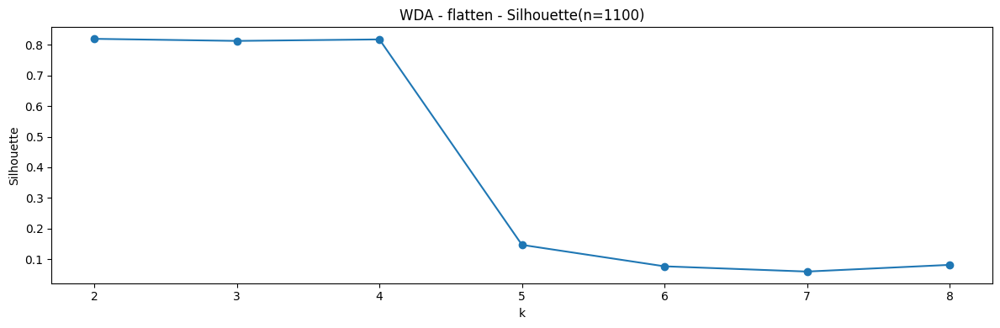

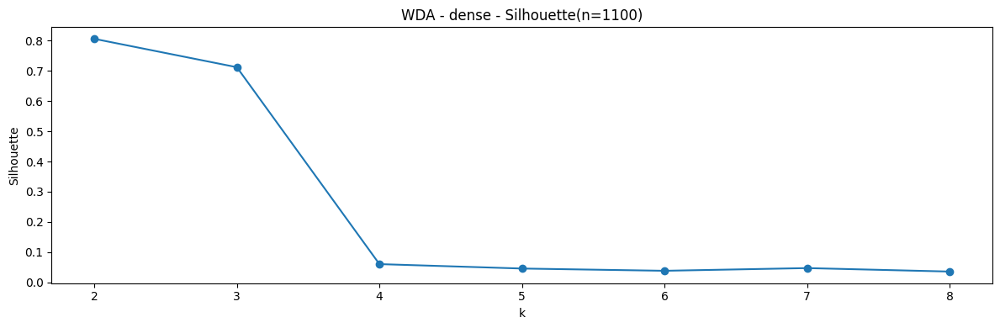

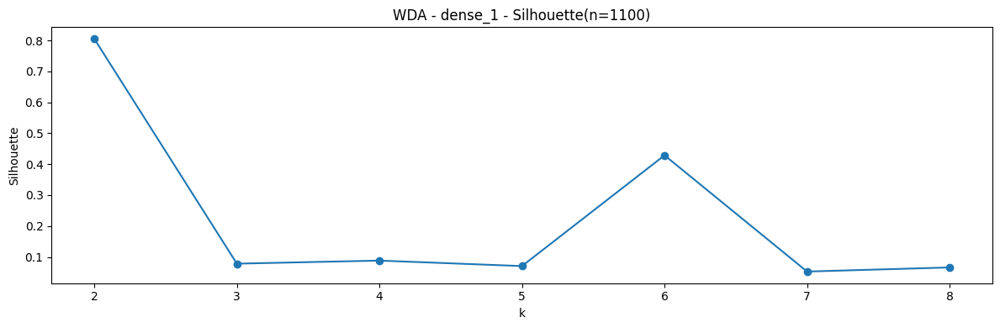

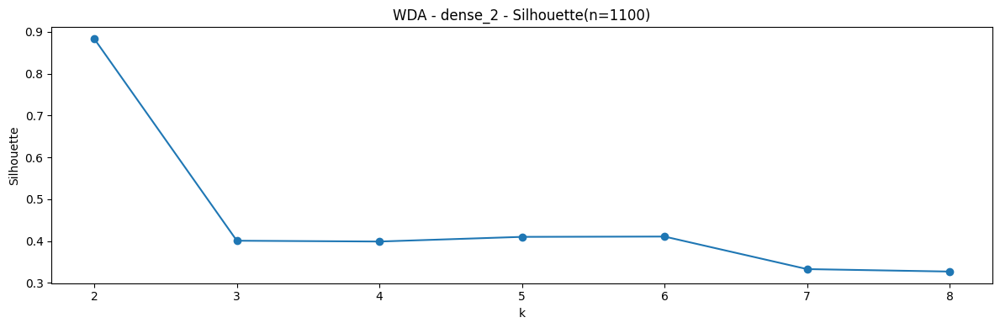

In [51]:
evaluate_kmeans_k(repr_wda_32["flatten"], "WDA", "flatten")
evaluate_kmeans_k(repr_wda_32["dense"], "WDA", "dense")
evaluate_kmeans_k(repr_wda_32["dense_1"], "WDA", "dense_1")
evaluate_kmeans_k(repr_wda_32["dense_2"], "WDA", "dense_2")

## Selección de k para Spectral Clustering: eigengap del Laplaciano (n = 1100)

El número de clusters de K-Means se seleccionó con la curva de Silhouette
(`evaluate_kmeans_k`). Para **Spectral Clustering** se emplea un criterio propio del
algoritmo: la **heurística del eigengap**, que escoge $k$ a partir del mayor salto entre
autovalores consecutivos del Laplaciano normalizado del grafo de similitud.

La razón es de coherencia metodológica: la partición de Spectral Clustering no se
construye sobre distancias a centroides, sino sobre la conectividad del grafo kNN, de modo
que el criterio de selección se deriva de esa misma estructura. En el caso ideal de $k$
componentes desconectadas, el Laplaciano tiene exactamente $k$ autovalores nulos y el
salto hasta $\lambda_{k+1}$ es máximo; cuando los grupos están débilmente conectados,
esa estructura se preserva de forma aproximada.

Se genera un gráfico por capa, mostrando los primeros autovalores y marcando el $k$
sugerido.

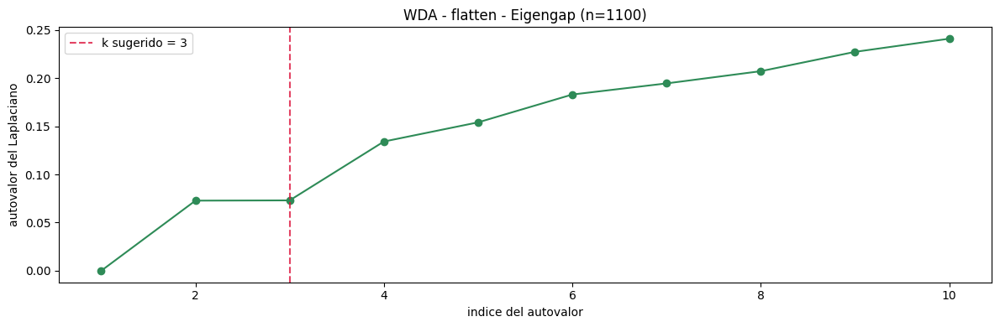

[flatten] k sugerido por eigengap = 3 (salto = 0.0611)


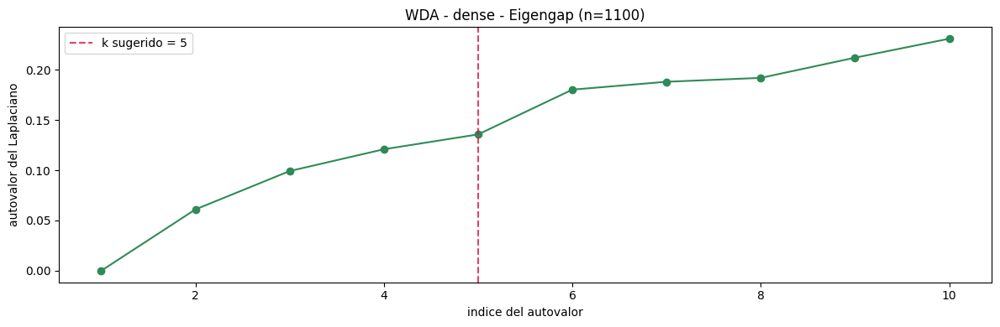

[dense] k sugerido por eigengap = 5 (salto = 0.0446)


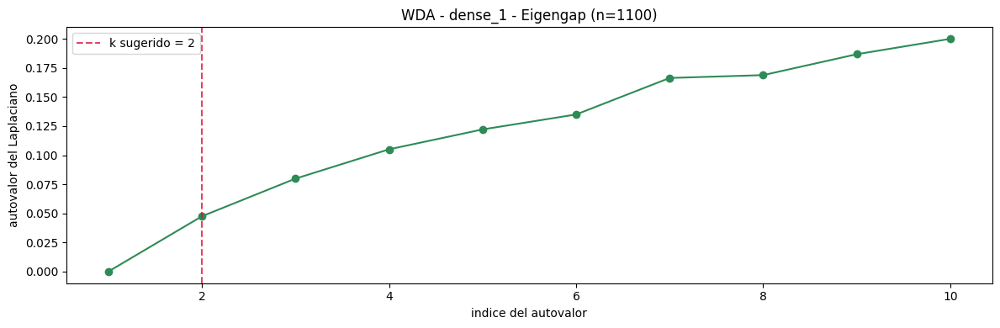

[dense_1] k sugerido por eigengap = 2 (salto = 0.0324)


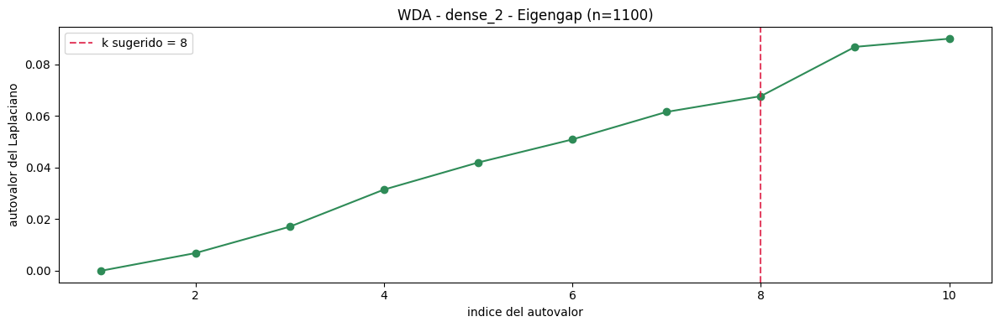

[dense_2] k sugerido por eigengap = 8 (salto = 0.0191)


In [52]:
# Eigengap por capa para WDA (n = 1100): un grafico por capa
eig_wda = {}
for capa in ["flatten", "dense", "dense_1", "dense_2"]:
    eig_wda[capa] = evaluate_eigengap_k(repr_wda_32[capa], "WDA", capa)

In [53]:
# Resumen: k sugerido por eigengap en cada capa (WDA)
resumen_eig = pd.DataFrame([
    {"capa": capa, "k_eigengap": eig_wda[capa]["k_eigengap"]}
    for capa in ["flatten", "dense", "dense_1", "dense_2"]
])
print("=== k sugerido por eigengap (WDA) ===")
display(resumen_eig)

=== k sugerido por eigengap (WDA) ===


,capa,k_eigengap
0,flatten,3
1,dense,5
2,dense_1,2
3,dense_2,8


## Evolución de k con la profundidad de la capa (WDA)

Esta sección resume cómo varía el número de clusters seleccionado al avanzar hacia capas
más profundas, usando en cada algoritmo el criterio que le corresponde:

| Algoritmo | Criterio de selección de $k$ |
|---|---|
| K-Means | máximo del Silhouette Score |
| Spectral Clustering | eigengap del Laplaciano |

Se generan **dos gráficos independientes**, uno por criterio. Una eventual disminución de
$k$ con la profundidad sería coherente con la compactación progresiva del espacio latente,
es decir, con la pérdida de variabilidad ---y por tanto de subestructura potencial--- a
medida que la representación se especializa en la tarea de clasificación original (sesgo
funcional).

In [54]:
# Tabla resumen por capa (WDA)
# Reutiliza los resultados de eigengap ya calculados (eig_wda) si estan disponibles.
tabla_k_capa = resumen_k_por_capa(
    repr_wda_32,
    "WDA",
    eig_precalculado=globals().get("eig_wda")
)

print("=== k seleccionado por capa (WDA) ===")
display(tabla_k_capa)

  [flatten] meseta en k=[2, 3, 4] -> k seleccionado = 4 (sil = 0.8169)
  [dense] meseta en k=[2] -> k seleccionado = 2 (sil = 0.8064)
  [dense_1] meseta en k=[2] -> k seleccionado = 2 (sil = 0.8051)
  [dense_2] meseta en k=[2] -> k seleccionado = 2 (sil = 0.8831)
=== k seleccionado por capa (WDA) ===


,capa,k_silhouette,silhouette,k_eigengap,gap
0,flatten,4,0.8169,3,0.0611
1,dense,2,0.8064,5,0.0446
2,dense_1,2,0.8051,2,0.0324
3,dense_2,2,0.8831,8,0.0191


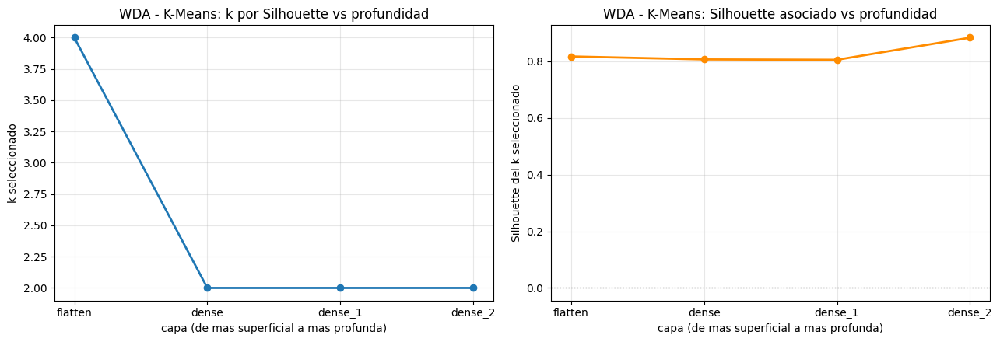

In [55]:
# Grafico 1 - K-Means: evolucion del k por Silhouette y de su score
plot_k_vs_capa_kmeans(tabla_k_capa, "WDA")

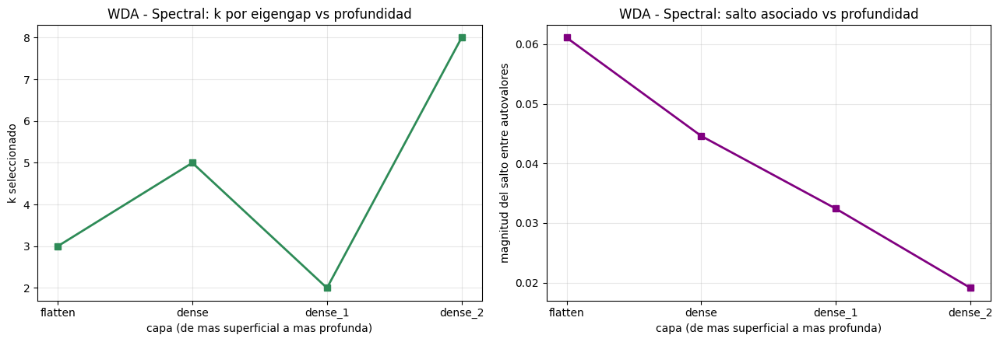

In [56]:
# Grafico 2 - Spectral Clustering: evolucion del k por eigengap y del salto asociado
plot_k_vs_capa_eigengap(tabla_k_capa, "WDA")

## Ejecución de los algoritmos de clustering sobre el espacio de 32D (WDA)

Definidos ya el número de clusters de cada algoritmo (Silhouette para K-Means, eigengap
para Spectral Clustering) y los hiperparámetros de DBSCAN, en esta sección se ejecutan los
tres algoritmos sobre el espacio latente de 32 dimensiones.
Para inspeccionar visualmente el resultado, cada partición se proyecta a dos dimensiones
mediante PCA y t-SNE. El orden importa: **primero se agrupa en 32D y después se reduce
para visualizar**, de modo que las proyecciones no influyen en la partición, solo permiten
observarla.

Se emplea la función `cluster_and_plot()`, que ejecuta los tres algoritmos y los presenta
apilados en una misma figura. Se invoca dos veces por capa, una por cada método de
proyección, de modo que para cada capa se obtienen dos figuras comparables: una en PCA y
otra en t-SNE. Contrastarlas permite distinguir las estructuras robustas, visibles en
ambas proyecciones, de los artefactos propios de una proyección en particular.

In [57]:
# Configuracion: k por algoritmo (segun el criterio de cada uno) e hiperparametros DBSCAN
CAPAS = ["flatten", "dense", "dense_1", "dense_2"]

# k de K-Means  -> criterio del Silhouette  (columna k_silhouette)
# k de Spectral -> criterio del eigengap    (columna k_eigengap)
k_kmeans   = dict(zip(tabla_k_capa["capa"], tabla_k_capa["k_silhouette"]))
k_spectral = dict(zip(tabla_k_capa["capa"], tabla_k_capa["k_eigengap"]))

# hiperparametros de DBSCAN
DBSCAN_EPS         = 1.5
DBSCAN_MIN_SAMPLES = 10

print("k K-Means  :", k_kmeans)
print("k Spectral :", k_spectral)
print(f"DBSCAN     : eps={DBSCAN_EPS}, min_samples={DBSCAN_MIN_SAMPLES}")

k K-Means  : {'flatten': 4, 'dense': 2, 'dense_1': 2, 'dense_2': 2}
k Spectral : {'flatten': 3, 'dense': 5, 'dense_1': 2, 'dense_2': 8}
DBSCAN     : eps=1.5, min_samples=10



CAPA: flatten   |   k_kmeans=4   k_spectral=3


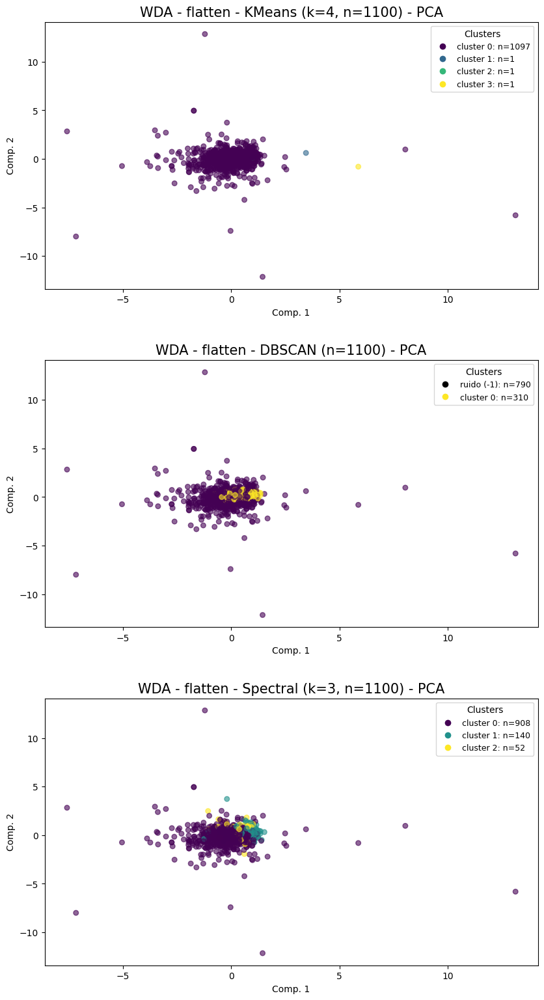

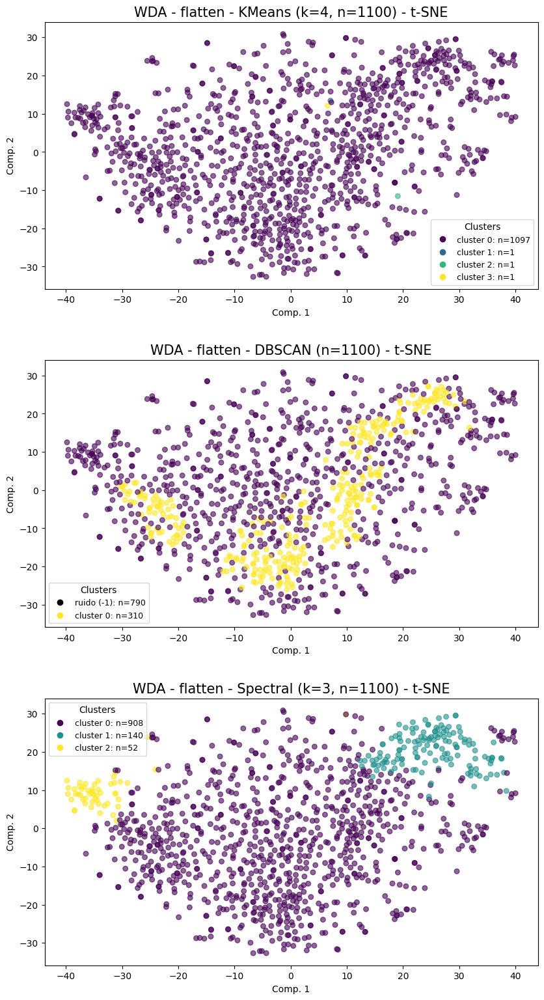


CAPA: dense   |   k_kmeans=2   k_spectral=5


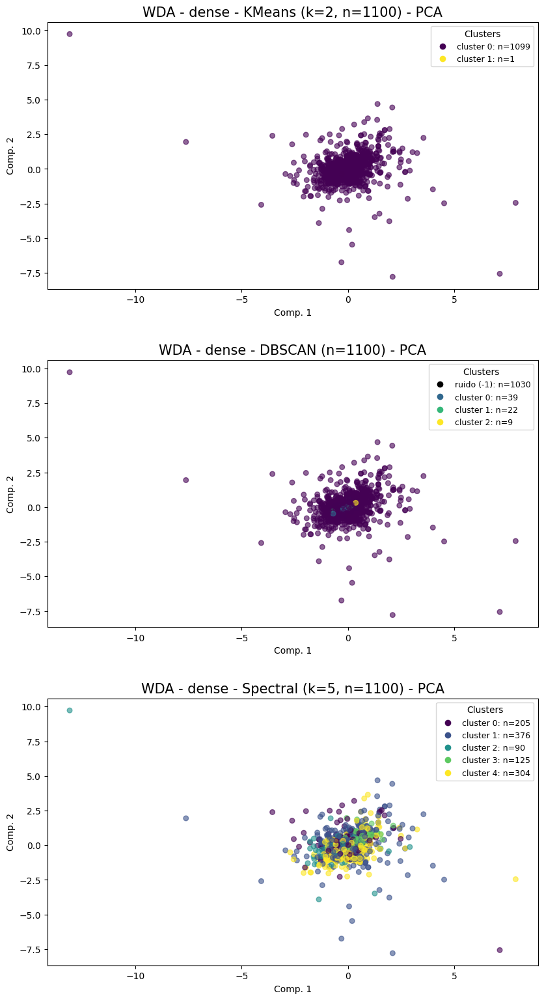

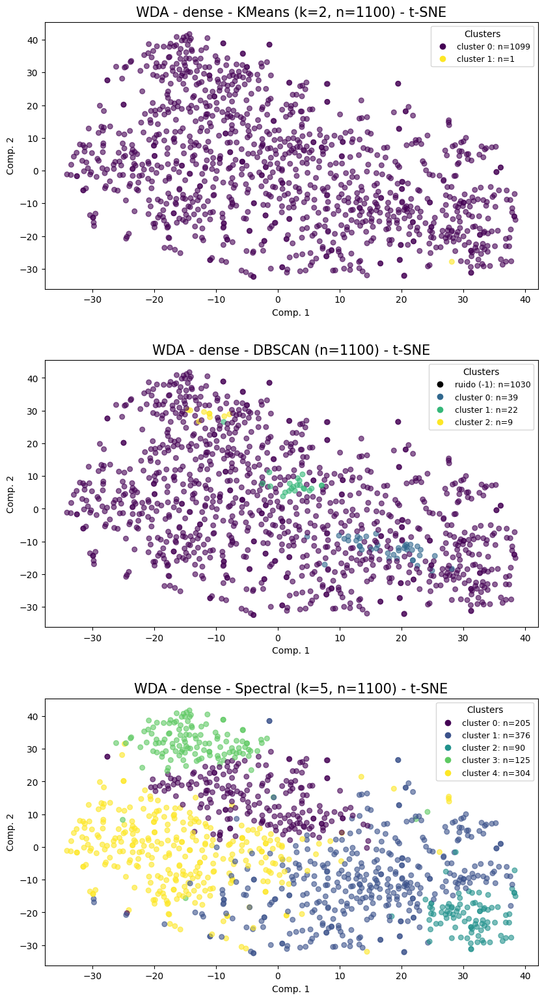


CAPA: dense_1   |   k_kmeans=2   k_spectral=2


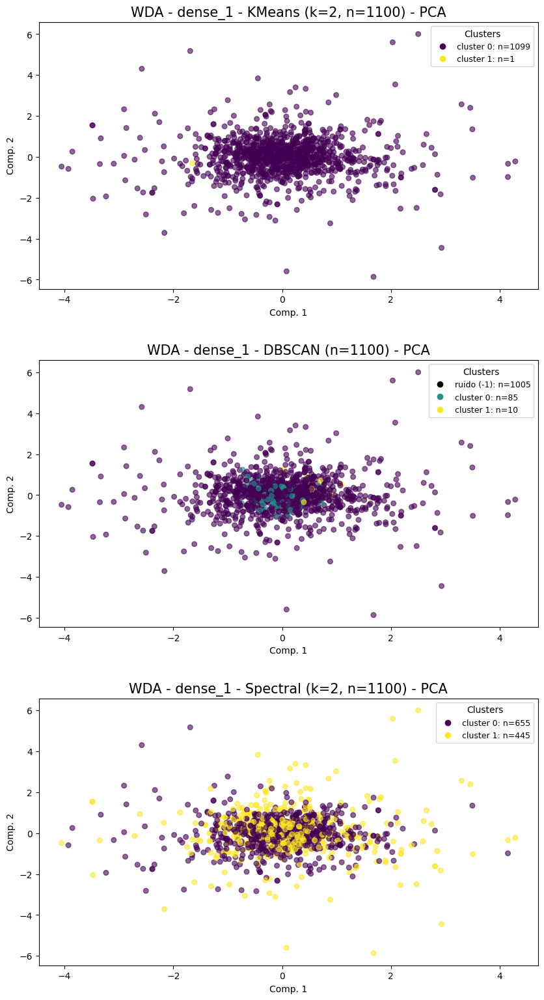

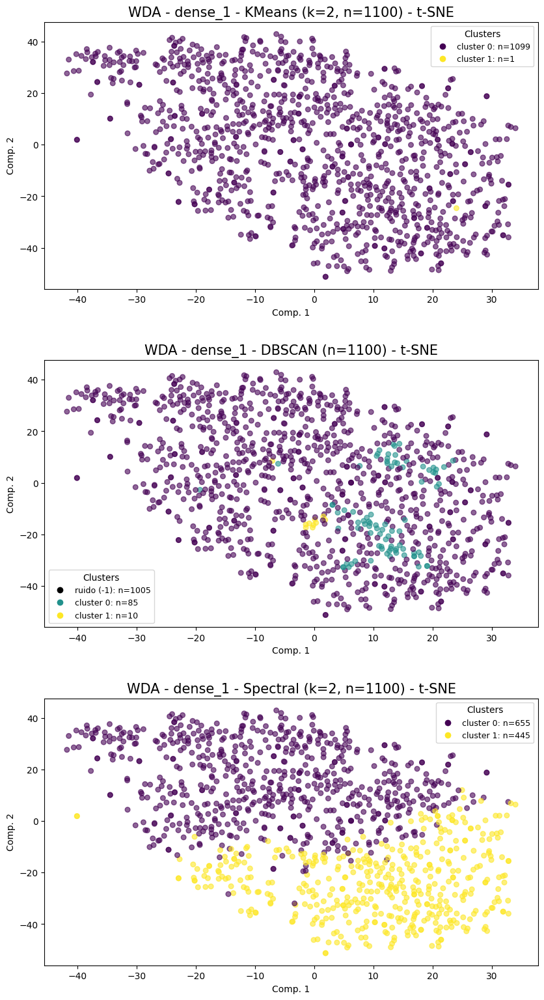


CAPA: dense_2   |   k_kmeans=2   k_spectral=8


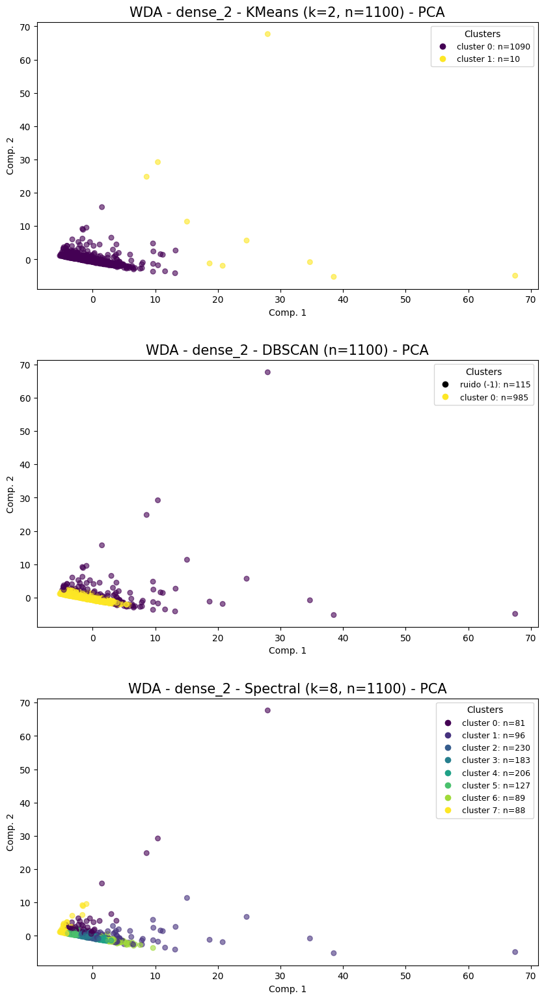

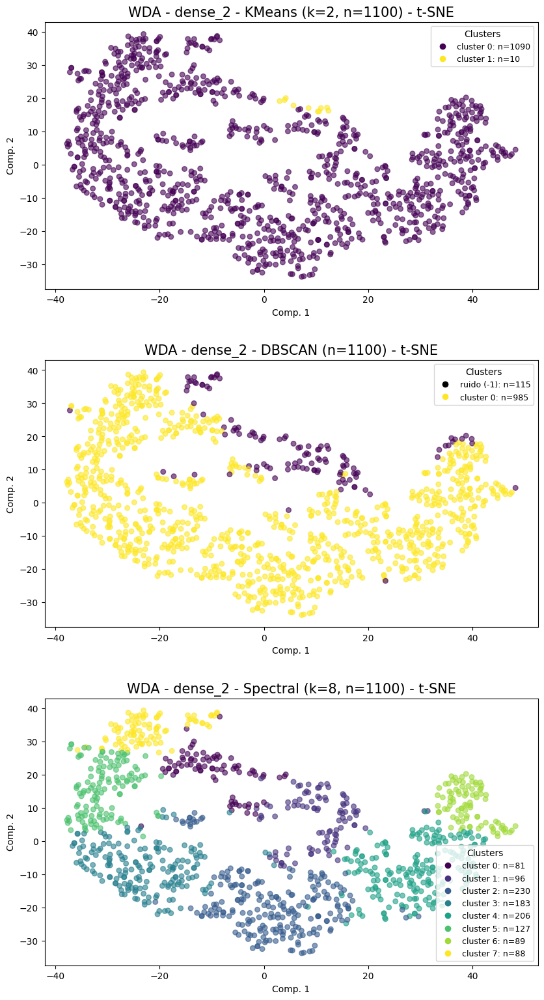

In [58]:
# Ejecucion sobre todas las capas: una figura en PCA y otra en t-SNE por capa
# (los tres algoritmos aparecen apilados dentro de cada figura)

res_clustering = {}

for capa in CAPAS:
    print("\n" + "=" * 78)
    print(f"CAPA: {capa}   |   k_kmeans={k_kmeans[capa]}   k_spectral={k_spectral[capa]}")
    print("=" * 78)

    for vis in ["pca", "tsne"]:
        res = cluster_and_plot(
            repr_wda_32[capa], "WDA", capa,
            kmeans_k           = int(k_kmeans[capa]),
            spectral_k         = int(k_spectral[capa]),
            dbscan_eps         = DBSCAN_EPS,
            dbscan_min_samples = DBSCAN_MIN_SAMPLES,
            vis_method         = vis
        )

        # Las etiquetas no dependen de la proyeccion (los tres algoritmos son
        # deterministas con random_state fijo), de modo que se guardan una sola vez.
        if vis == "pca":
            res_clustering[capa] = res
            for metodo, labels in res.items():
                save_cluster_labels(cluster_labels_all, "WDA", capa, metodo, labels)

In [59]:
# Tabla comparativa de los tres algoritmos por capa
filas = []
for capa in CAPAS:
    Xs = StandardScaler().fit_transform(repr_wda_32[capa])
    for metodo, labels in res_clustering[capa].items():
        mtr   = compute_cluster_metrics(Xs, labels)
        n_pts = int(np.sum(labels != -1))
        dbcv  = dbcv_score(Xs, labels) if (metodo == "dbscan" and 2 <= mtr["n_clusters"] and n_pts <= 5000) else None
        filas.append({
            "capa"       : capa,
            "algoritmo"  : metodo,
            "n_clusters" : mtr["n_clusters"],
            "n_ruido"    : mtr["n_noise"],
            "silhouette" : mtr["silhouette"],
            "davies_b"   : mtr["davies_bouldin"],
            "calinski_h" : mtr["calinski_harabasz"],
            "DBCV"       : dbcv
        })

tabla_clustering = pd.DataFrame(filas).sort_values(["capa", "algoritmo"]).reset_index(drop=True)
print("=== Resultados de clustering sobre el espacio 32D (WDA) ===")
display(tabla_clustering)

=== Resultados de clustering sobre el espacio 32D (WDA) ===


,capa,algoritmo,n_clusters,n_ruido,silhouette,davies_b,calinski_h,DBCV
0,dense,dbscan,3,1030,0.289126,1.243667,25.6442,-0.246530
1,dense,kmeans,2,0,0.806429,0.131851,34.8481,NaN
2,dense,spectral,5,0,-0.057705,3.820103,20.7556,NaN
3,dense_1,dbscan,2,1005,0.146244,1.547066,10.4406,-0.329359
4,dense_1,kmeans,2,0,0.805079,0.132460,34.5566,NaN
5,dense_1,spectral,2,0,0.083096,5.121860,25.1293,NaN
6,dense_2,dbscan,1,115,NaN,NaN,NaN,NaN
7,dense_2,kmeans,2,0,0.883110,1.088573,377.4764,NaN
8,dense_2,spectral,8,0,0.138195,1.585997,84.4139,NaN
9,flatten,dbscan,1,790,NaN,NaN,NaN,NaN


## Gráficos t-SNE y PCA -> para Spectral Clustering y DBSCAN 

### Resultados $\textbf{capa flatten}$, con Spectral Clustering + tSNE y PCA para n=1100


#### Spectral Clustering k = 3

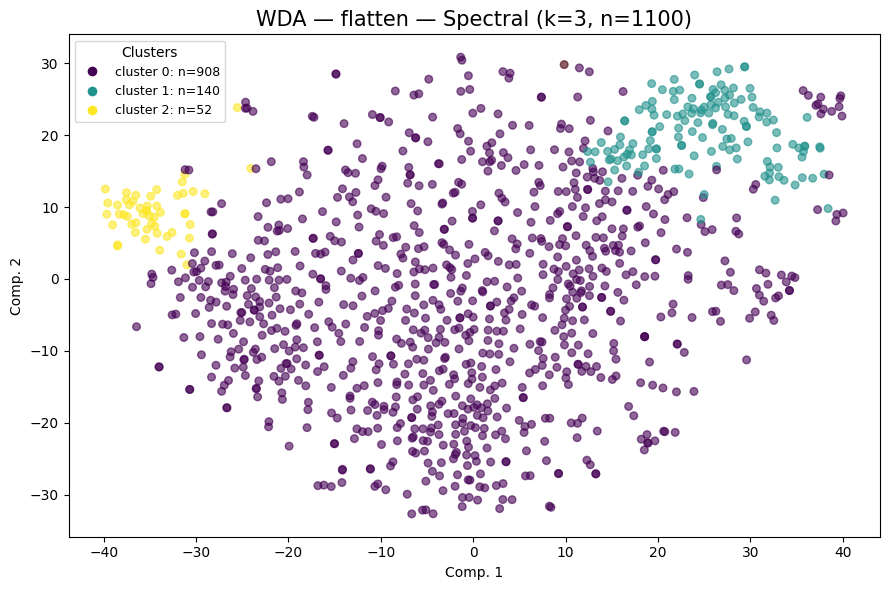


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=3
  │  clusters=3  noise=0  sil=-0.0472  DB=2.6617  CH=20.24
  └────────────────────────────────────────────────────────────────┘



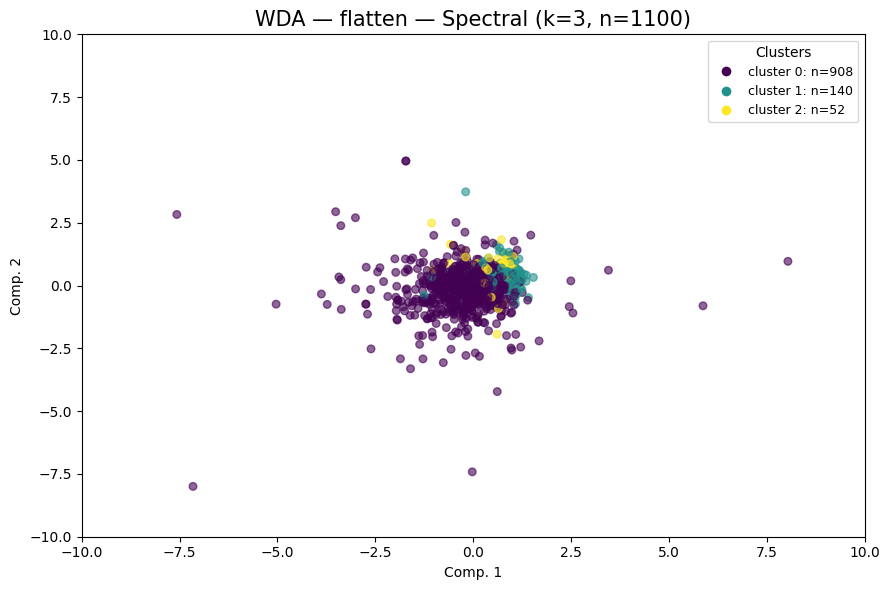


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=3
  │  clusters=3  noise=0  sil=-0.0472  DB=2.6617  CH=20.24
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([0, 1, 0, ..., 0, 0, 0]),
 'metrics': {'n_clusters': 3,
  'n_noise': 0,
  'silhouette': -0.047206,
  'davies_bouldin': 2.661654,
  'calinski_harabasz': 20.2384}}

In [60]:
res_k3=cluster_plot_Spect(
            repr_wda_32["flatten"],
            "WDA",
            "flatten",
            spectral_k=3,
            vis_method="tsne",
            container=cluster_labels_all
        )

labels_flatten_k3 = res_k3["spectral"]
cluster_plot_Spect(
            repr_wda_32["flatten"],
            "WDA",
            "flatten",
            spectral_k=3, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10)
        )
        


#### Spectral Clustering k = 4

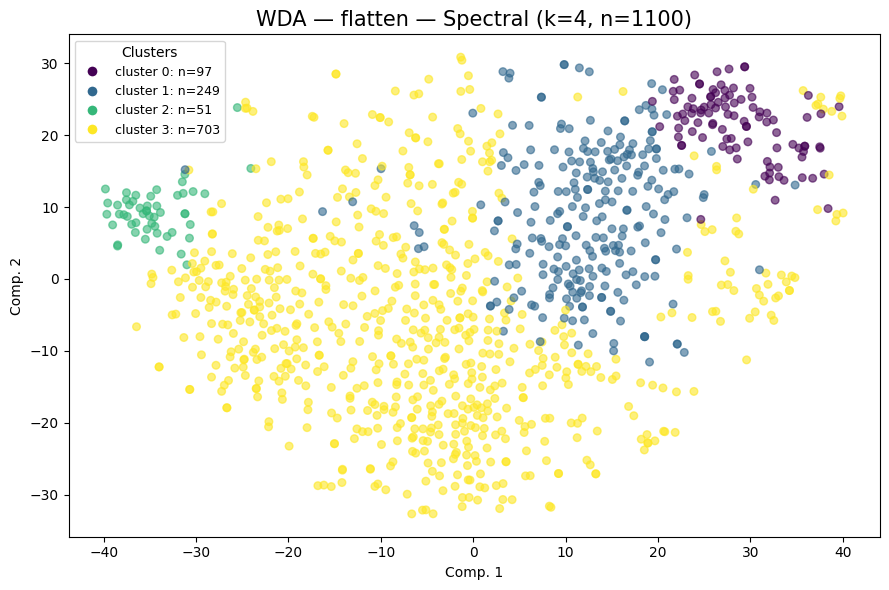


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=4
  │  clusters=4  noise=0  sil=-0.0258  DB=3.3007  CH=18.87
  └────────────────────────────────────────────────────────────────┘



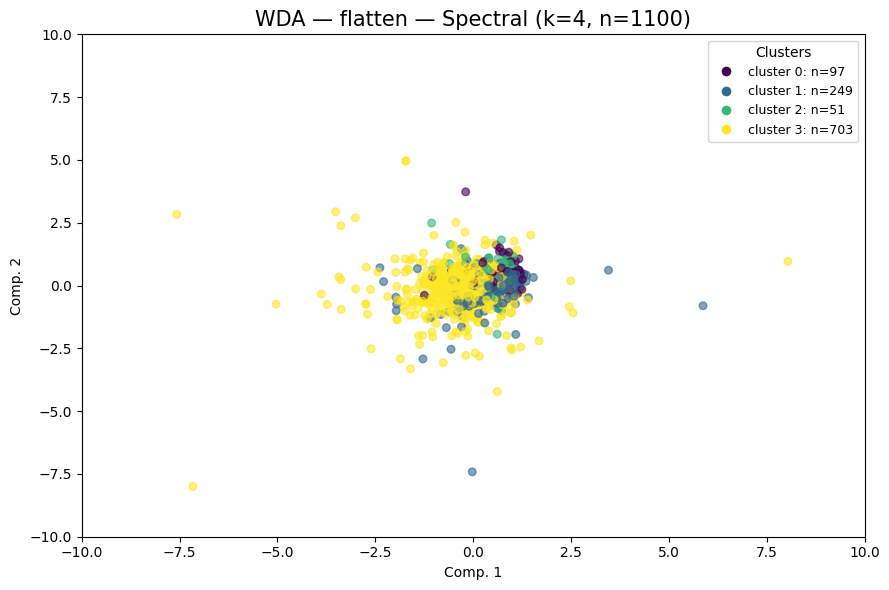


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=4
  │  clusters=4  noise=0  sil=-0.0258  DB=3.3007  CH=18.87
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([3, 1, 3, ..., 3, 3, 3]),
 'metrics': {'n_clusters': 4,
  'n_noise': 0,
  'silhouette': -0.025797,
  'davies_bouldin': 3.300675,
  'calinski_harabasz': 18.8727}}

In [61]:
res_k4 = cluster_plot_Spect(
            repr_wda_32["flatten"],
            "WDA",
            "flatten",
            spectral_k=4,
            vis_method="tsne",
            container=cluster_labels_all
        )
labels_flatten_k4 = res_k4["spectral"]
cluster_plot_Spect(
            repr_wda_32["flatten"],
            "WDA",
            "flatten",
            spectral_k=4, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10)
        )

#### Spectral Clustering k = 2

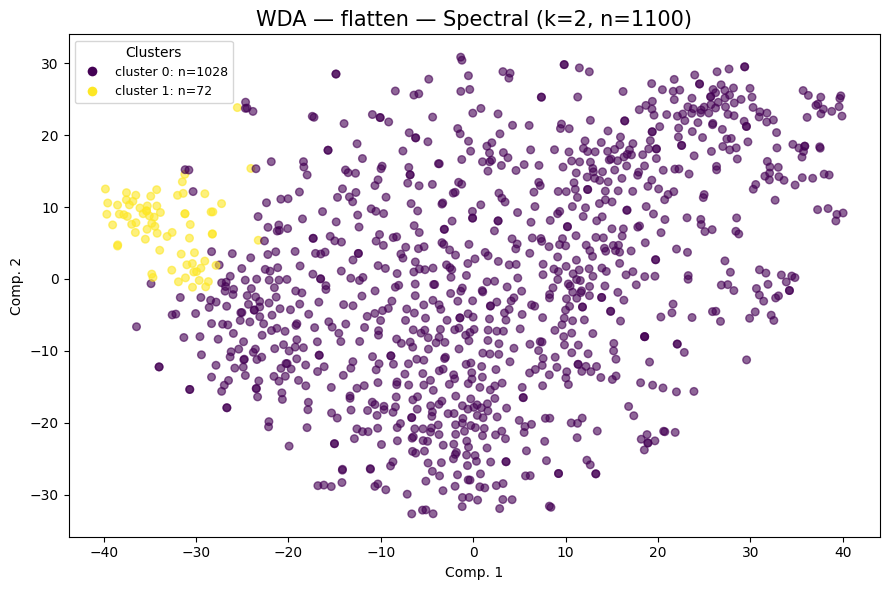


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=2
  │  clusters=2  noise=0  sil=0.0668  DB=2.2879  CH=21.49
  └────────────────────────────────────────────────────────────────┘



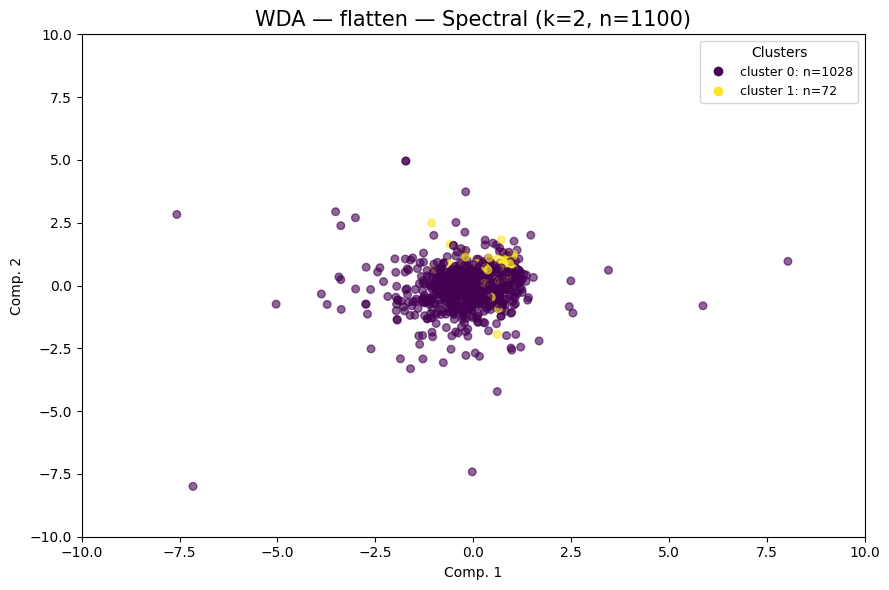


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=2
  │  clusters=2  noise=0  sil=0.0668  DB=2.2879  CH=21.49
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([0, 0, 0, ..., 0, 0, 0]),
 'metrics': {'n_clusters': 2,
  'n_noise': 0,
  'silhouette': 0.066835,
  'davies_bouldin': 2.287926,
  'calinski_harabasz': 21.4947}}

In [62]:
res_k2 = cluster_plot_Spect(
            repr_wda_32["flatten"],
            "WDA",
            "flatten",
            spectral_k=2,
            vis_method="tsne",
            container=cluster_labels_all
        )
        
labels_flatten_k2 = res_k2["spectral"]

cluster_plot_Spect(
            repr_wda_32["flatten"],
            "WDA",
            "flatten",
            spectral_k=2, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10)
        )

#### Análisis de migración de clústeres 

Se compara cómo los datos migran entre las configuraciones k=2, k=3 y k=4.  
La matriz cuenta cuántas muestras compartidas hay entre cada par de clústeres.    
Comparaciones realizadas: k=2 → k=3, k=3 → k=4, y k=2 → k=4.

Muestras en variables — k=2: [1028   72]
Muestras en variables — k=3: [908 140  52]
Muestras en variables — k=4: [ 97 249  51 703]


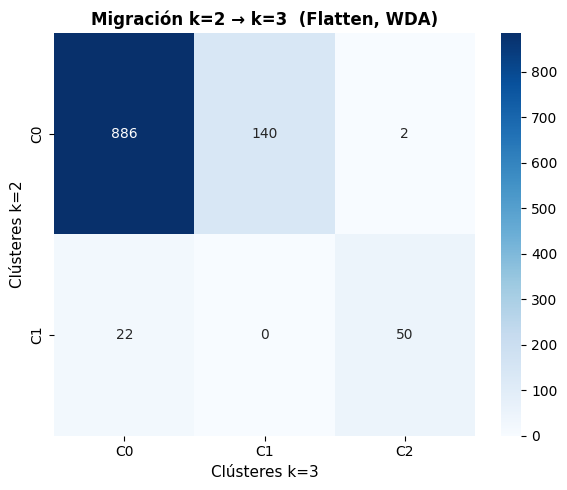

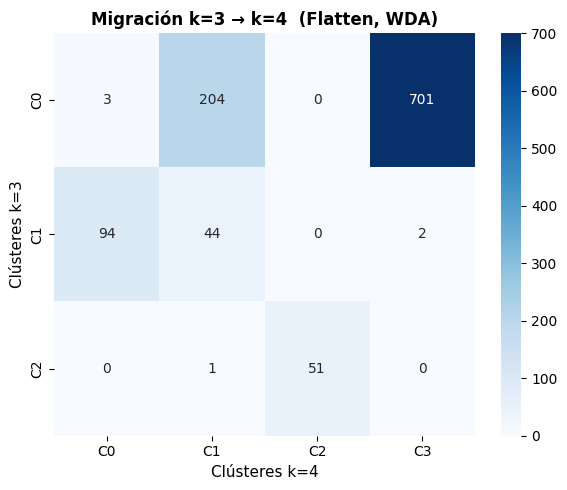

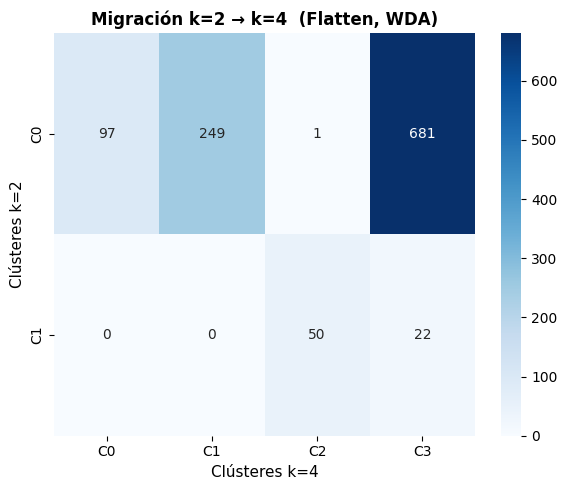

In [63]:
print(f'Muestras en variables — k=2: {np.bincount(labels_flatten_k2)}')
print(f'Muestras en variables — k=3: {np.bincount(labels_flatten_k3)}')
print(f'Muestras en variables — k=4: {np.bincount(labels_flatten_k4)}')

plot_migration_matrix(labels_flatten_k2, labels_flatten_k3, ka=2, kb=3)
plot_migration_matrix(labels_flatten_k3, labels_flatten_k4, ka=3, kb=4)
plot_migration_matrix(labels_flatten_k2, labels_flatten_k4, ka=2, kb=4)

#### Espectros obtenidos de Spectral Clustering para k=3 y n=1100

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


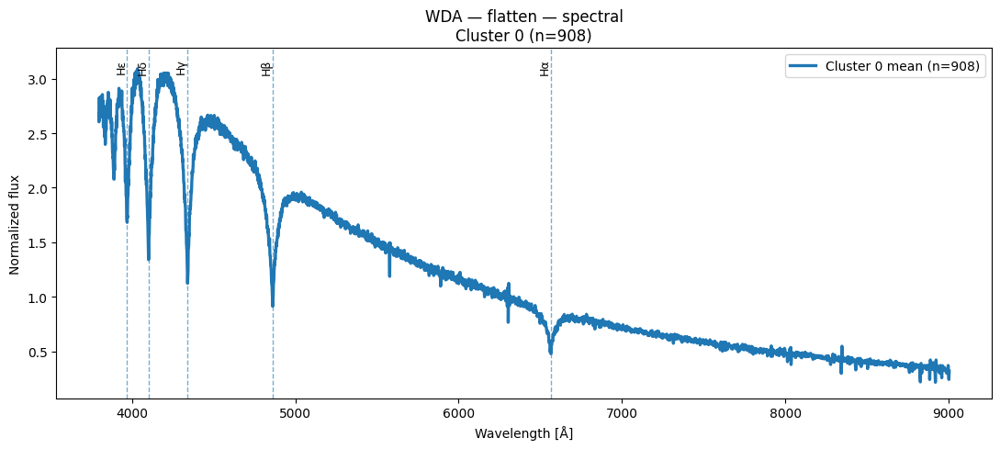

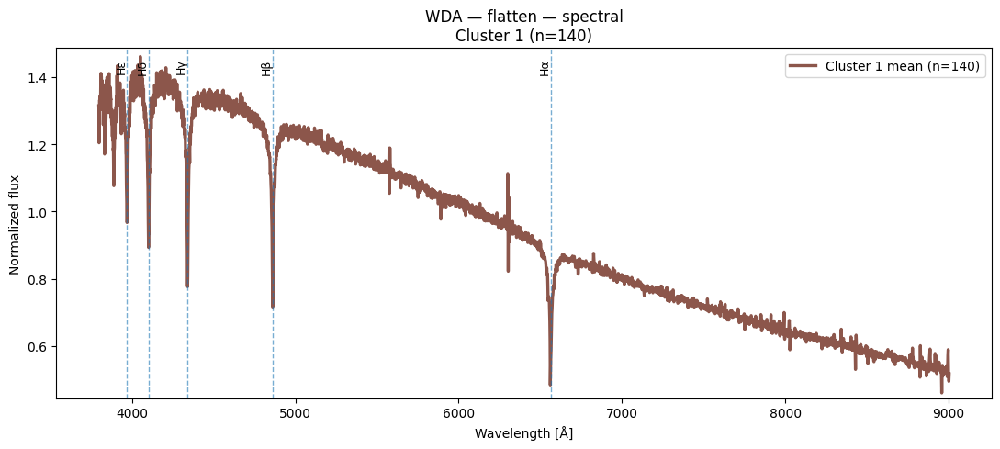

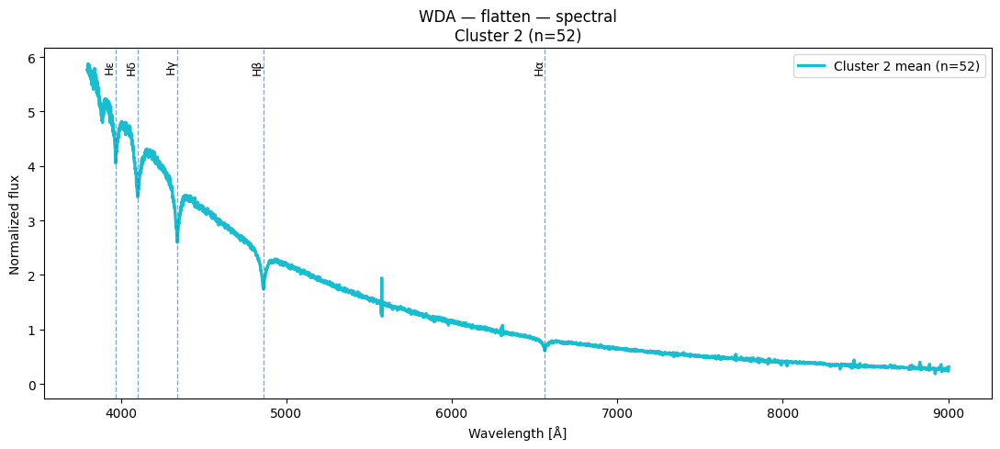

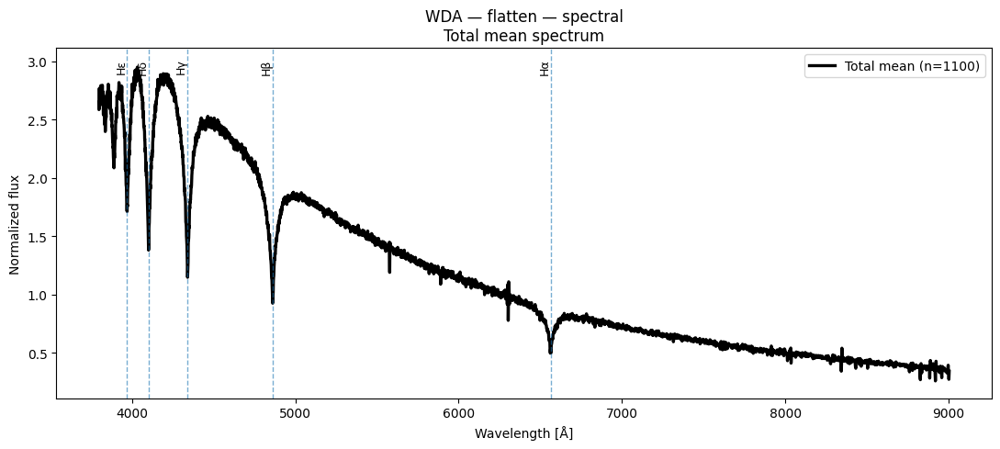

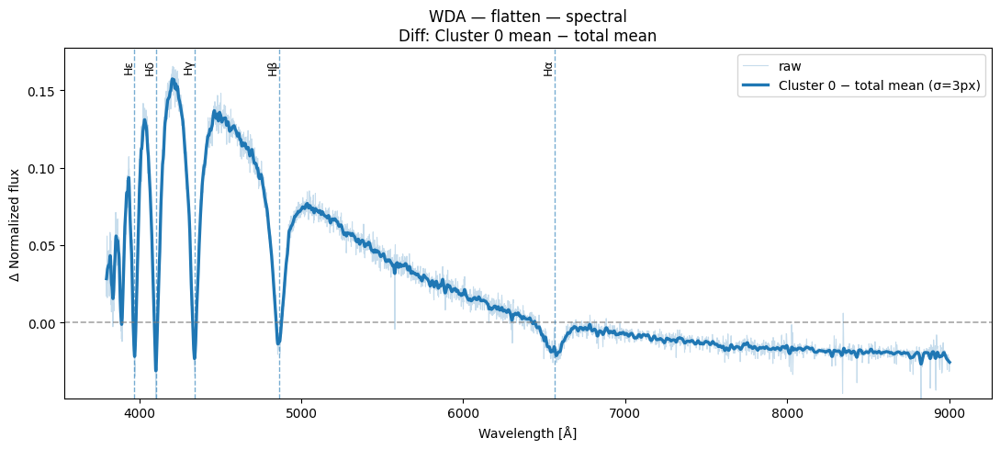

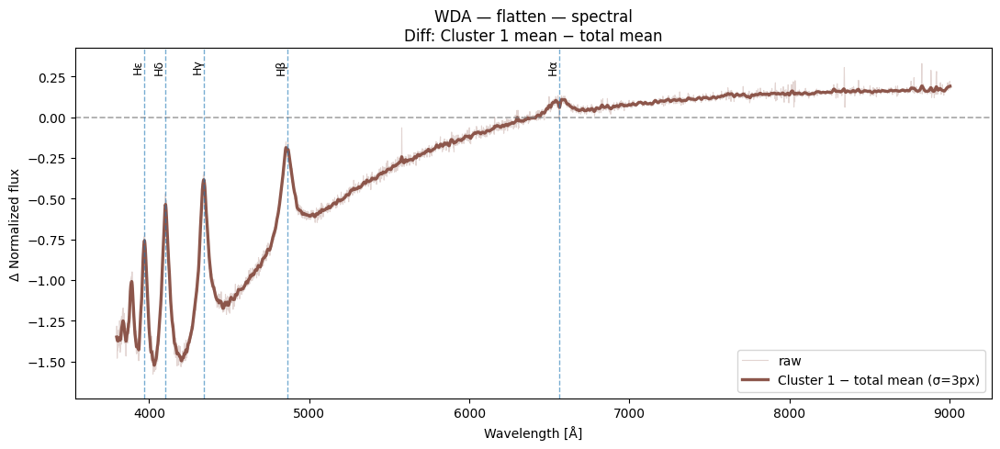

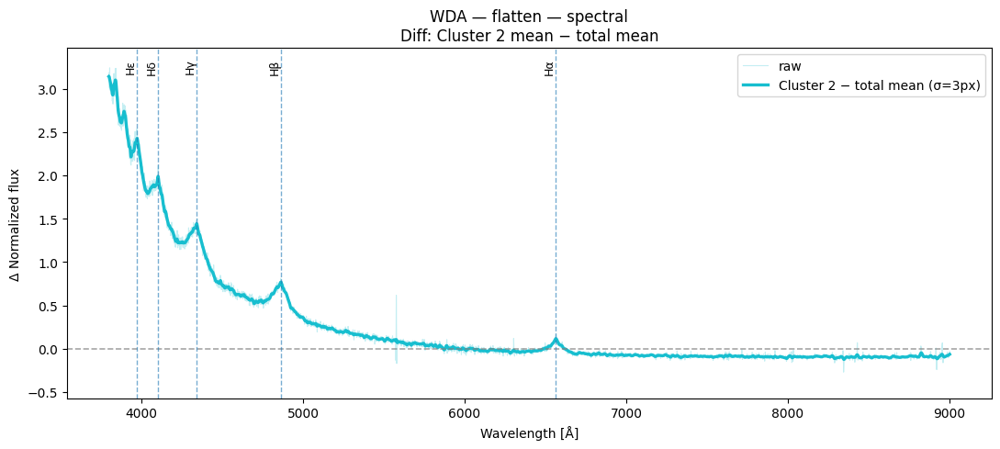

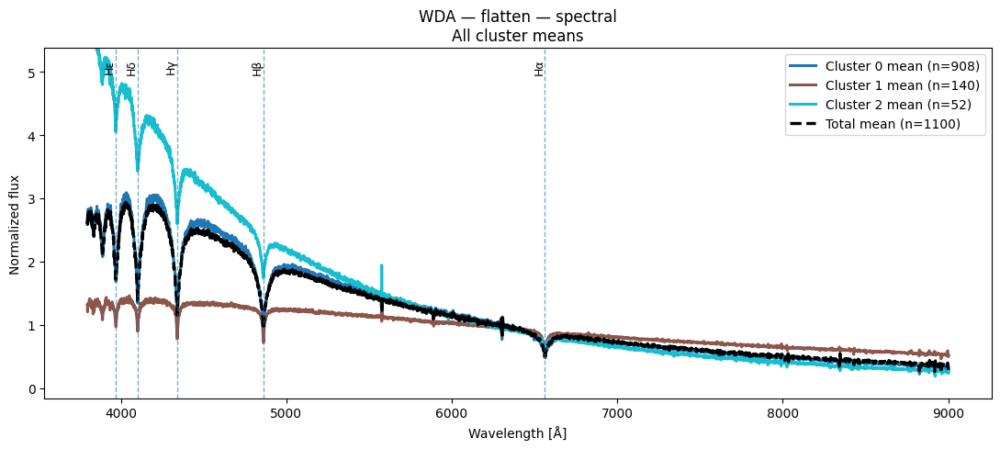

"\nlabel_counts = {c: int(np.sum(labels_flatten_k3 == c)) \n                for c in np.unique(labels_flatten_k3)}\nbalmer_df = compute_balmer_depths(result['group_means'], W_wda[0],\n                                  'WDA', 'flatten', 'spectral',\n                                  label_counts=label_counts)\nprint(balmer_df.to_string(index=False))\nplot_balmer_comparison(balmer_df, metric='depth')\nplot_balmer_comparison(balmer_df, metric='ew')\n"

In [64]:
result = plot_spectra_spectral(X_wda_spec, labels_flatten_k3, W_wda[0],
                               class_name="WDA", layer_name="flatten")
'''
label_counts = {c: int(np.sum(labels_flatten_k3 == c)) 
                for c in np.unique(labels_flatten_k3)}
balmer_df = compute_balmer_depths(result['group_means'], W_wda[0],
                                  'WDA', 'flatten', 'spectral',
                                  label_counts=label_counts)
print(balmer_df.to_string(index=False))
plot_balmer_comparison(balmer_df, metric='depth')
plot_balmer_comparison(balmer_df, metric='ew')
'''

#### Espectros obtenidos de Spectral Clustering para k=4 y n=1100

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


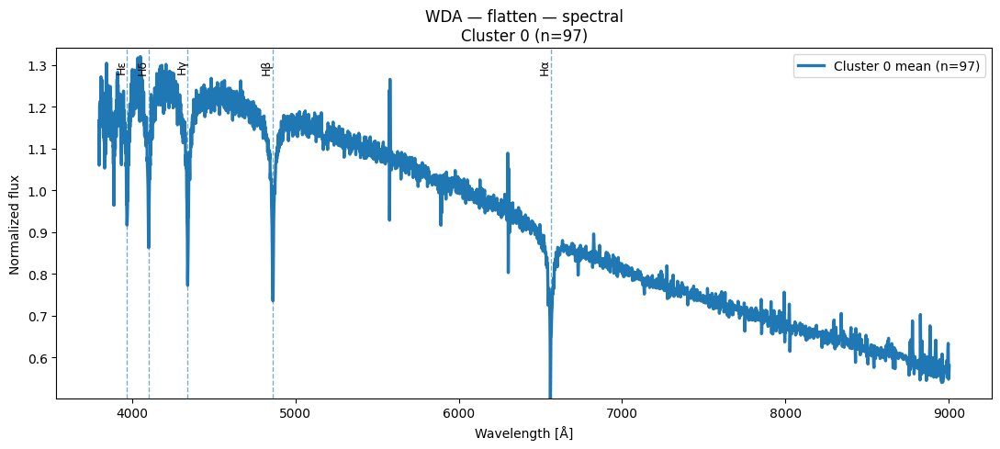

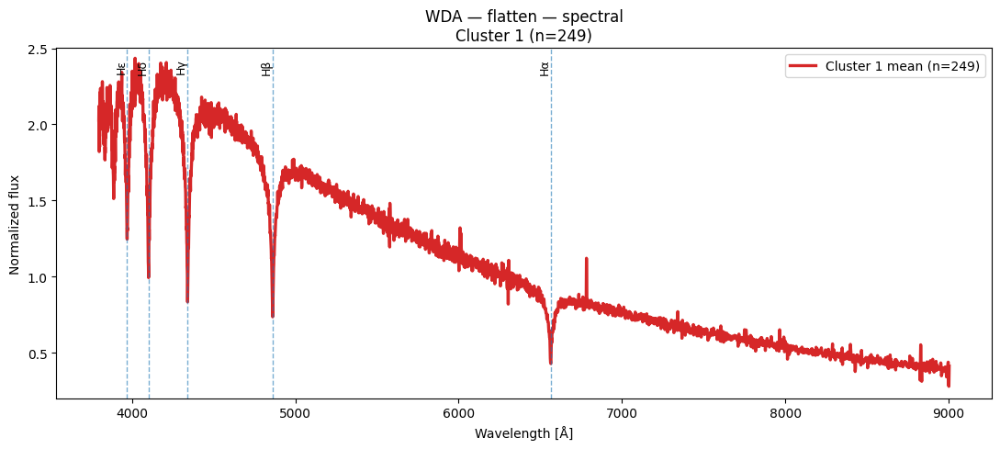

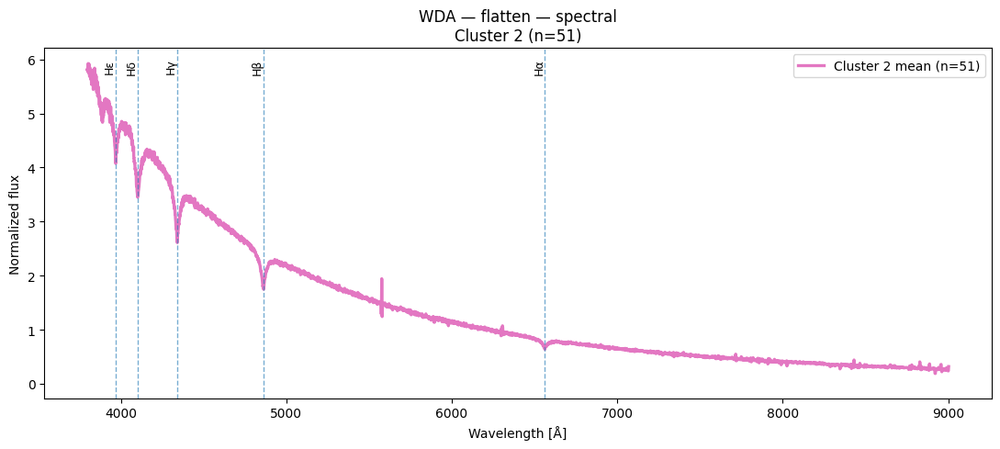

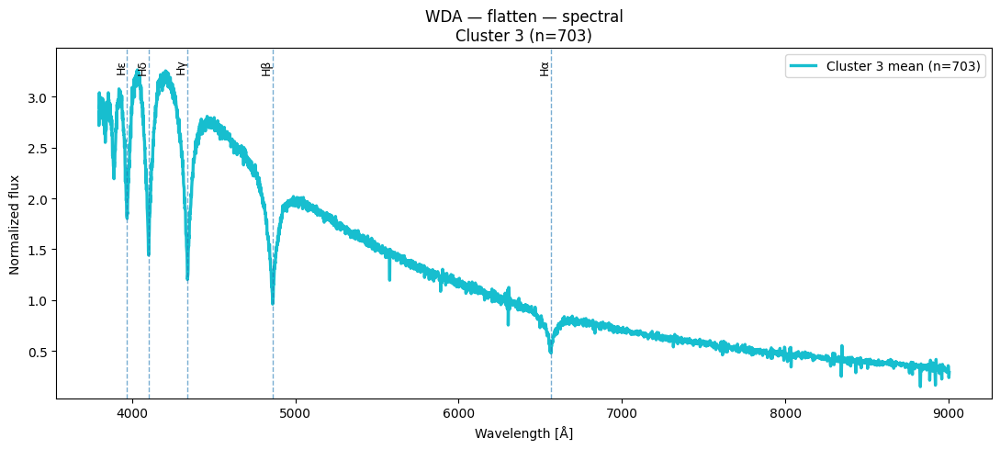

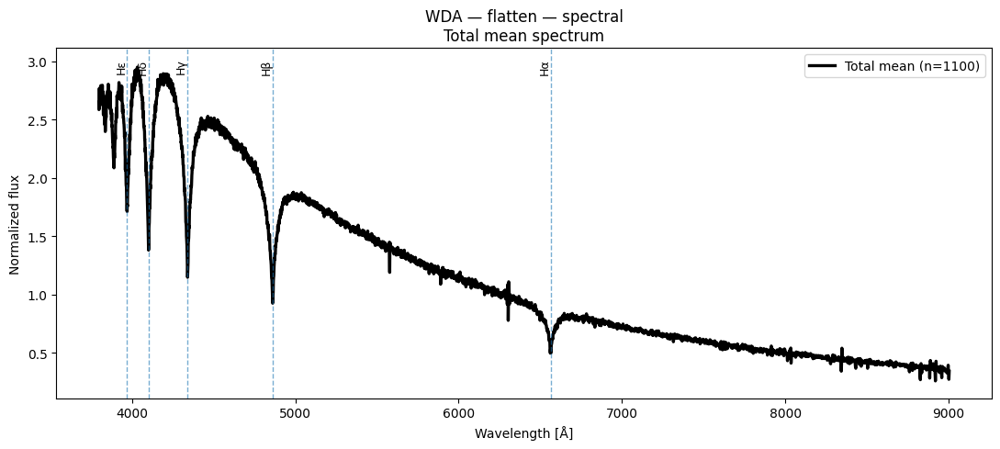

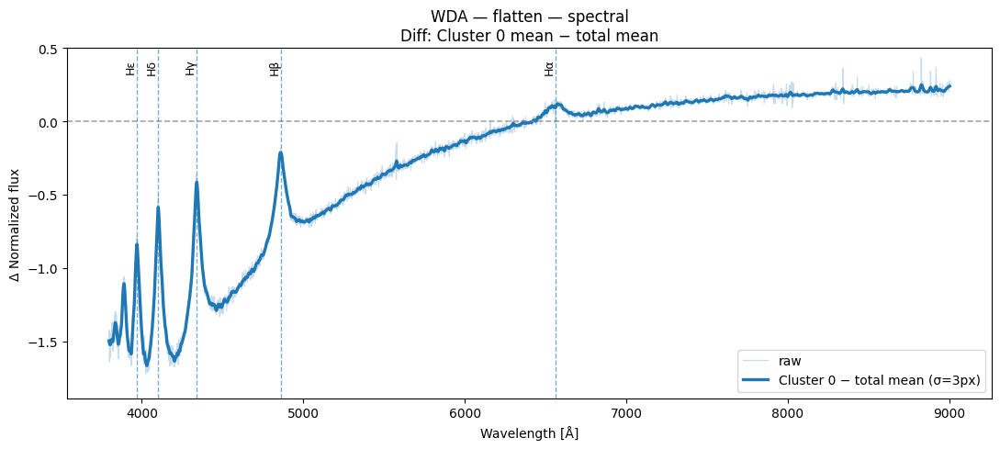

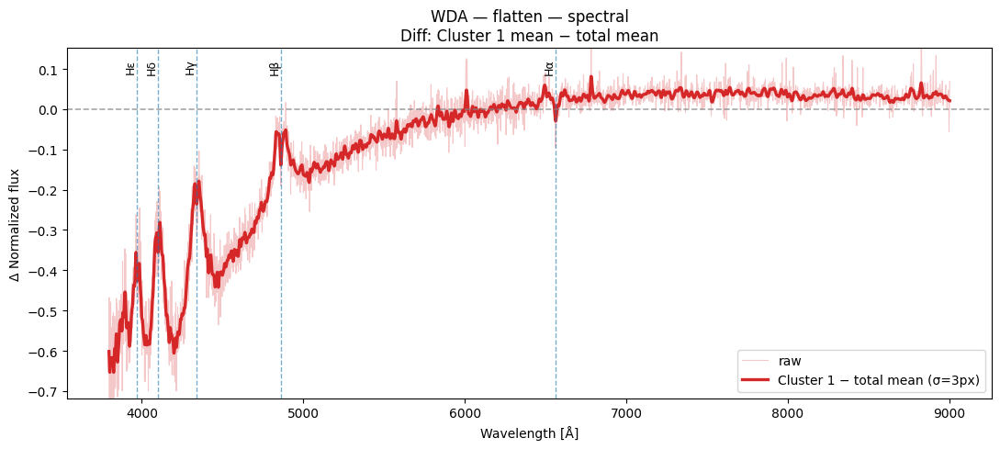

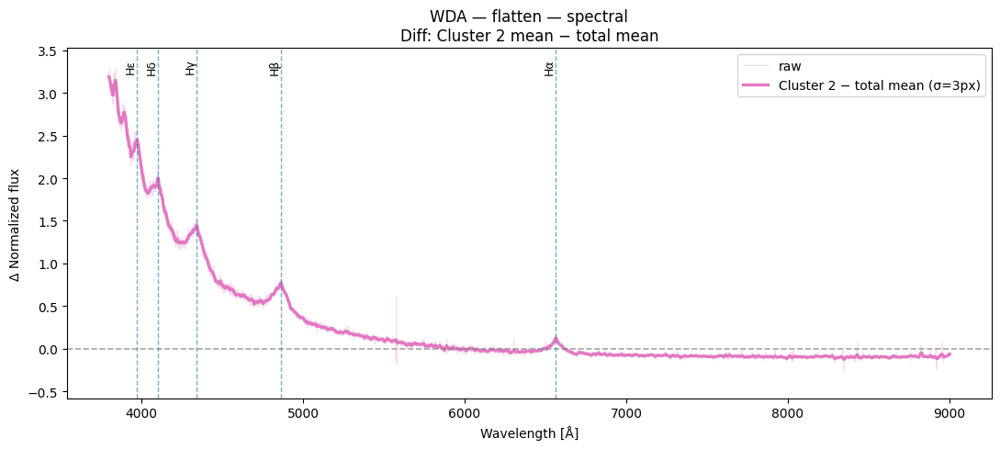

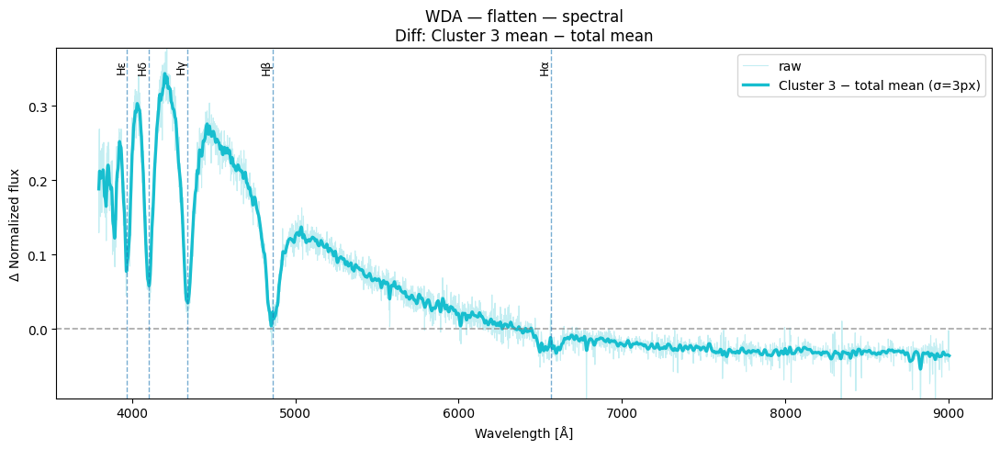

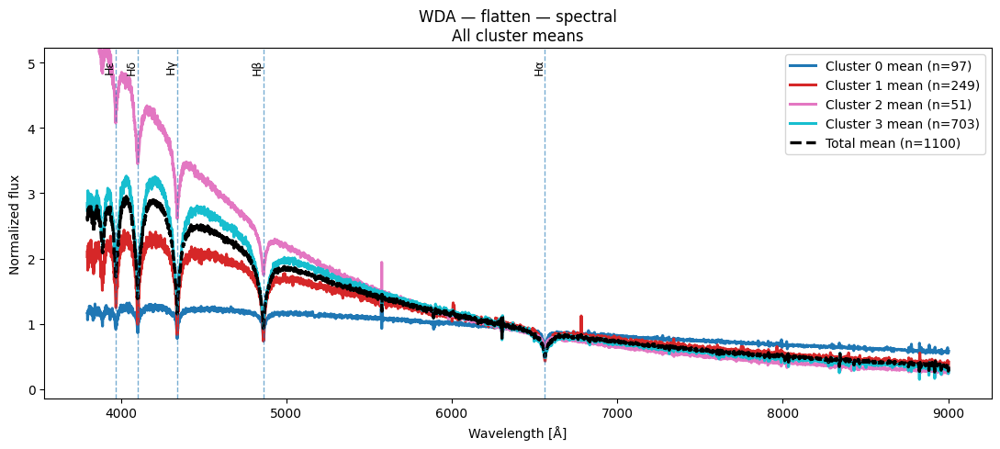

{'total_mean': array([2.6493979 , 2.5868607 , 2.5898647 , ..., 0.34275877, 0.27436805,
        0.34358275], dtype=float32),
 'group_means': {0: array([1.1657348 , 1.1637619 , 1.0596358 , ..., 0.5476993 , 0.5519154 ,
         0.58027047], dtype=float32),
  1: array([2.0275433 , 2.11929   , 2.0890515 , ..., 0.28720883, 0.27873743,
         0.4125563 ], dtype=float32),
  2: array([5.8058877 , 5.789854  , 5.8244348 , ..., 0.25032267, 0.23638035,
         0.31707752], dtype=float32),
  3: array([2.845378  , 2.7164657 , 2.743732  , ..., 0.34086254, 0.23727994,
         0.28841776], dtype=float32)},
 'unique_clusters': array([0, 1, 2, 3])}

In [65]:
plot_spectra_spectral(
    X_wda_spec,
    labels_flatten_k4,
    W_wda[0],
    class_name="WDA",
    layer_name="flatten"
)

#### Espectros obtenidos de Spectral Clustering para k=2 y n=1100

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


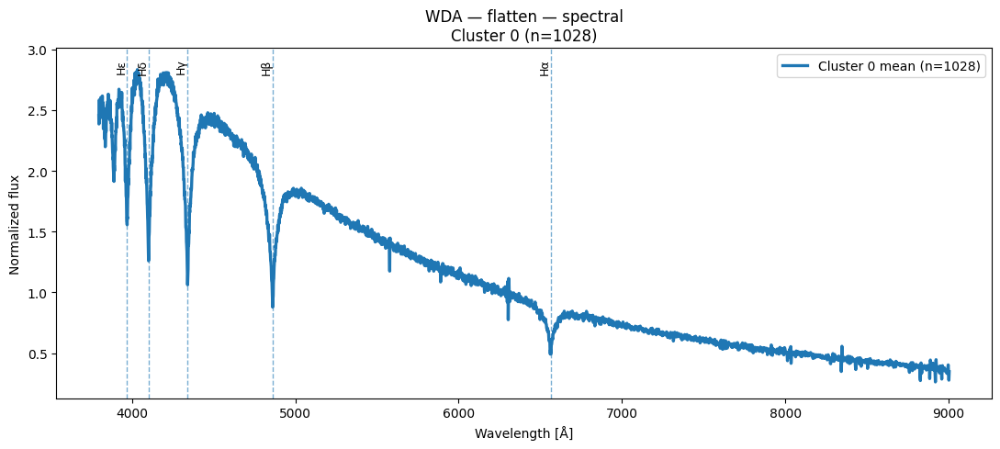

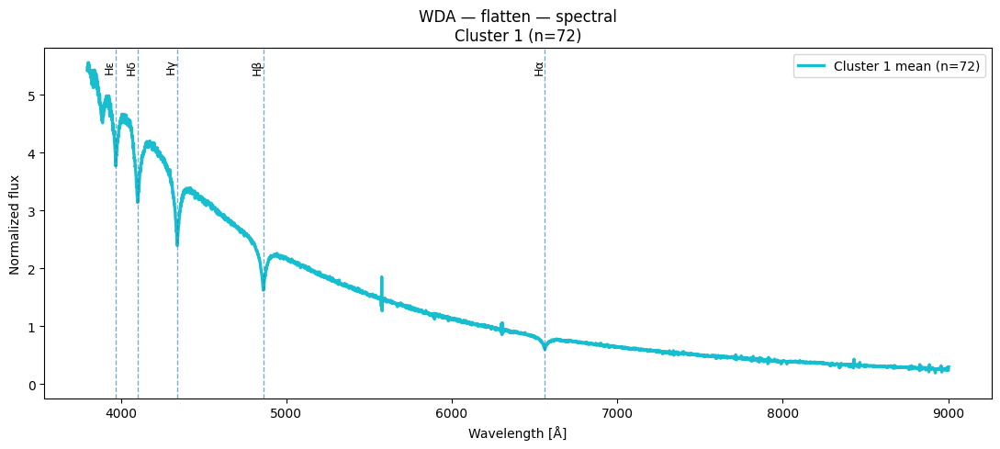

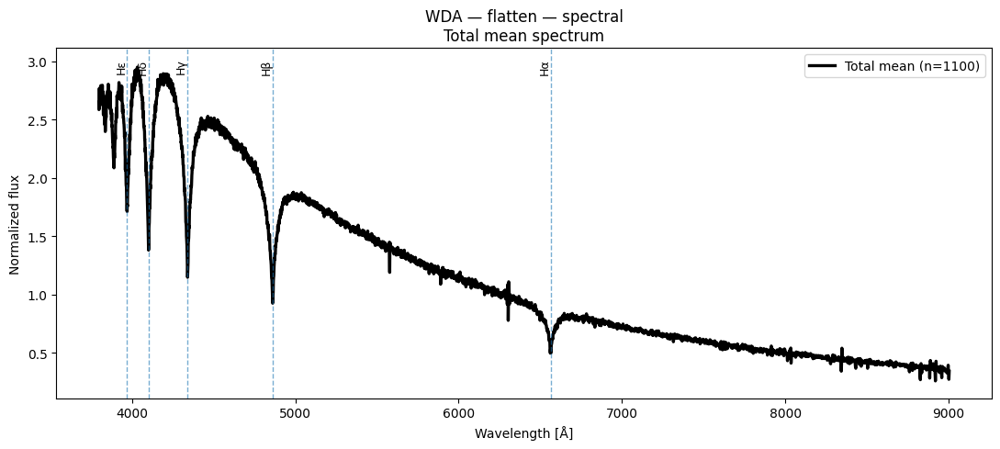

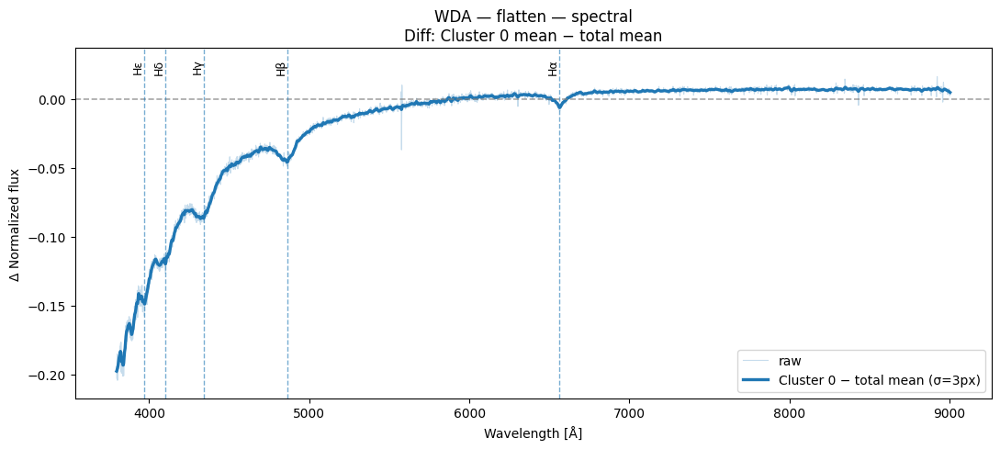

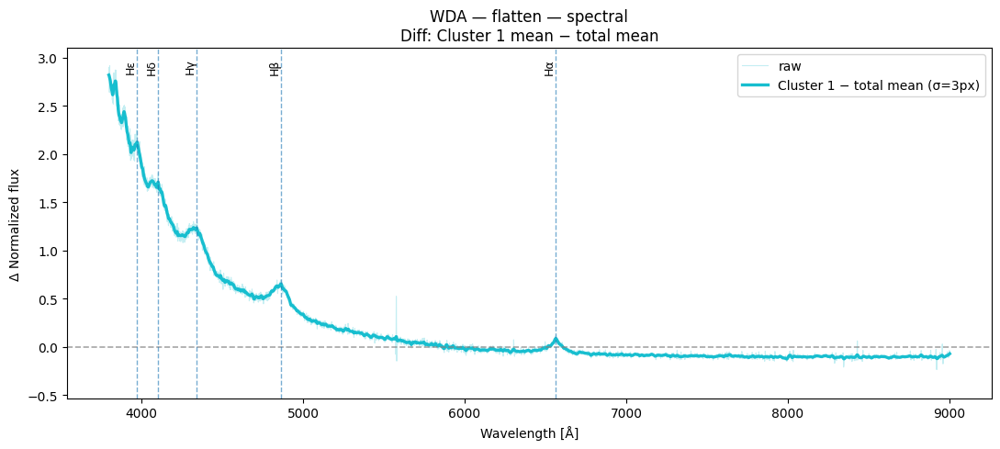

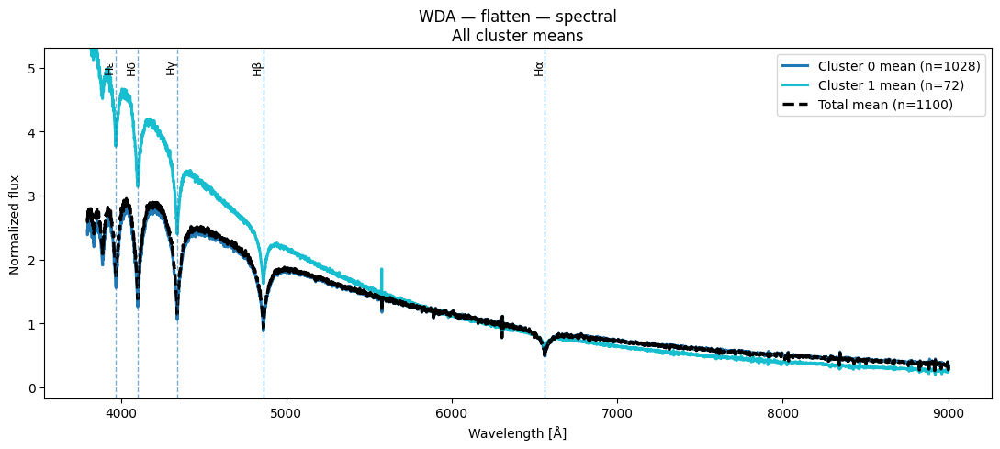

{'total_mean': array([2.6493979 , 2.5868607 , 2.5898647 , ..., 0.34275877, 0.27436805,
        0.34358275], dtype=float32),
 'group_means': {0: array([2.455049  , 2.385652  , 2.3867228 , ..., 0.34960037, 0.27687111,
         0.34664583], dtype=float32),
  1: array([5.424247  , 5.4596367 , 5.4902544 , ..., 0.24507414, 0.23862773,
         0.29984945], dtype=float32)},
 'unique_clusters': array([0, 1])}

In [66]:
plot_spectra_spectral(
    X_wda_spec,
    labels_flatten_k2,
    W_wda[0],
    class_name="WDA",
    layer_name="flatten"
)

#### Interactive de espectros obtenidos para los 3 métodos y permite seleccionar si se aplica la varianza o no

In [67]:
interactive_plot_cluster_spectra(
    spectra_2d=X_wda_spec,
    wavelength=W_wda[0],
    class_name="WDA",
    container=cluster_labels_all
)

interactive(children=(Dropdown(description='Capa:', options=('flatten', 'dense', 'dense_1', 'dense_2'), value=…

#### DBSCAN

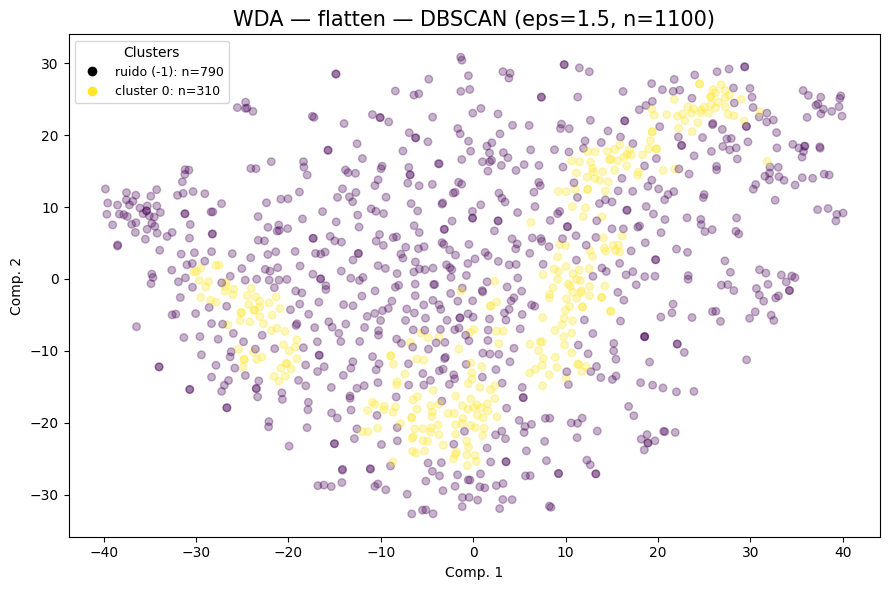


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | dbscan | eps=1.5
  │  clusters=1  noise=790  sil=N/A  DB=N/A  CH=N/A
  │  DBCV = N/A  (rango [-1,1], especifico DBSCAN)
  └────────────────────────────────────────────────────────────────┘



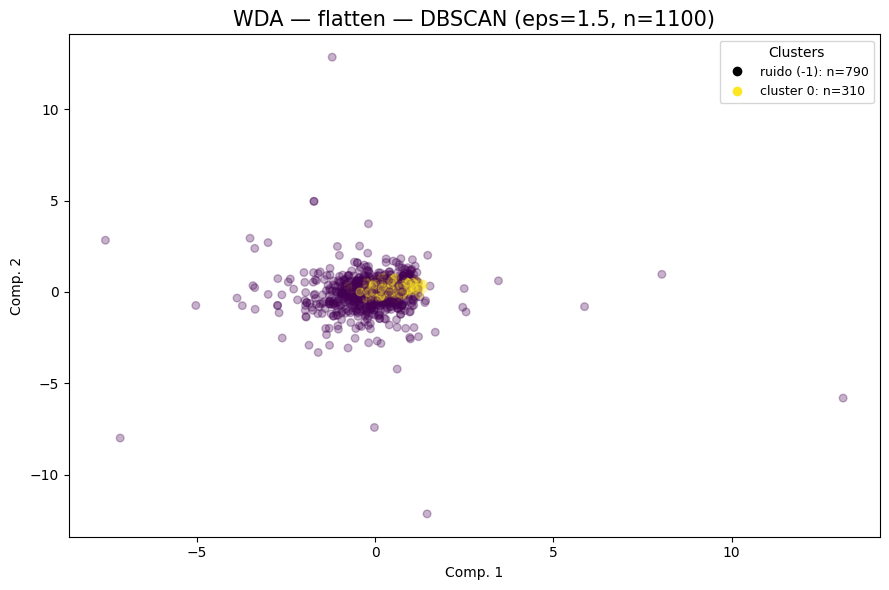


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | dbscan | eps=1.5
  │  clusters=1  noise=790  sil=N/A  DB=N/A  CH=N/A
  │  DBCV = N/A  (rango [-1,1], especifico DBSCAN)
  └────────────────────────────────────────────────────────────────┘



{'dbscan': array([ 0, -1, -1, ..., -1, -1, -1], dtype=int64),
 'metrics': {'n_clusters': 1,
  'n_noise': 790,
  'silhouette': None,
  'davies_bouldin': None,
  'calinski_harabasz': None},
 'dbcv': nan}

In [68]:
res_dbs_flatten = cluster_plot_DBSCAN(
            repr_wda_32["flatten"],
            "WDA",
            "flatten",
            dbscan_eps=1.5, 
            dbscan_min_samples=10, 
            vis_method="tsne", 
            xlim=None, 
            ylim=None,
            container=cluster_labels_all
        )
labels_dbs_flatten = res_dbs_flatten["dbscan"]
cluster_plot_DBSCAN(
            repr_wda_32["flatten"],
            "WDA",
            "flatten",
            dbscan_eps=1.5, 
            dbscan_min_samples=10, 
            vis_method="pca", 
            xlim=None, 
            ylim=None,
            container=cluster_labels_all
        )

#### Espectros obtenidos de DBSCAN n=1100

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


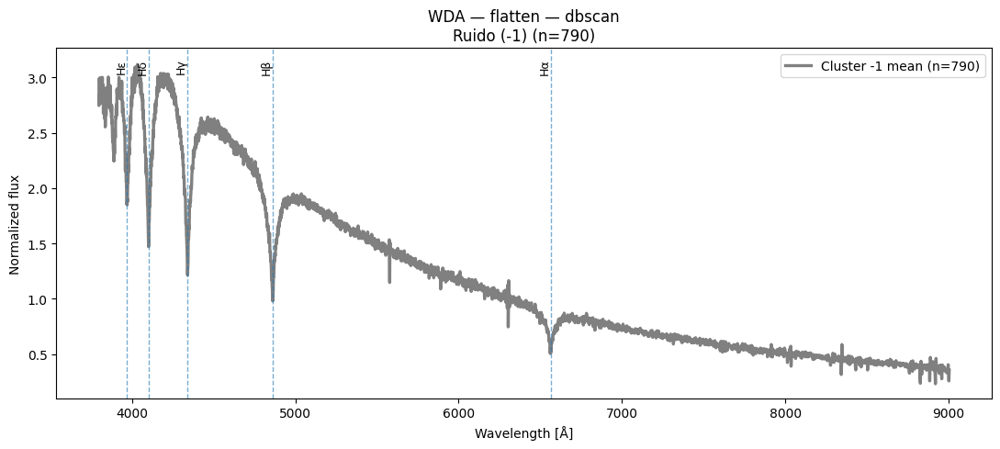

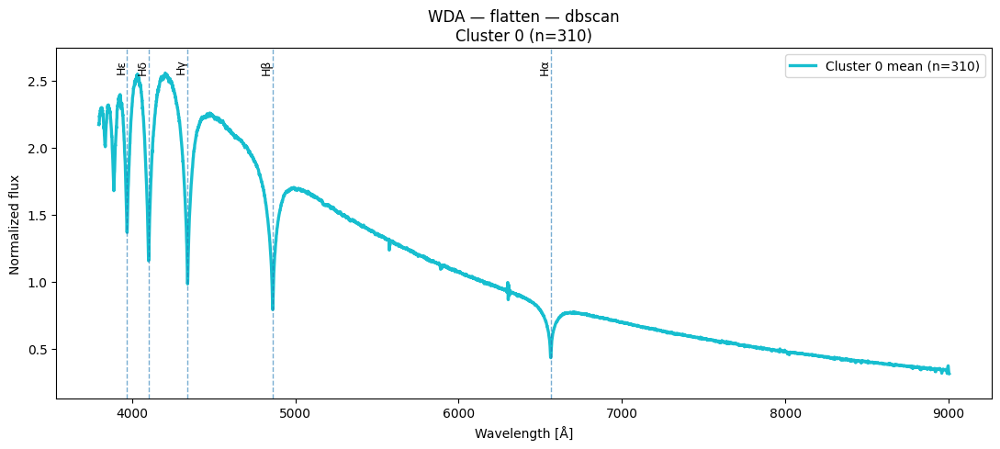

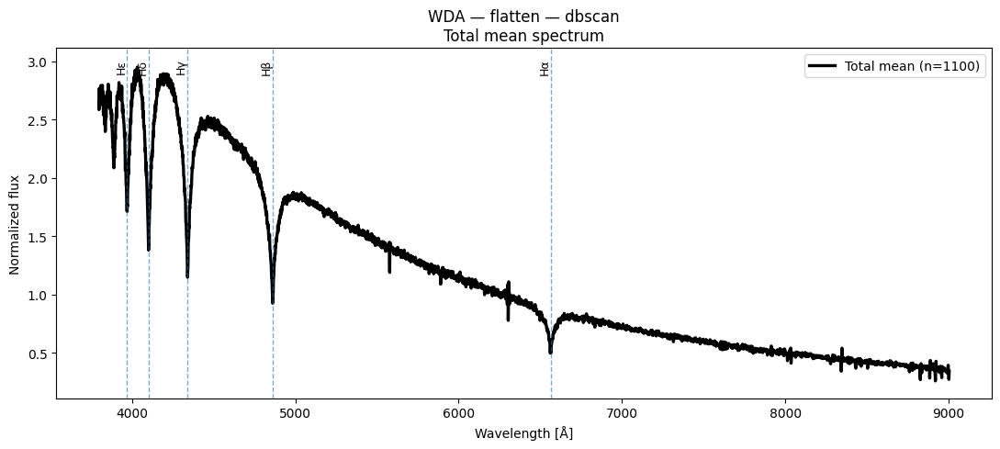

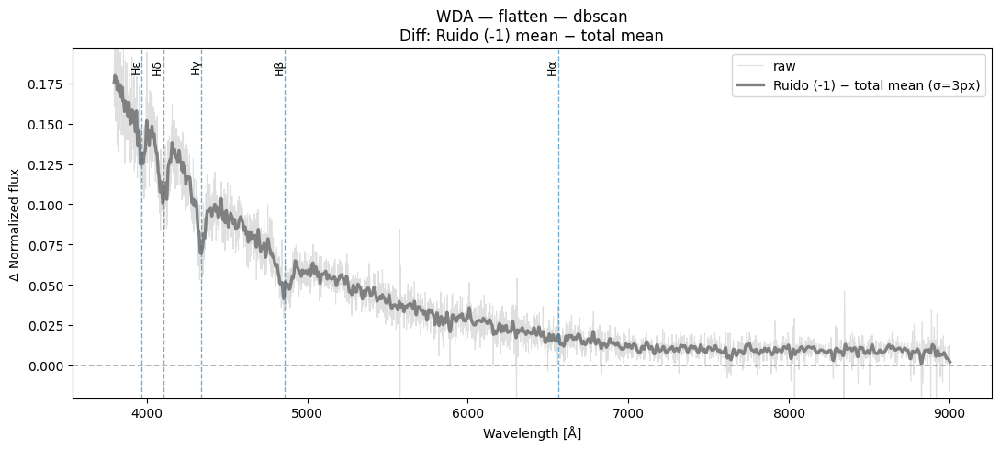

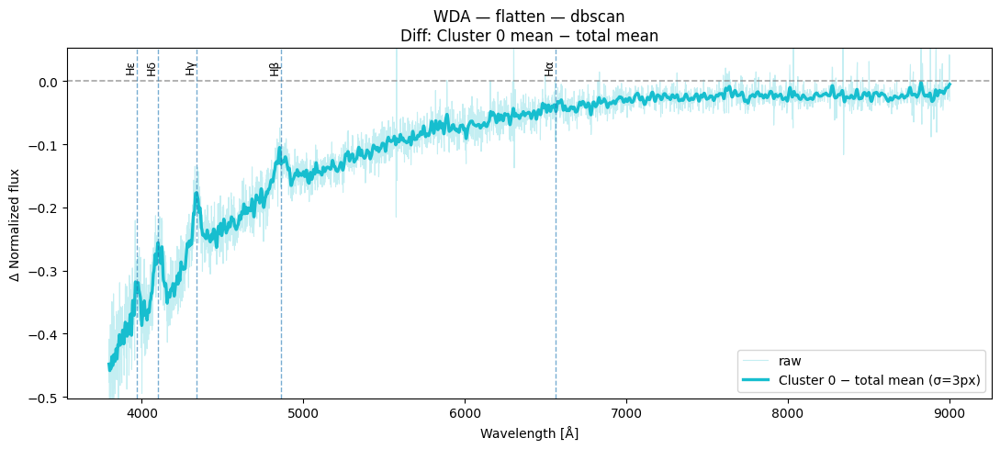

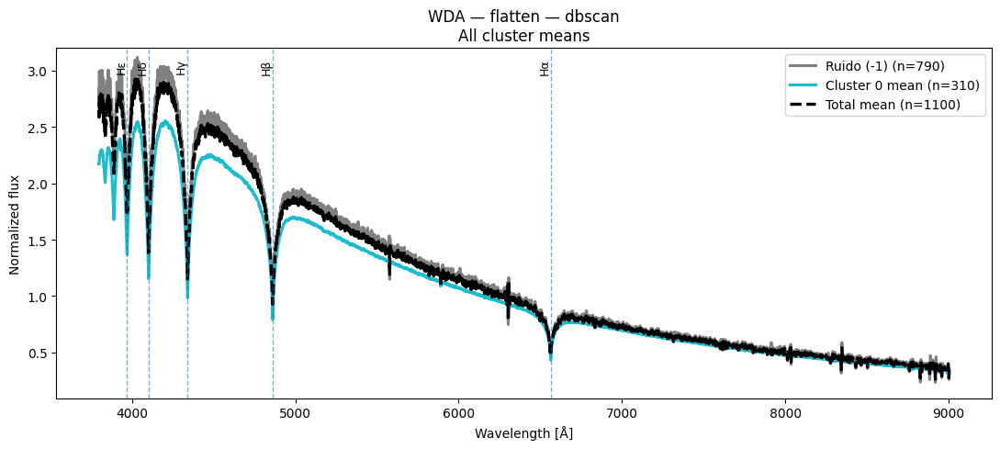

{'total_mean': array([2.6493979 , 2.5868607 , 2.5898647 , ..., 0.34275877, 0.27436805,
        0.34358275], dtype=float32),
 'group_means': {-1: array([2.8365166 , 2.7472477 , 2.7545357 , ..., 0.34455824, 0.25810513,
         0.3559137 ], dtype=float32),
  0: array([2.1725419 , 2.1781251 , 2.1702151 , ..., 0.3381723 , 0.31581163,
         0.31215957], dtype=float32)},
 'unique_clusters': array([-1,  0], dtype=int64)}

In [69]:
plot_spectra_dbscan(
    X_wda_spec,
    labels_dbs_flatten,
    W_wda[0],
    class_name="WDA",
    layer_name="flatten"
)

### Resultados $\textbf{capa dense}$ con Spectral Clustering + tSNE y PCA

#### Spectral Clustering k = 3

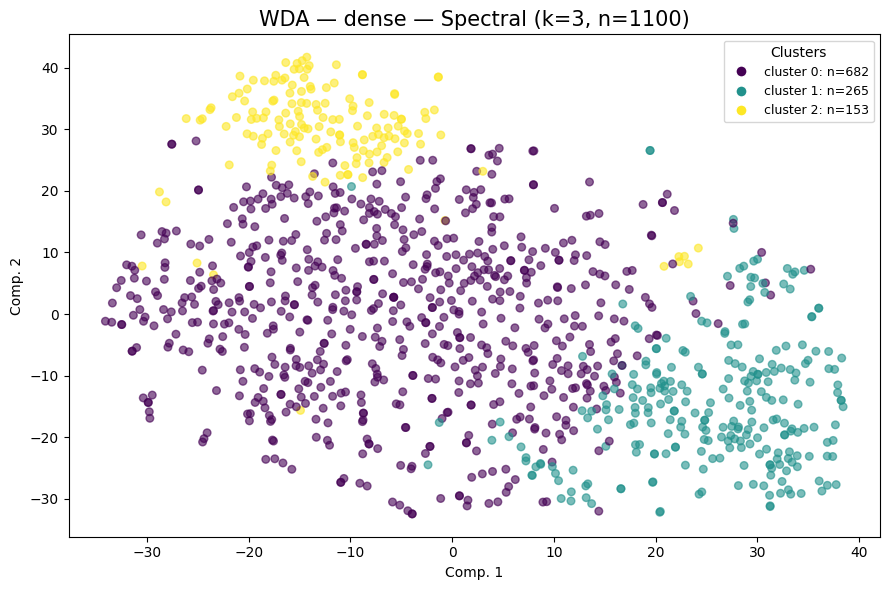


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense | spectral | k=3
  │  clusters=3  noise=0  sil=-0.0692  DB=4.2574  CH=22.01
  └────────────────────────────────────────────────────────────────┘



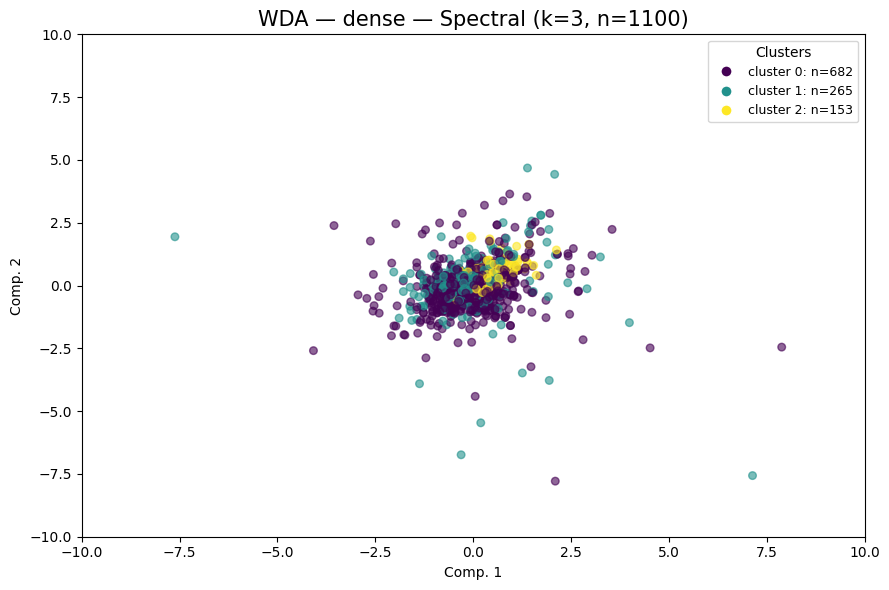


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense | spectral | k=3
  │  clusters=3  noise=0  sil=-0.0692  DB=4.2574  CH=22.01
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([0, 1, 0, ..., 0, 0, 0]),
 'metrics': {'n_clusters': 3,
  'n_noise': 0,
  'silhouette': -0.069202,
  'davies_bouldin': 4.257357,
  'calinski_harabasz': 22.0086}}

In [70]:
res_dense_k3 = cluster_plot_Spect(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            spectral_k=3,
            vis_method="tsne",
            container=cluster_labels_all
        )
labels_dense_k3 = res_dense_k3["spectral"]

cluster_plot_Spect(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            spectral_k=3, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10),
            container=cluster_labels_all
        )

#### Espectros obtenidos para dense de Spectral Clustering k = 3 y n = 1100

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


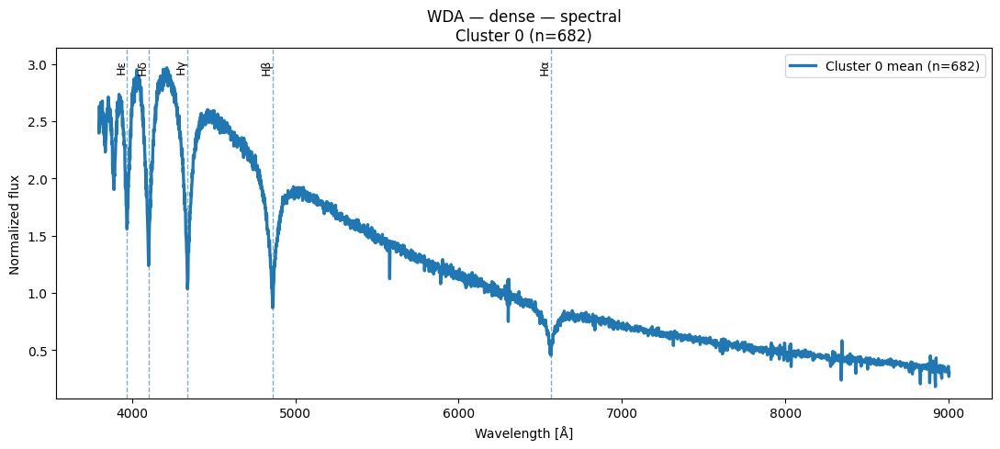

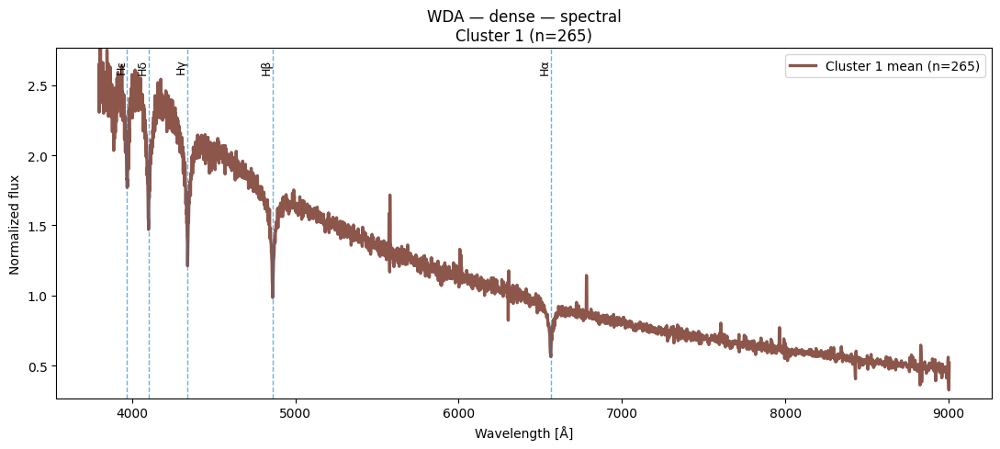

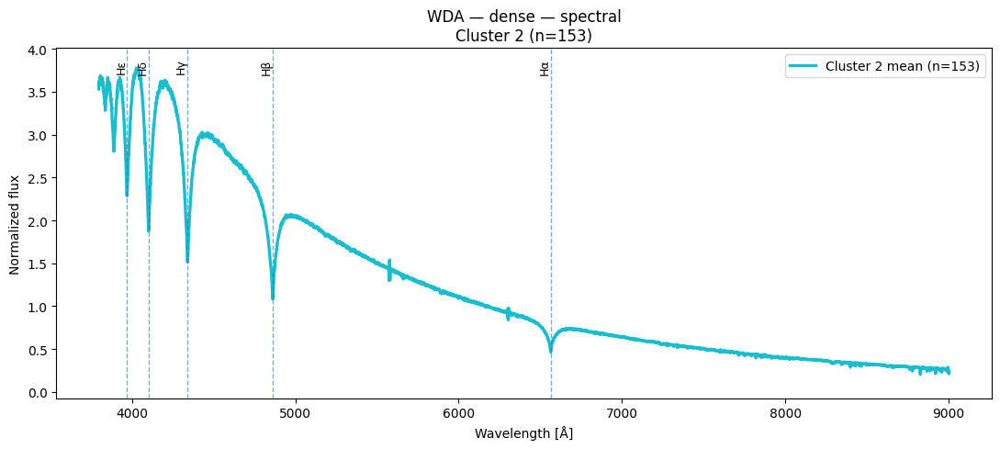

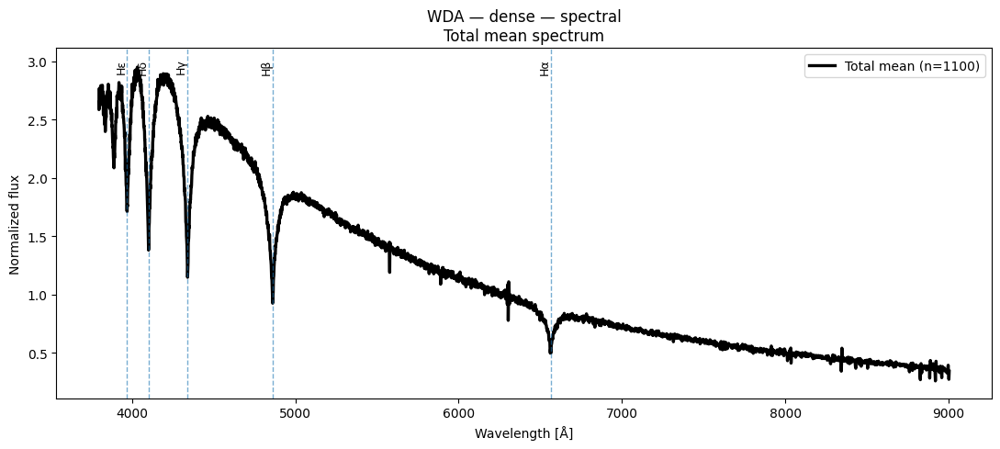

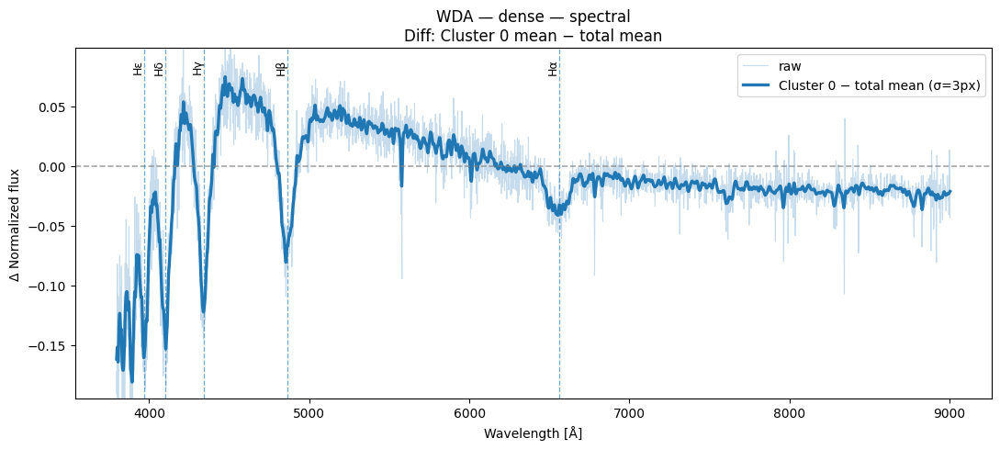

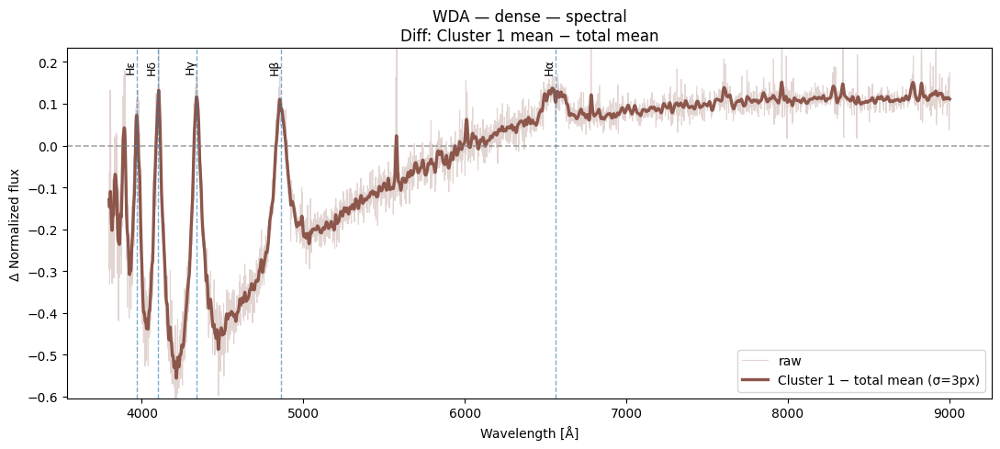

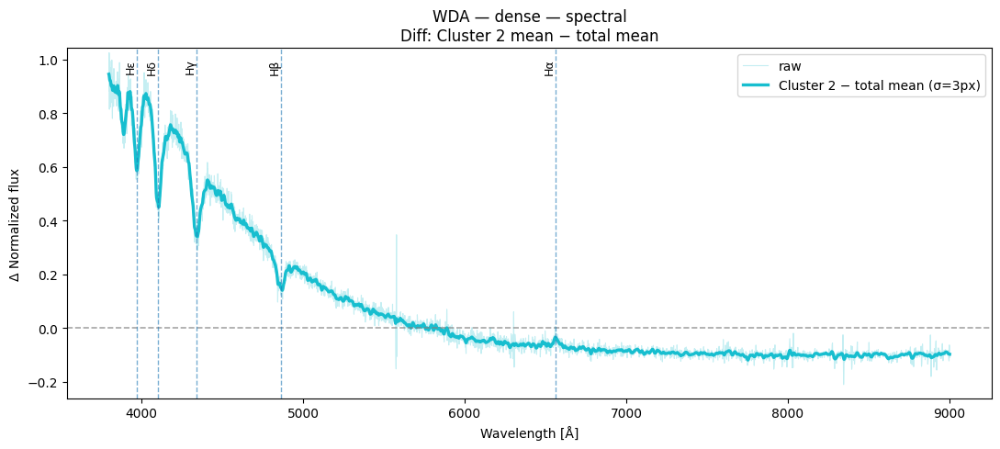

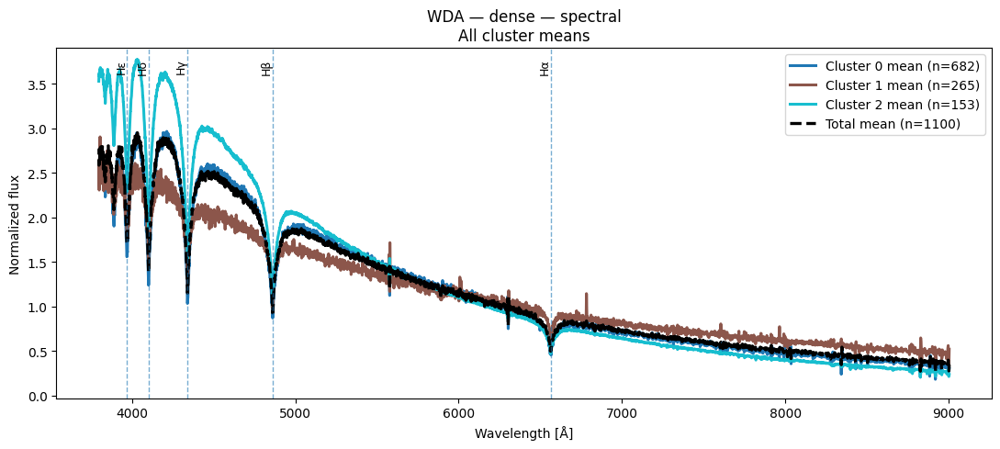

{'total_mean': array([2.6493979 , 2.5868607 , 2.5898647 , ..., 0.34275877, 0.27436805,
        0.34358275], dtype=float32),
 'group_means': {0: array([2.4774532 , 2.3956044 , 2.4117315 , ..., 0.35623387, 0.26840338,
         0.3001185 ], dtype=float32),
  1: array([2.5829918, 2.5118012, 2.4566152, ..., 0.3786638, 0.3261105,
         0.5187181], dtype=float32),
  2: array([3.530849  , 3.5693934 , 3.6146684 , ..., 0.2205062 , 0.21133548,
         0.23398872], dtype=float32)},
 'unique_clusters': array([0, 1, 2])}

In [71]:
plot_spectra_spectral(
    X_wda_spec,
    labels_dense_k3,
    W_wda[0],
    class_name="WDA",
    layer_name="dense"
)

#### Spectral Clustering k = 2

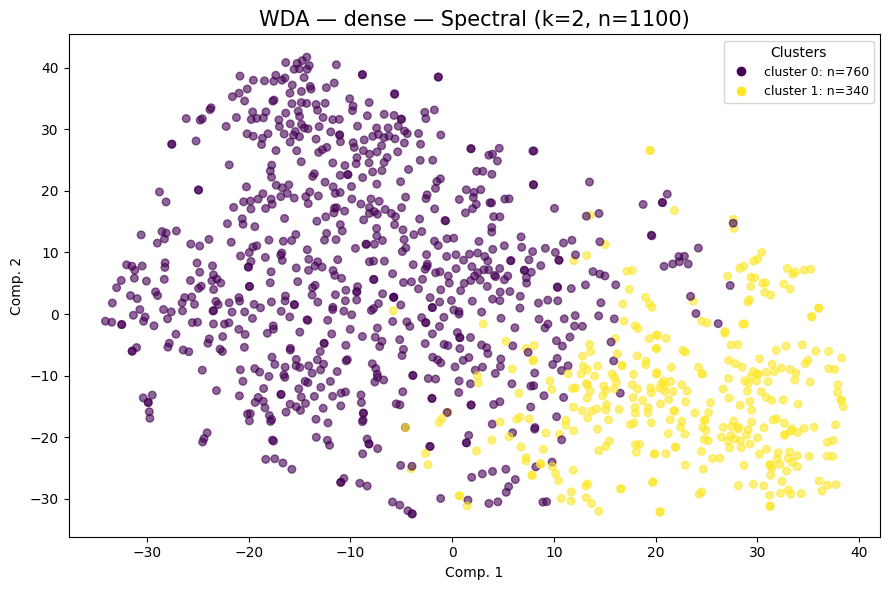


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense | spectral | k=2
  │  clusters=2  noise=0  sil=0.0973  DB=5.0157  CH=23.59
  └────────────────────────────────────────────────────────────────┘



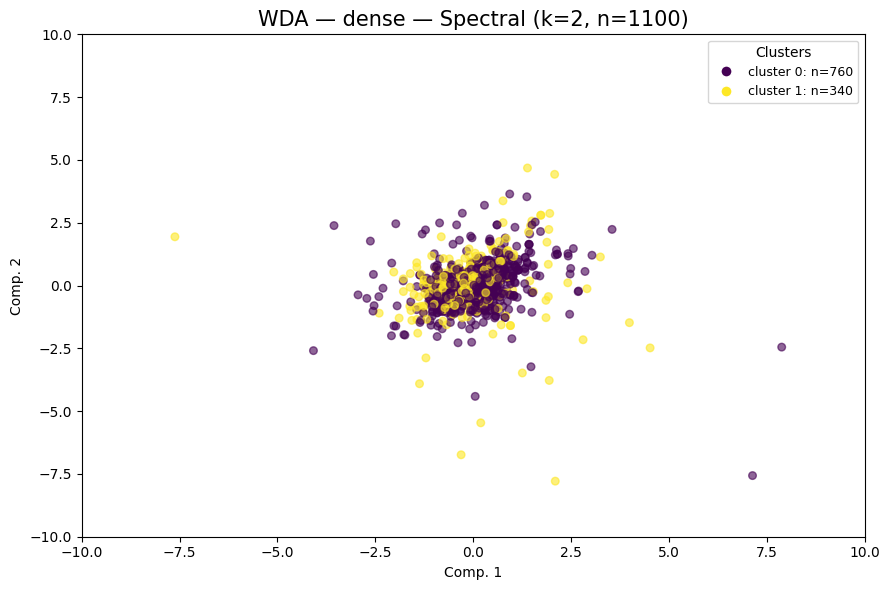


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense | spectral | k=2
  │  clusters=2  noise=0  sil=0.0973  DB=5.0157  CH=23.59
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([0, 1, 0, ..., 0, 0, 0]),
 'metrics': {'n_clusters': 2,
  'n_noise': 0,
  'silhouette': 0.097317,
  'davies_bouldin': 5.01569,
  'calinski_harabasz': 23.5887}}

In [72]:
res_dense_k2 = cluster_plot_Spect(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            spectral_k=2,
            vis_method="tsne",
            container=cluster_labels_all
        )

labels_dense_k2 = res_dense_k2["spectral"]

cluster_plot_Spect(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            spectral_k=2, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10),
            container=cluster_labels_all
        )

#### Espectros obtenidos para dense con Spectral Clustering k = 2 y n = 1100

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


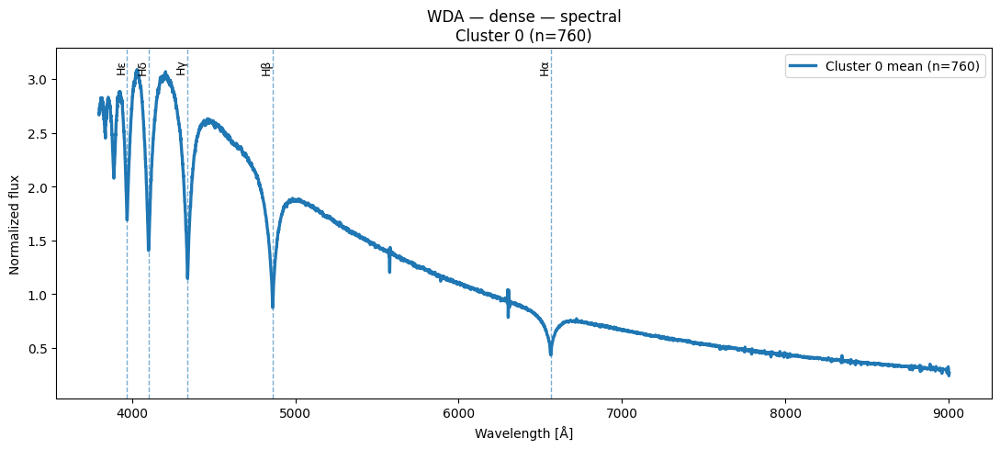

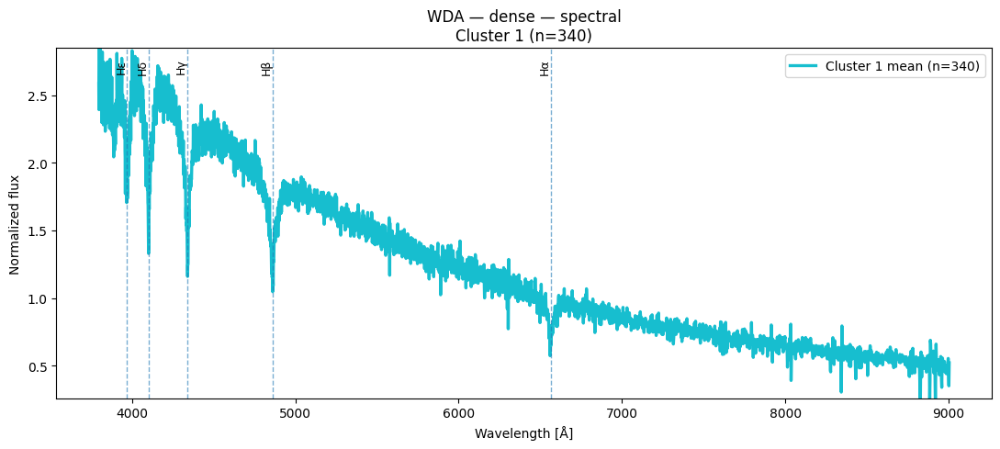

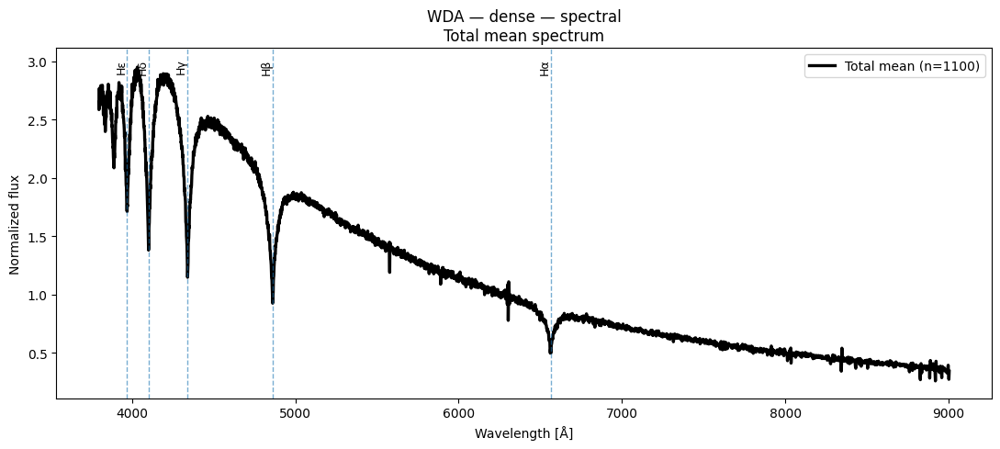

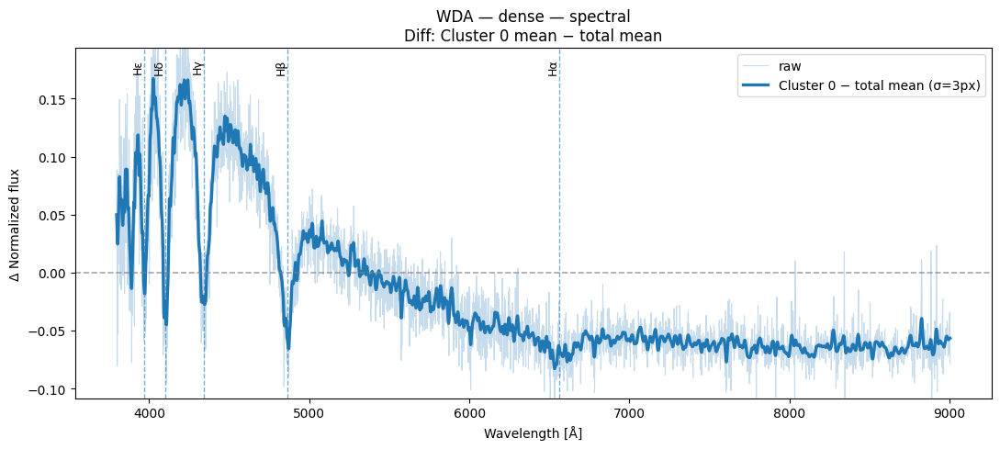

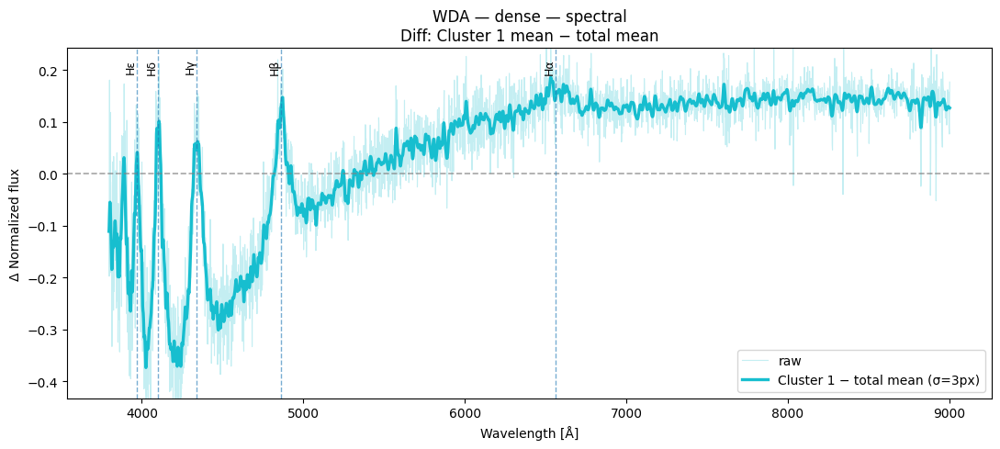

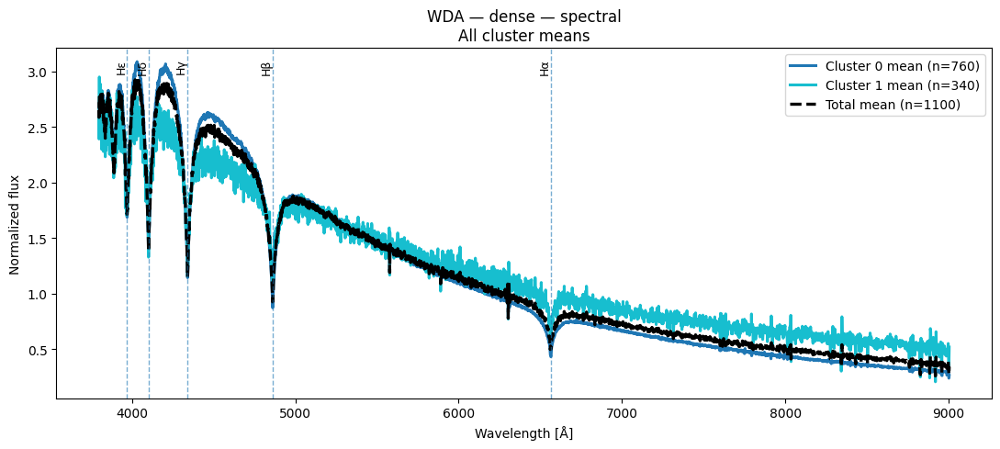

{'total_mean': array([2.6493979 , 2.5868607 , 2.5898647 , ..., 0.34275877, 0.27436805,
        0.34358275], dtype=float32),
 'group_means': {0: array([2.6778753 , 2.6653168 , 2.6782897 , ..., 0.30306715, 0.24021257,
         0.2645366 ], dtype=float32),
  1: array([2.5857353 , 2.411487  , 2.3922002 , ..., 0.43148127, 0.35071507,
         0.52027524], dtype=float32)},
 'unique_clusters': array([0, 1])}

In [73]:
plot_spectra_spectral(
    X_wda_spec,
    labels_dense_k2,
    W_wda[0],
    class_name="WDA",
    layer_name="dense"
)

#### Spectral Clustering k = 4

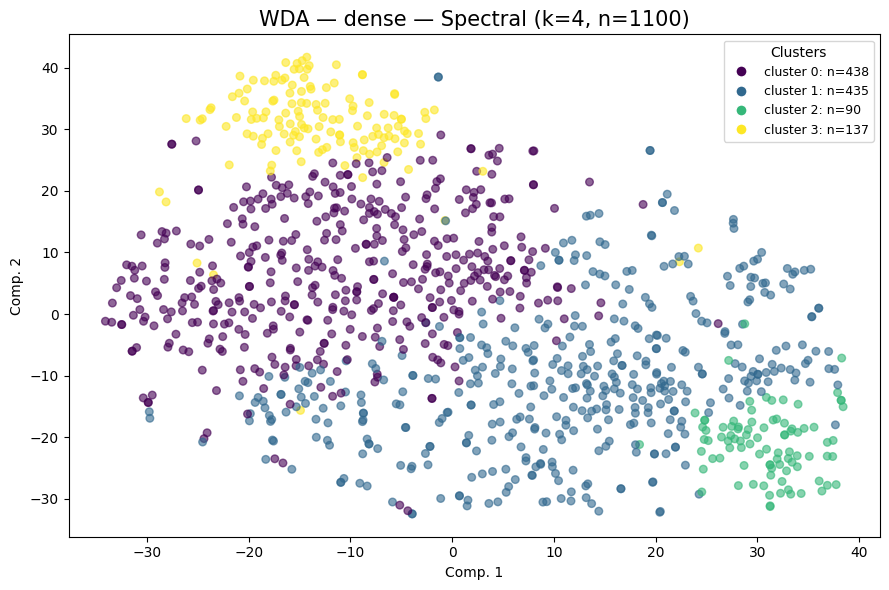


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense | spectral | k=4
  │  clusters=4  noise=0  sil=-0.0642  DB=4.0526  CH=21.47
  └────────────────────────────────────────────────────────────────┘



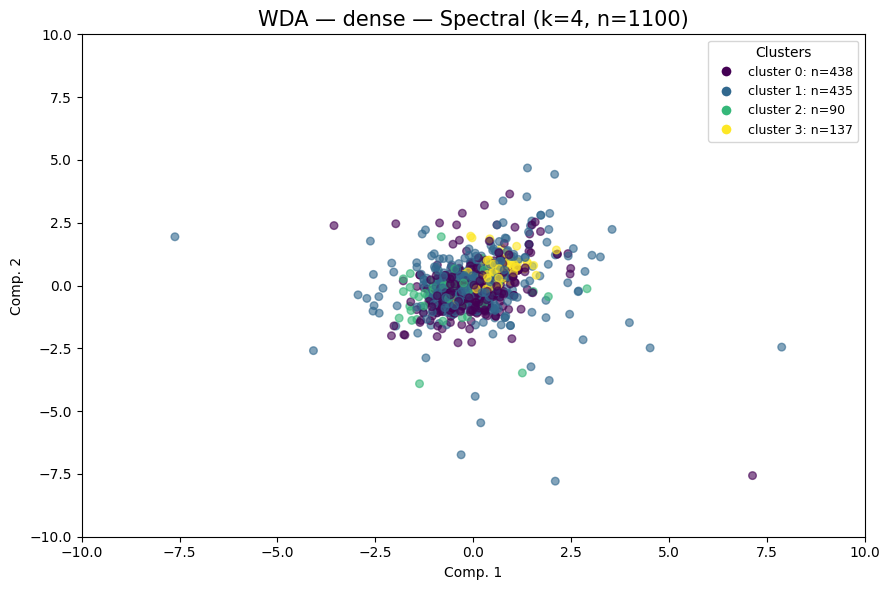


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense | spectral | k=4
  │  clusters=4  noise=0  sil=-0.0642  DB=4.0526  CH=21.47
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([0, 1, 1, ..., 1, 0, 1]),
 'metrics': {'n_clusters': 4,
  'n_noise': 0,
  'silhouette': -0.064243,
  'davies_bouldin': 4.052599,
  'calinski_harabasz': 21.474}}

In [74]:
res_dense_k4 = cluster_plot_Spect(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            spectral_k=4,
            vis_method="tsne",
            container=cluster_labels_all
        )

labels_dense_k4 = res_dense_k4["spectral"]

cluster_plot_Spect(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            spectral_k=4, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10),
            container=cluster_labels_all
        )

#### Espectros obtenidos para dense con Spectral Clustering k = 4 y n = 1100

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


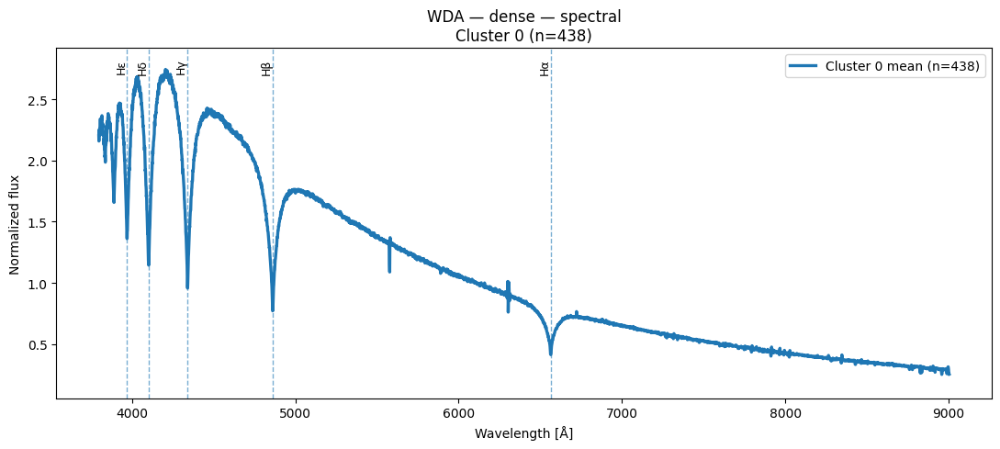

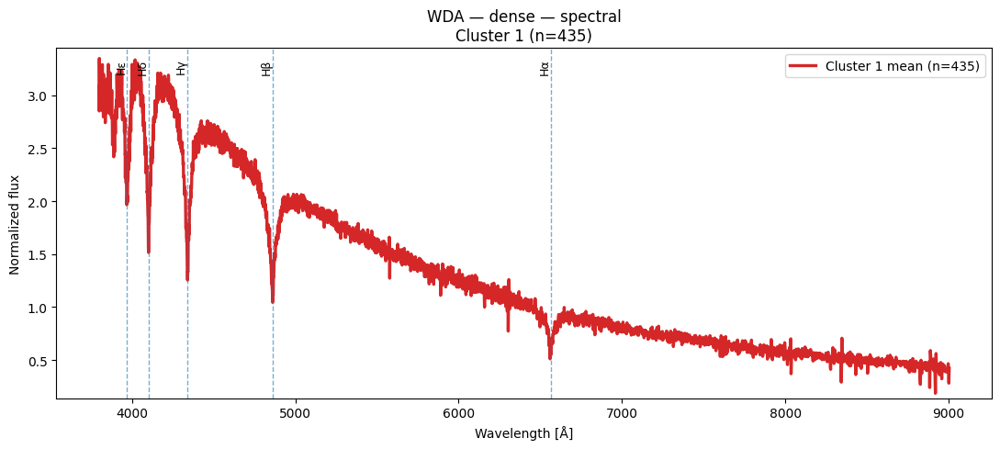

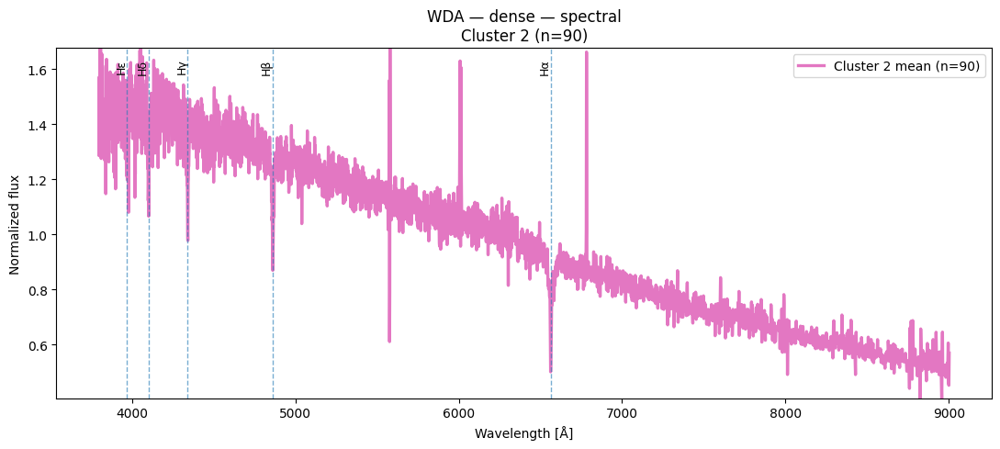

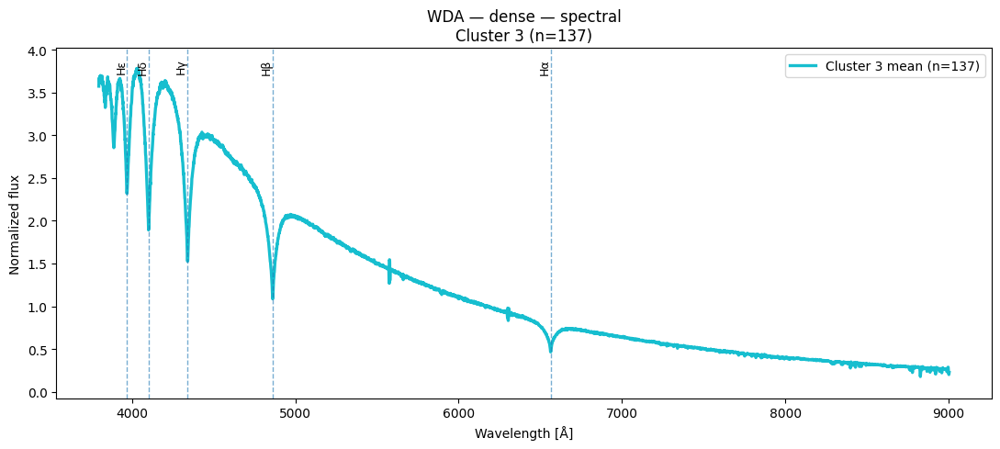

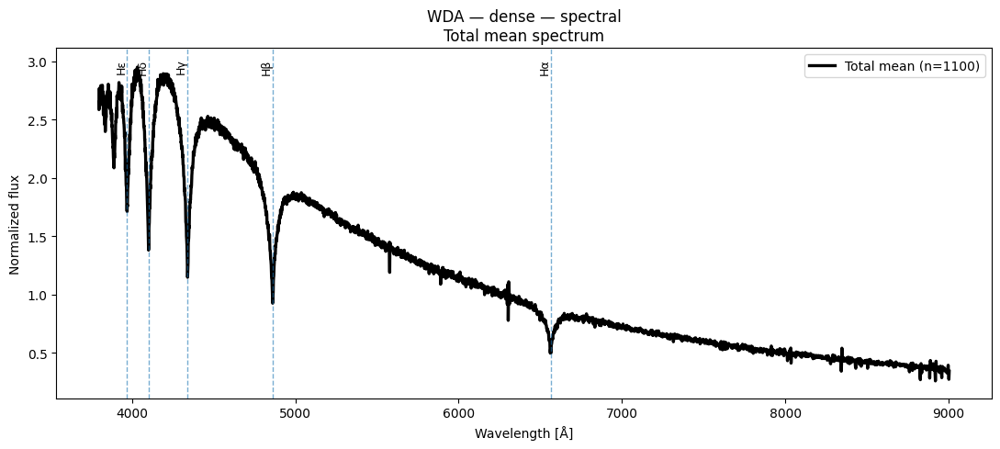

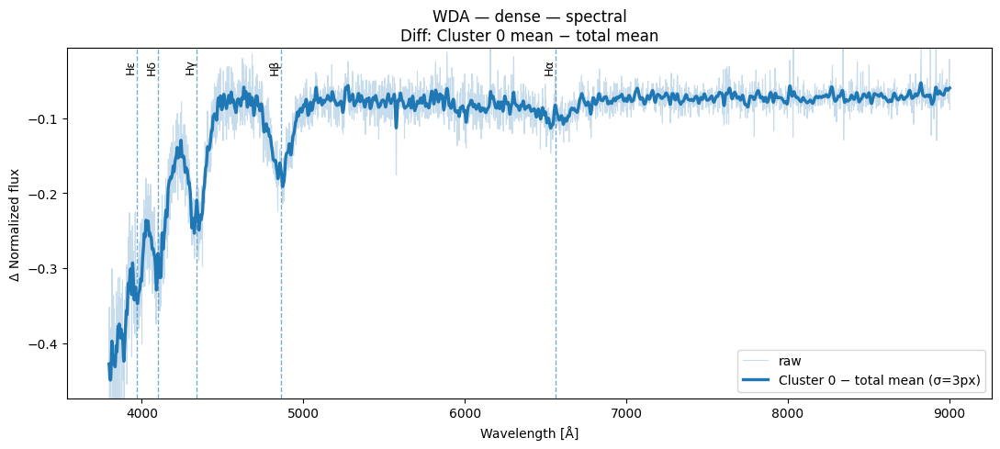

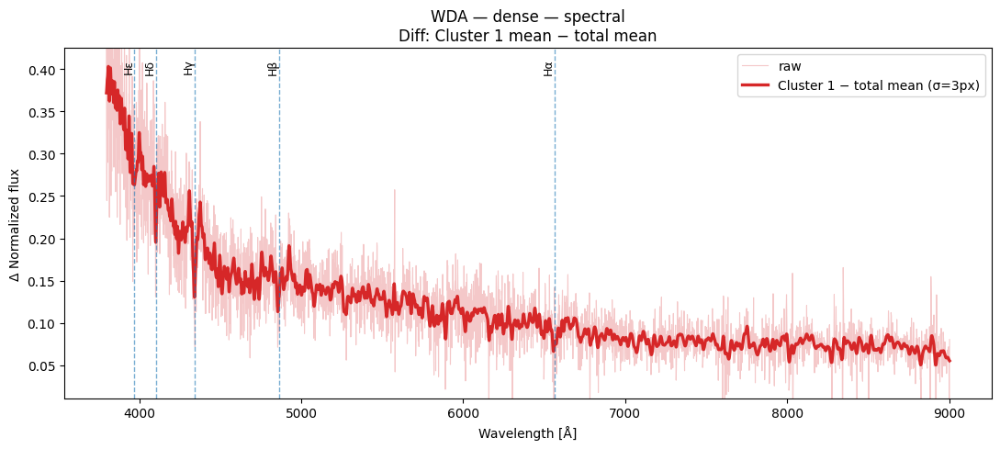

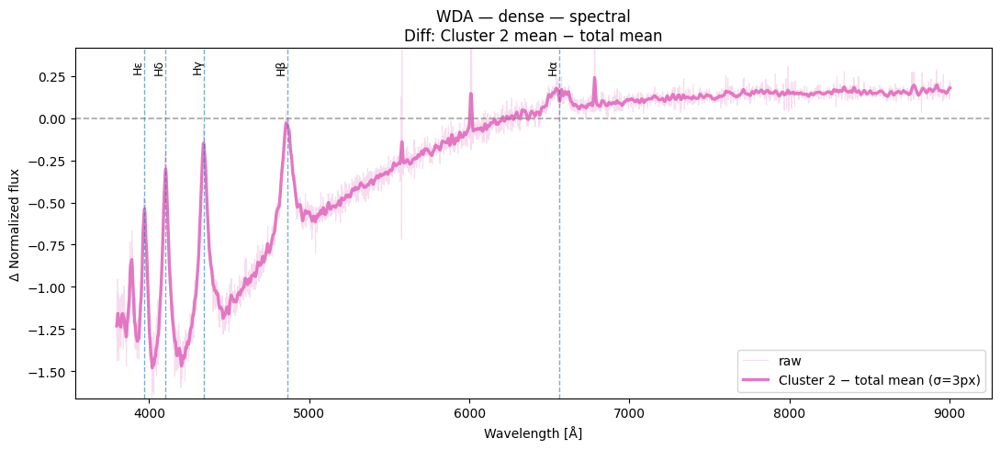

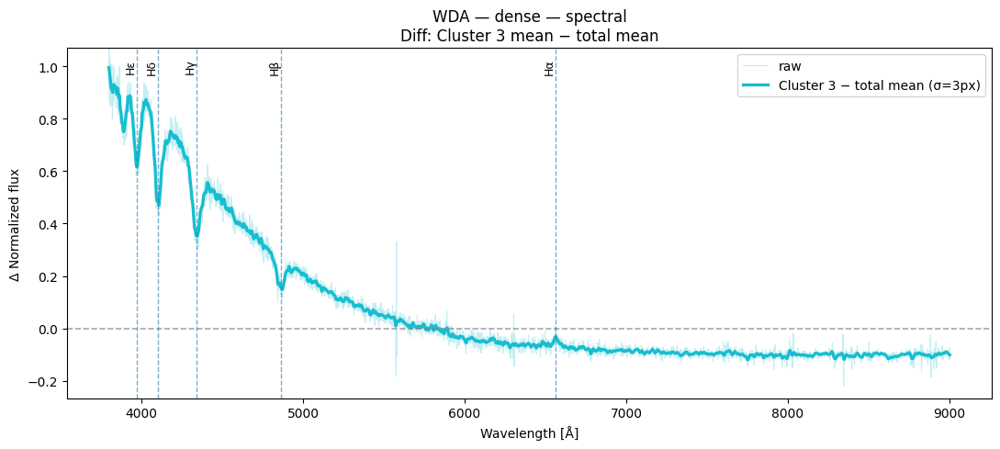

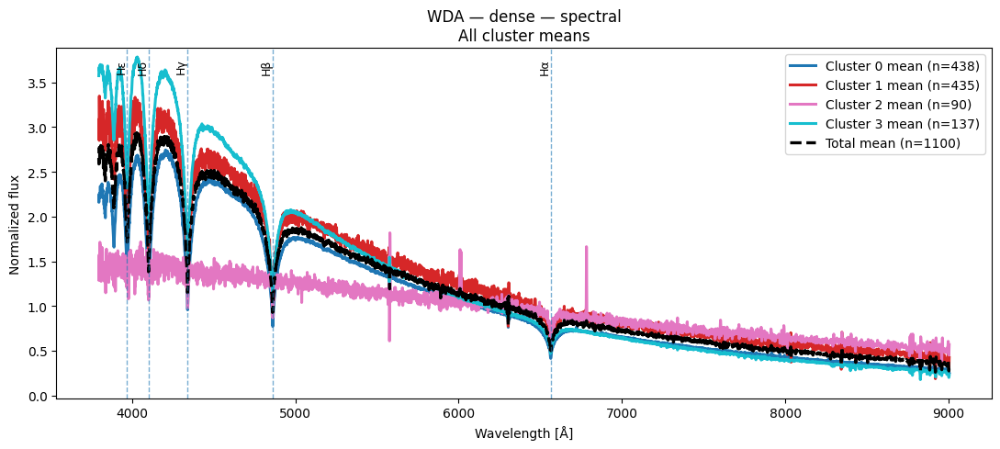

{'total_mean': array([2.6493979 , 2.5868607 , 2.5898647 , ..., 0.34275877, 0.27436805,
        0.34358275], dtype=float32),
 'group_means': {0: array([2.2014093 , 2.158382  , 2.2005947 , ..., 0.2949068 , 0.25243846,
         0.25418982], dtype=float32),
  1: array([3.0813384 , 2.9562492 , 2.8712096 , ..., 0.40471596, 0.28300285,
         0.42386907], dtype=float32),
  2: array([1.3363804 , 1.2859322 , 1.4931991 , ..., 0.45842224, 0.45111826,
         0.56841254], dtype=float32),
  3: array([3.5727167 , 3.638489  , 3.6614907 , ..., 0.2230357 , 0.20094702,
         0.22675993], dtype=float32)},
 'unique_clusters': array([0, 1, 2, 3])}

In [75]:
plot_spectra_spectral(
    X_wda_spec,
    labels_dense_k4,
    W_wda[0],
    class_name="WDA",
    layer_name="dense"
)

#### Spectral Clustering k = 5

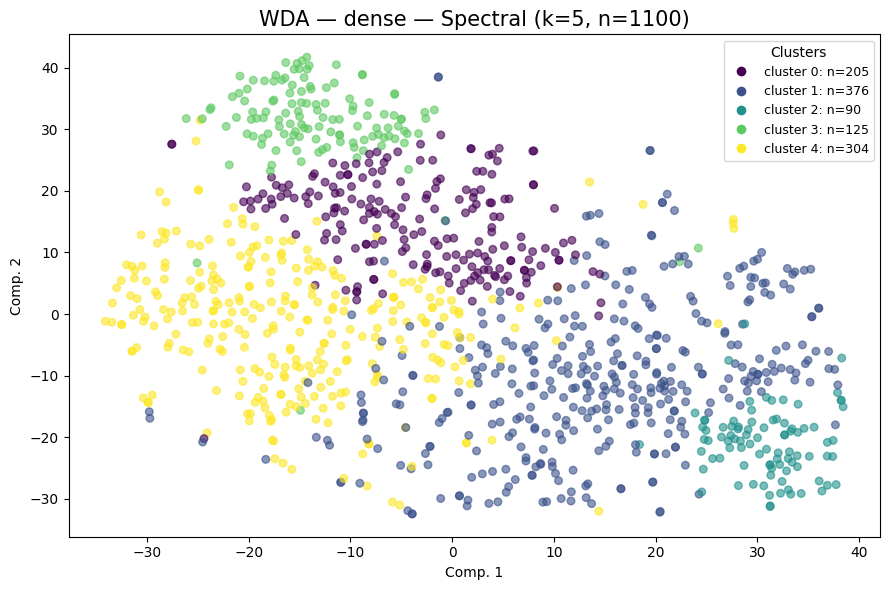


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense | spectral | k=5
  │  clusters=5  noise=0  sil=-0.0577  DB=3.8201  CH=20.76
  └────────────────────────────────────────────────────────────────┘



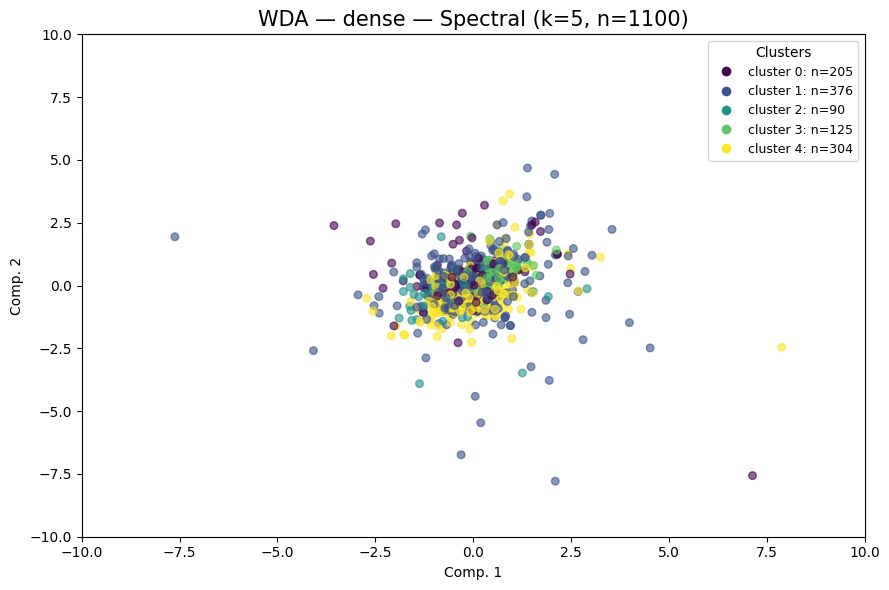


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense | spectral | k=5
  │  clusters=5  noise=0  sil=-0.0577  DB=3.8201  CH=20.76
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([0, 1, 1, ..., 1, 4, 4]),
 'metrics': {'n_clusters': 5,
  'n_noise': 0,
  'silhouette': -0.057705,
  'davies_bouldin': 3.820103,
  'calinski_harabasz': 20.7556}}

In [76]:
res_dense_k5= cluster_plot_Spect(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            spectral_k=5,
            vis_method="tsne",
            container=cluster_labels_all
        )

labels_dense_k5 = res_dense_k5["spectral"]
cluster_plot_Spect(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            spectral_k=5, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10),
            container=cluster_labels_all
        )

#### Espectros obtenidos para dense con Spectral Clustering k = 5 y n = 1100

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


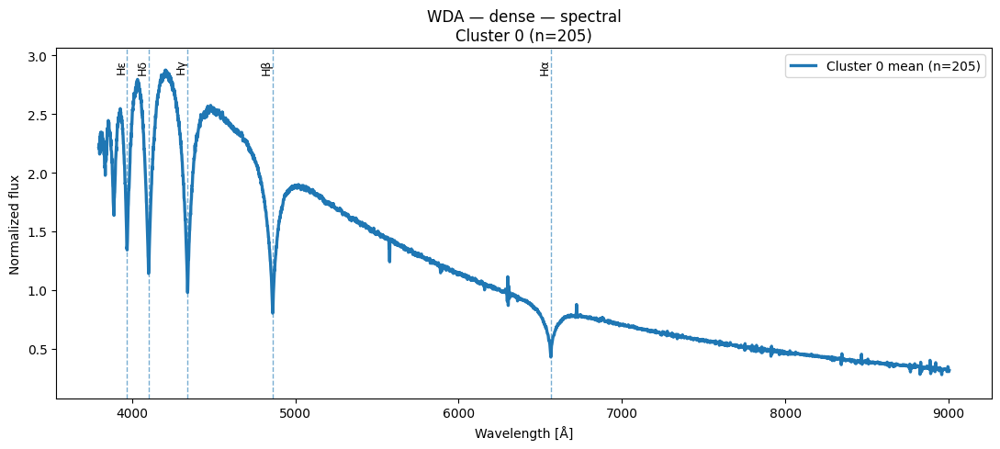

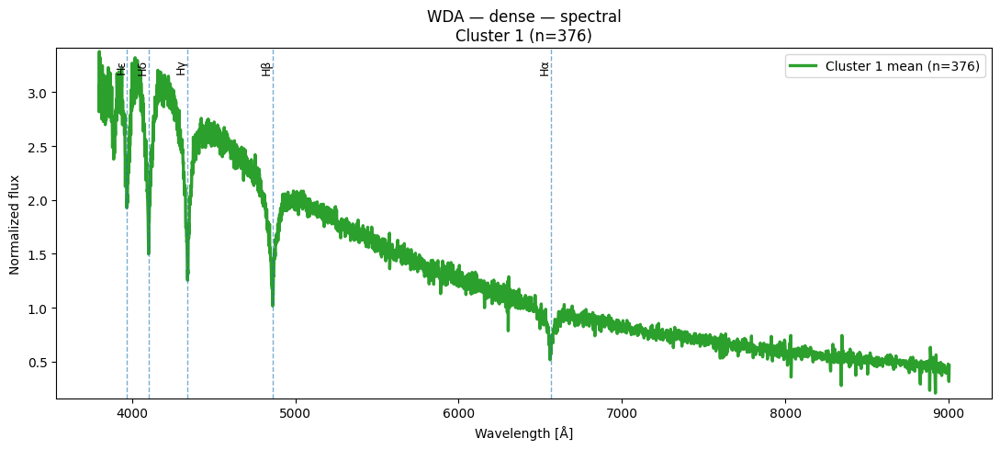

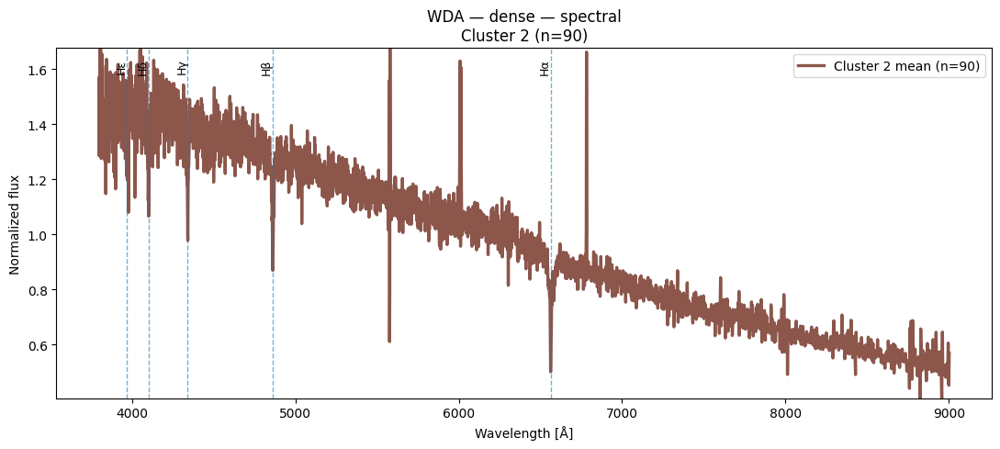

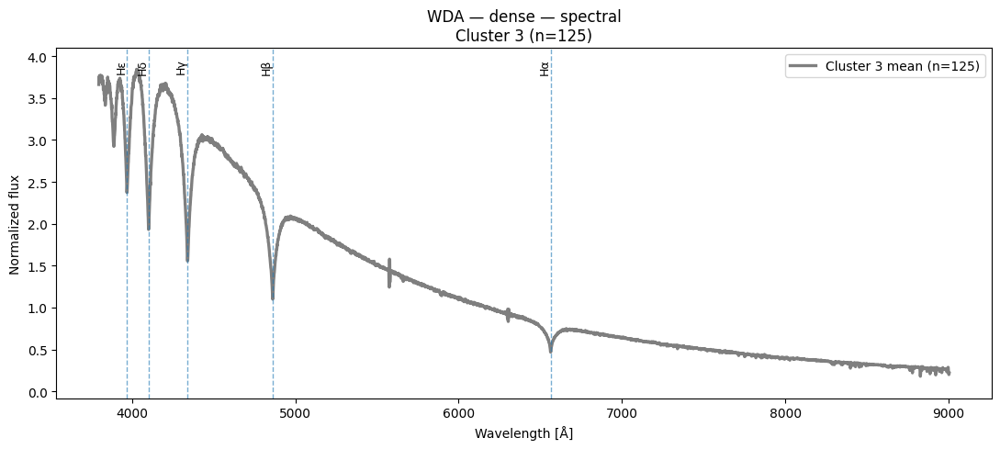

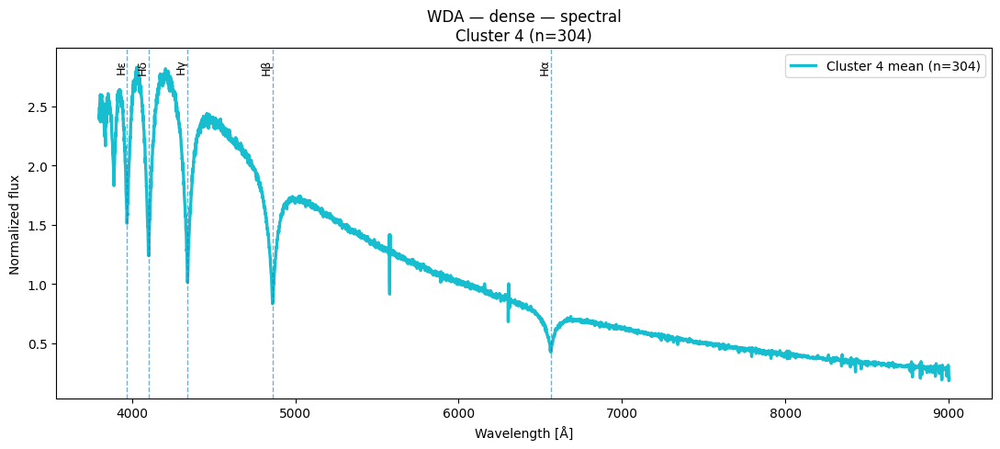

...

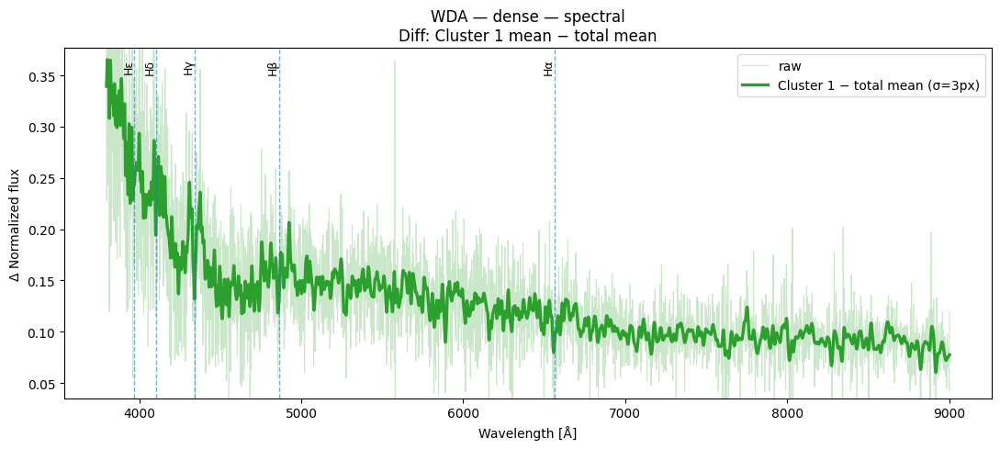

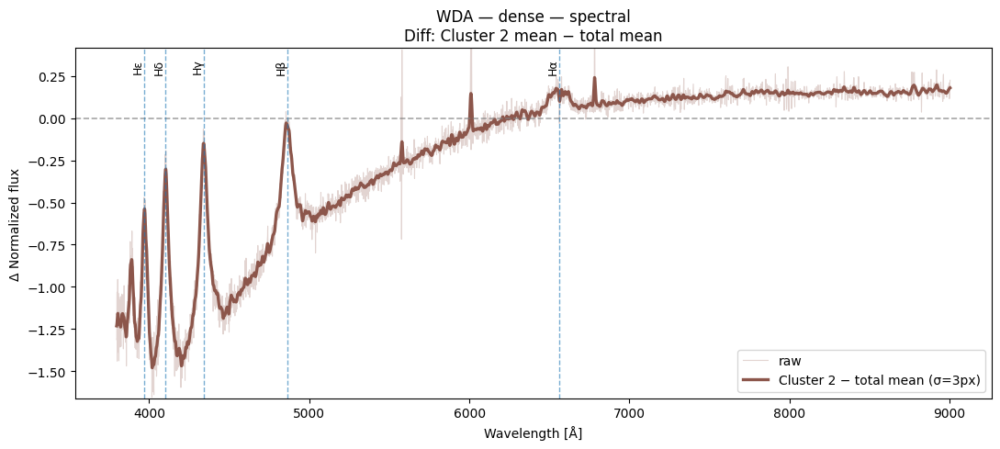

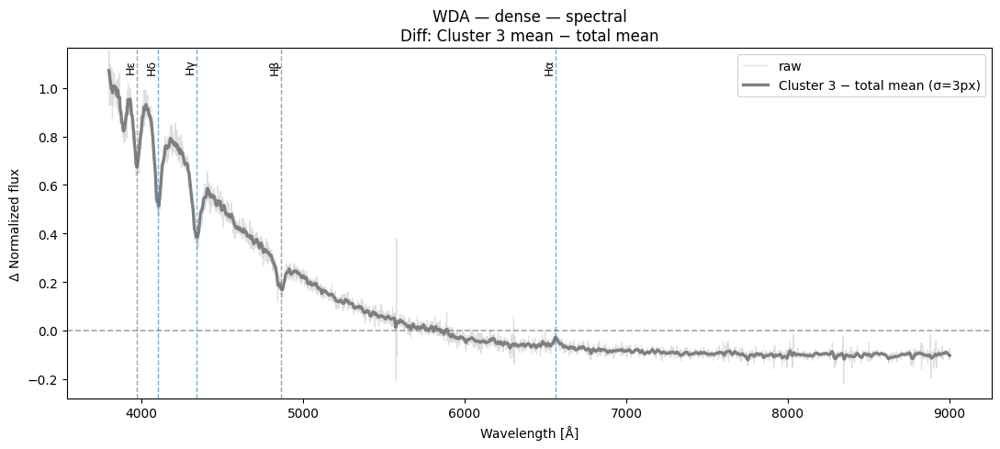

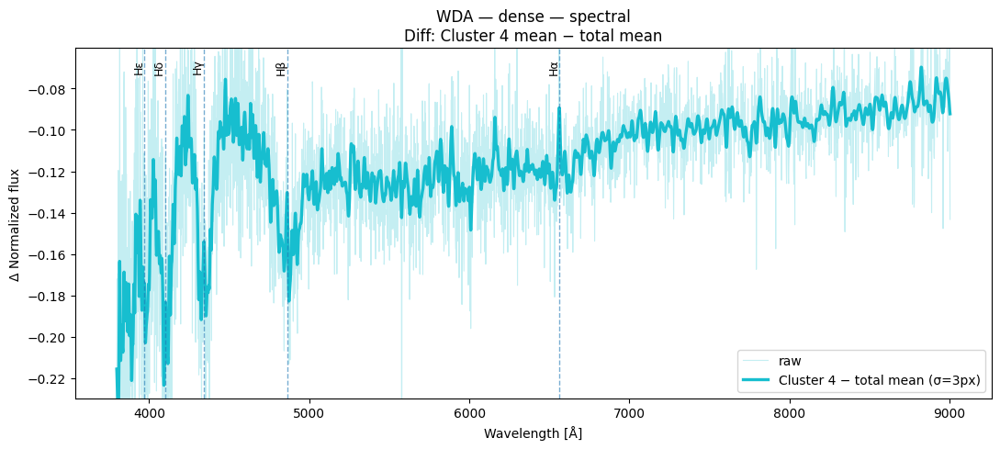

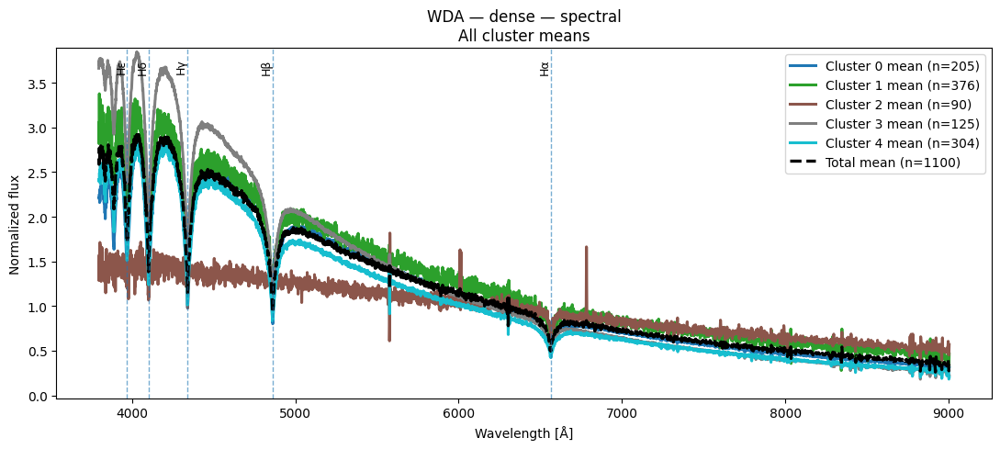

{'total_mean': array([2.6493979 , 2.5868607 , 2.5898647 , ..., 0.34275877, 0.27436805,
        0.34358275], dtype=float32),
 'group_means': {0: array([2.2097285 , 2.2039099 , 2.2040193 , ..., 0.31043428, 0.3021945 ,
         0.31198978], dtype=float32),
  1: array([3.0544236 , 2.8907533 , 2.8173532 , ..., 0.4029806 , 0.316814  ,
         0.46407264], dtype=float32),
  2: array([1.3363804 , 1.2859322 , 1.4931991 , ..., 0.45842224, 0.45111826,
         0.56841254], dtype=float32),
  3: array([3.6623926 , 3.7046065 , 3.7464252 , ..., 0.22301494, 0.20047829,
         0.21942586], dtype=float32),
  4: array([2.4171212 , 2.394776  , 2.417792  , ..., 0.30506536, 0.181159  ,
         0.20035149], dtype=float32)},
 'unique_clusters': array([0, 1, 2, 3, 4])}

In [77]:
plot_spectra_spectral(
    X_wda_spec,
    labels_dense_k5,
    W_wda[0],
    class_name="WDA",
    layer_name="dense"
)

#### Análisis de migración

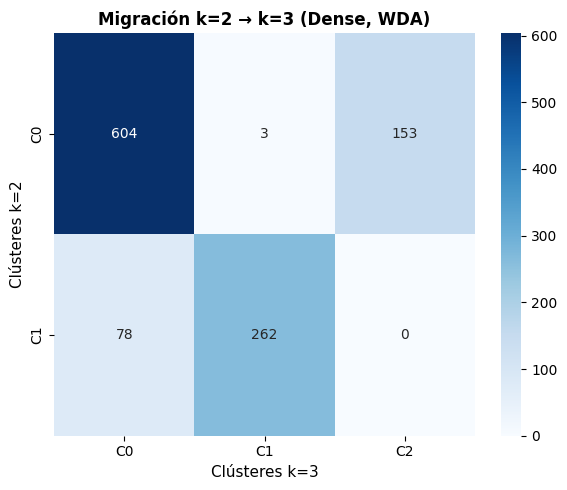

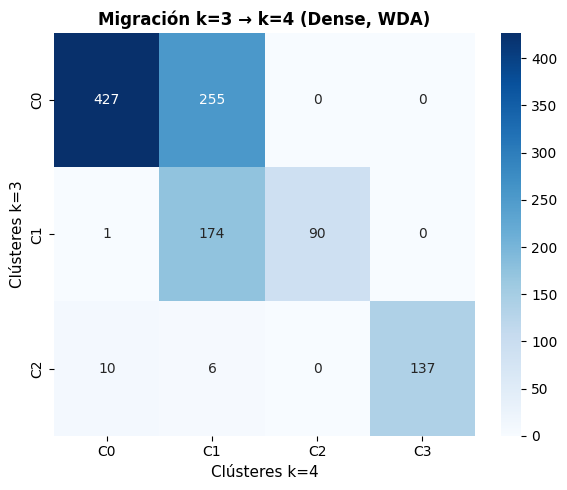

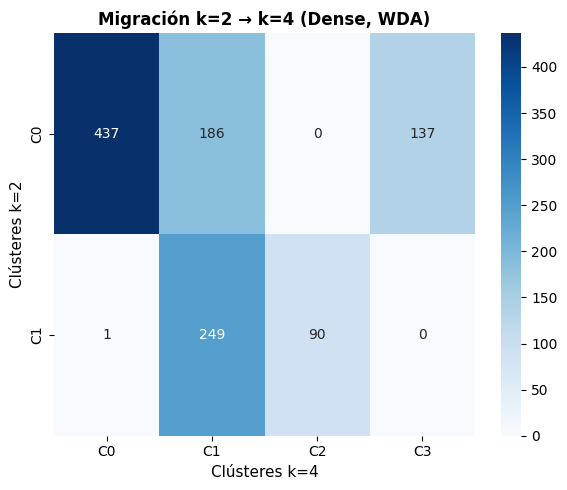

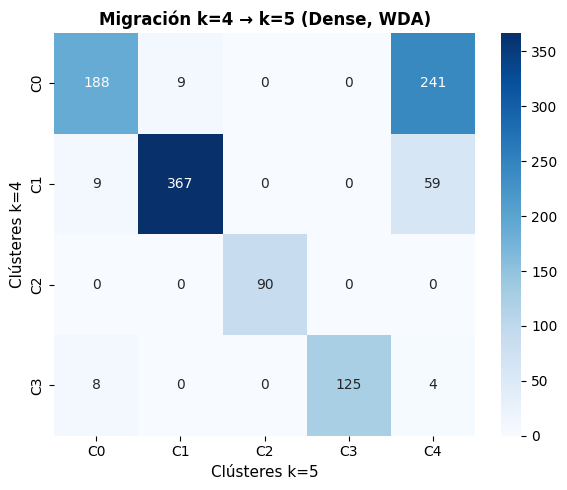

In [78]:
plot_migration_matrix(labels_dense_k2, labels_dense_k3, ka=2, kb=3, title='Migración k=2 → k=3 (Dense, WDA)')
plot_migration_matrix(labels_dense_k3, labels_dense_k4, ka=3, kb=4, title='Migración k=3 → k=4 (Dense, WDA)')
plot_migration_matrix(labels_dense_k2, labels_dense_k4, ka=2, kb=4, title='Migración k=2 → k=4 (Dense, WDA)')
plot_migration_matrix(labels_dense_k4, labels_dense_k5, ka=4, kb=5, title='Migración k=4 → k=5 (Dense, WDA)')

#### DBSCAN

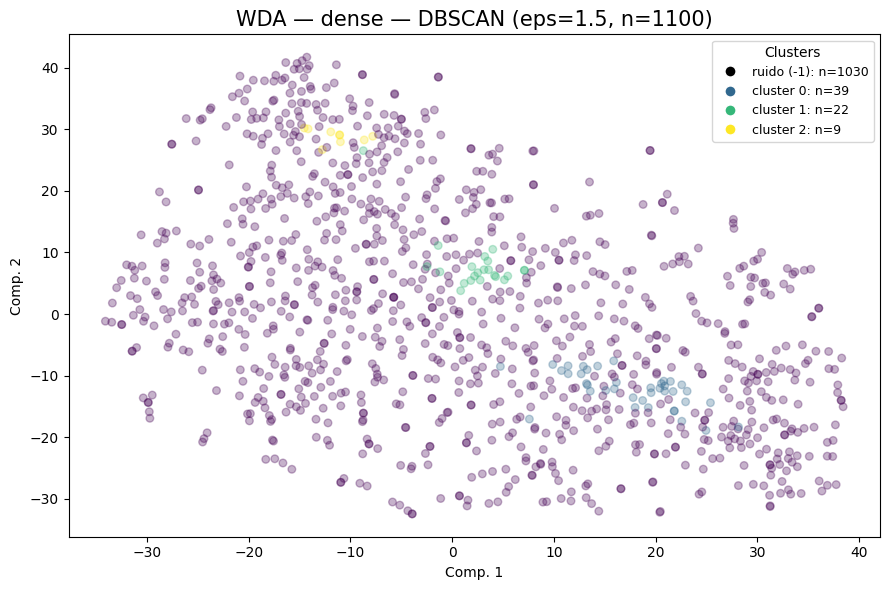


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense | dbscan | eps=1.5
  │  clusters=3  noise=1030  sil=0.2891  DB=1.2437  CH=25.64
  │  DBCV = -0.2465  (rango [-1,1], especifico DBSCAN)
  └────────────────────────────────────────────────────────────────┘



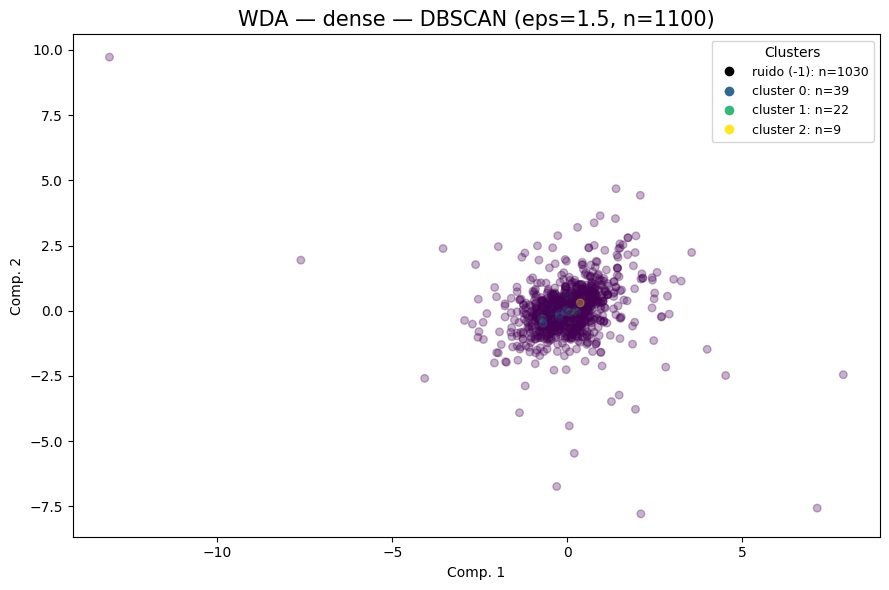


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense | dbscan | eps=1.5
  │  clusters=3  noise=1030  sil=0.2891  DB=1.2437  CH=25.64
  │  DBCV = -0.2465  (rango [-1,1], especifico DBSCAN)
  └────────────────────────────────────────────────────────────────┘



{'dbscan': array([-1,  0, -1, ..., -1, -1, -1], dtype=int64),
 'metrics': {'n_clusters': 3,
  'n_noise': 1030,
  'silhouette': 0.289126,
  'davies_bouldin': 1.243667,
  'calinski_harabasz': 25.6442},
 'dbcv': -0.24653}

In [79]:
res_dbs_dense = cluster_plot_DBSCAN(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            dbscan_eps=1.5, 
            dbscan_min_samples=10, 
            vis_method="tsne", 
            xlim=None, 
            ylim=None,
            container=cluster_labels_all
        )
labels_dbs_dense= res_dbs_dense["dbscan"]
cluster_plot_DBSCAN(
            repr_wda_32["dense"],
            "WDA",
            "dense",
            dbscan_eps=1.5, 
            dbscan_min_samples=10, 
            vis_method="pca", 
            xlim=None, 
            ylim=None,
            container=cluster_labels_all
        )

#### Espectros obtenidos para dense con DBSCAN y n = 1100

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


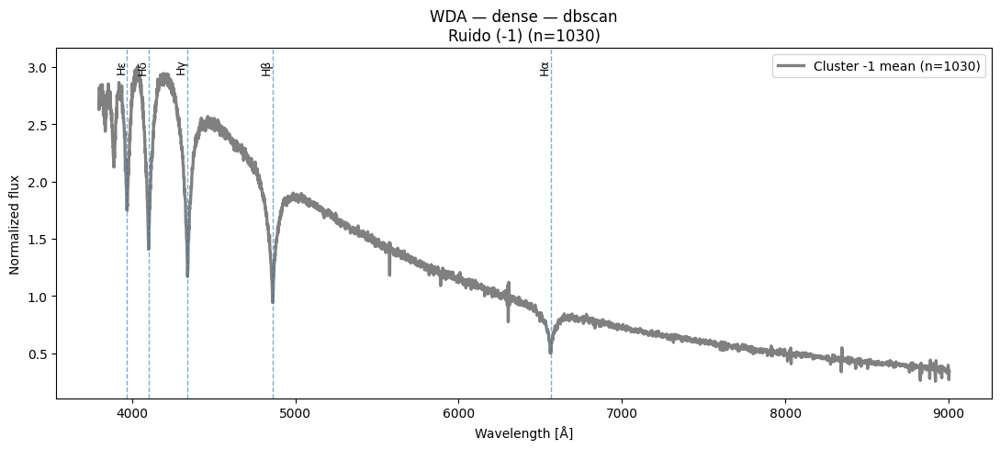

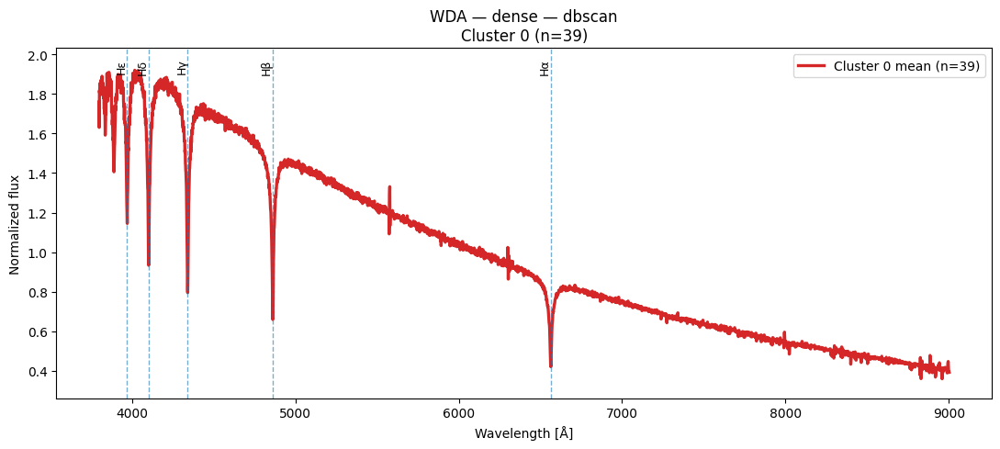

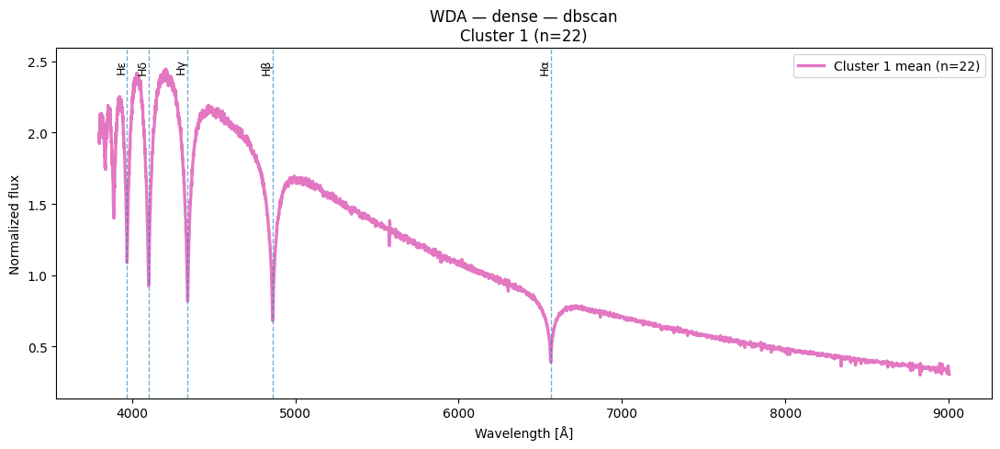

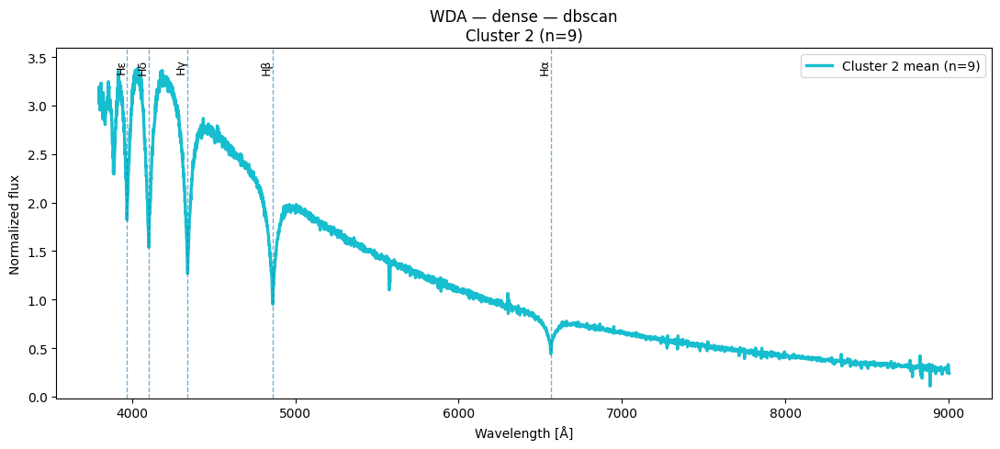

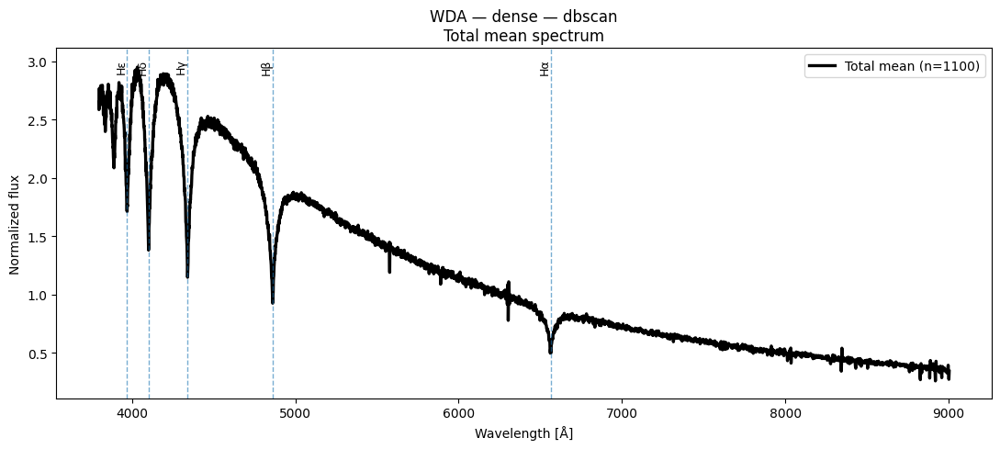

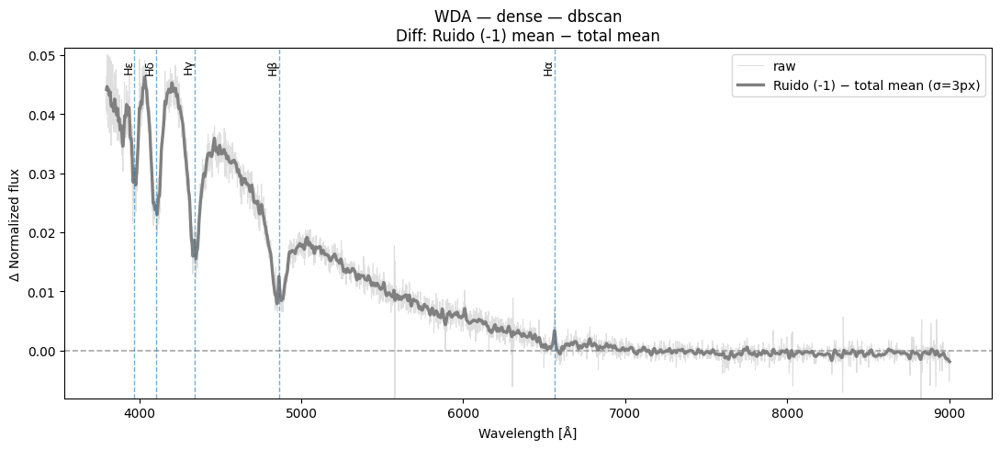

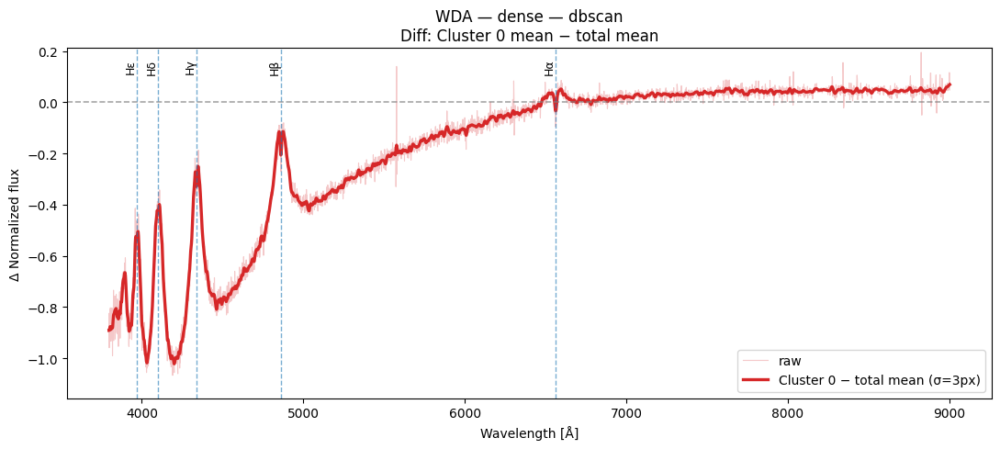

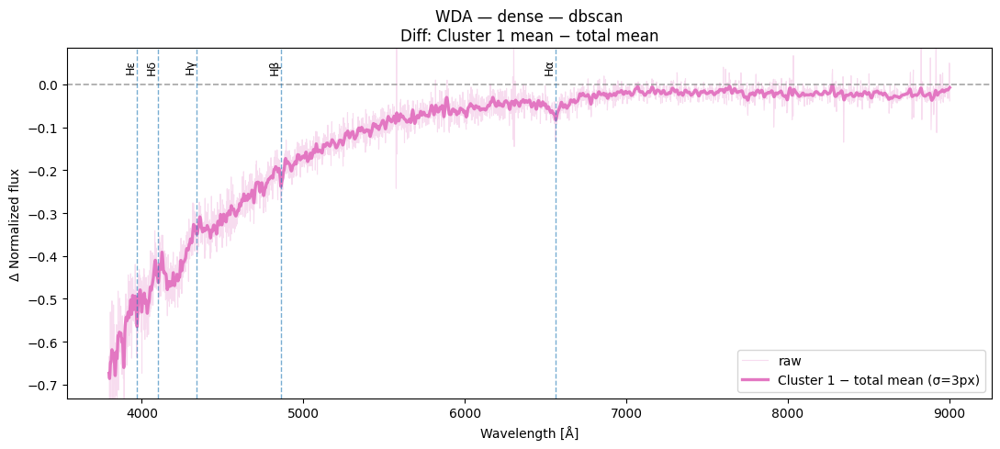

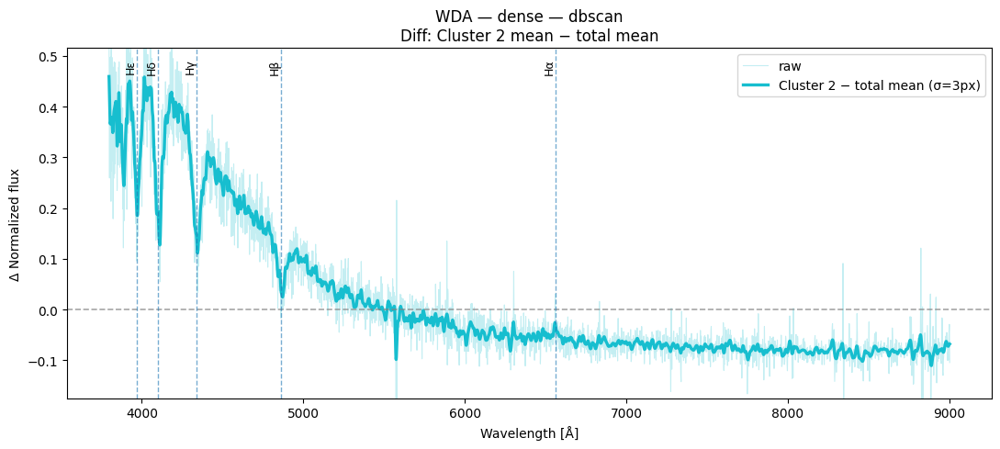

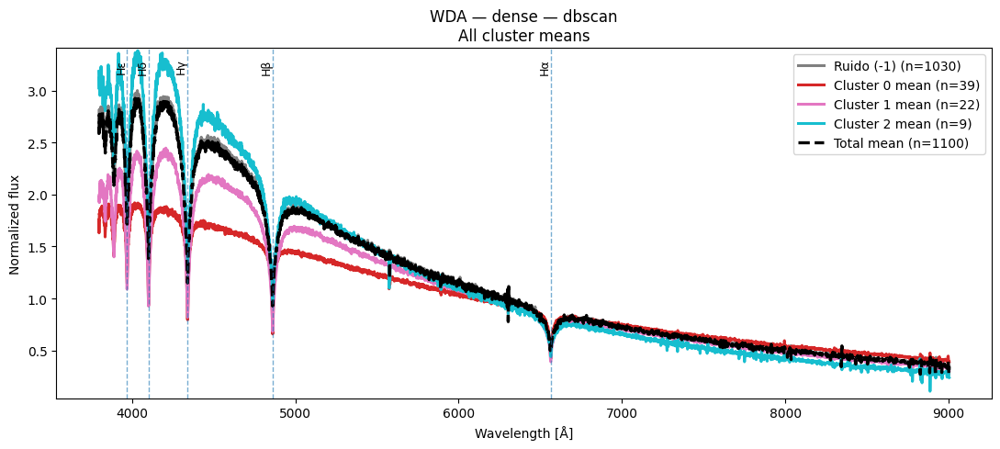

{'total_mean': array([2.6493979 , 2.5868607 , 2.5898647 , ..., 0.34275877, 0.27436805,
        0.34358275], dtype=float32),
 'group_means': {-1: array([2.6932576 , 2.6272886 , 2.636244  , ..., 0.34091115, 0.2691639 ,
         0.34351528], dtype=float32),
  0: array([1.746611  , 1.7625626 , 1.6311738 , ..., 0.4074069 , 0.39039117,
         0.3910139 ], dtype=float32),
  1: array([1.9773873 , 1.9530846 , 1.9307591 , ..., 0.3325621 , 0.3242443 ,
         0.30534068], dtype=float32),
  2: array([3.1846838 , 3.0811136 , 3.047346  , ..., 0.29898563, 0.24524586,
         0.23926459], dtype=float32)},
 'unique_clusters': array([-1,  0,  1,  2], dtype=int64)}

In [80]:
plot_spectra_dbscan(
    X_wda_spec,
    labels_dbs_dense,
    W_wda[0],
    class_name="WDA",
    layer_name="dense"
)

### Resultados $\textbf{capa dense\_1}$ con Spectral Clustering + tSNE y PCA

#### Spectral Clustering k = 3

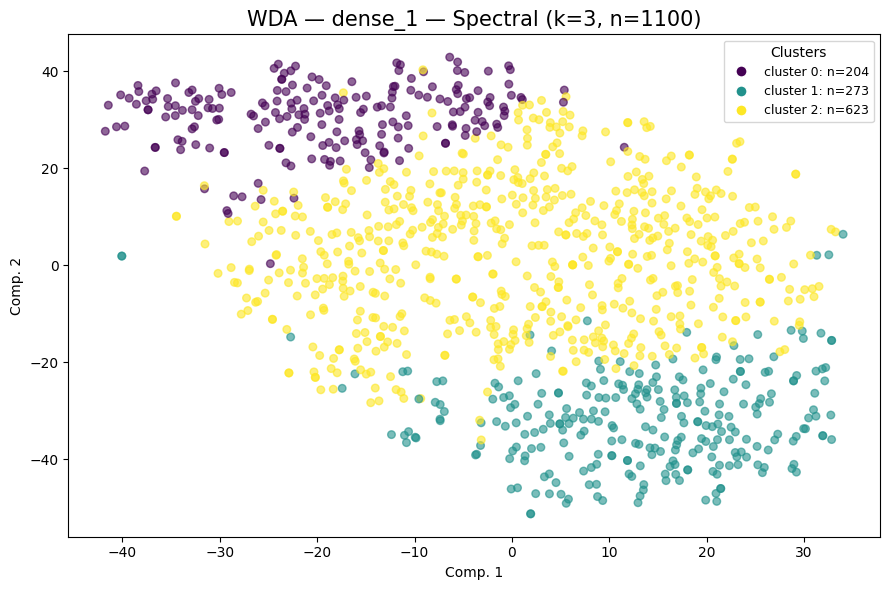


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_1 | spectral | k=3
  │  clusters=3  noise=0  sil=0.0238  DB=4.4005  CH=24.49
  └────────────────────────────────────────────────────────────────┘



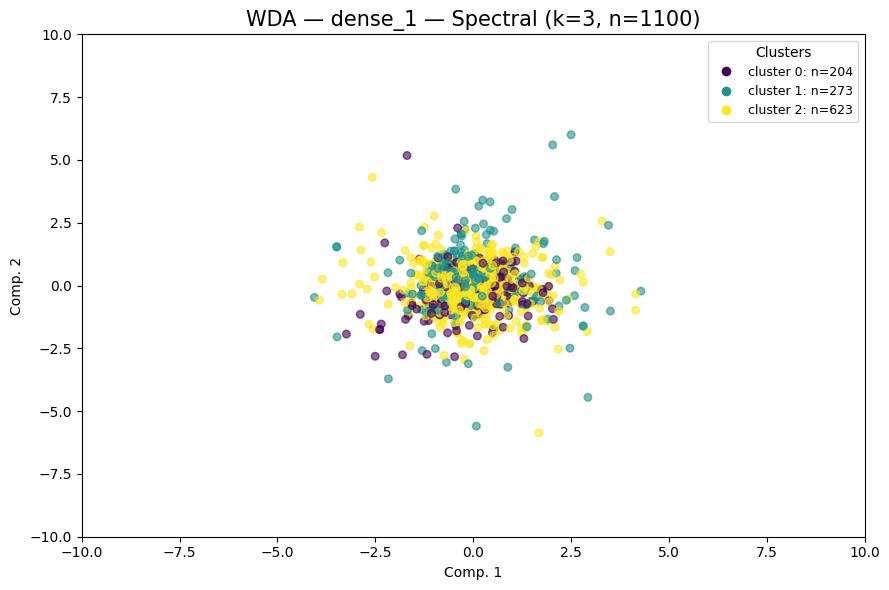


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_1 | spectral | k=3
  │  clusters=3  noise=0  sil=0.0238  DB=4.4005  CH=24.49
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([0, 1, 2, ..., 1, 2, 2]),
 'metrics': {'n_clusters': 3,
  'n_noise': 0,
  'silhouette': 0.023817,
  'davies_bouldin': 4.400539,
  'calinski_harabasz': 24.4928}}

In [81]:
cluster_plot_Spect(
            repr_wda_32["dense_1"],
            "WDA",
            "dense_1",
            spectral_k=3,
            vis_method="tsne",
            container=cluster_labels_all
        )

cluster_plot_Spect(
            repr_wda_32["dense_1"],
            "WDA",
            "dense_1",
            spectral_k=3, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10),
            container=cluster_labels_all
        )

#### Spectral Clustering k = 2

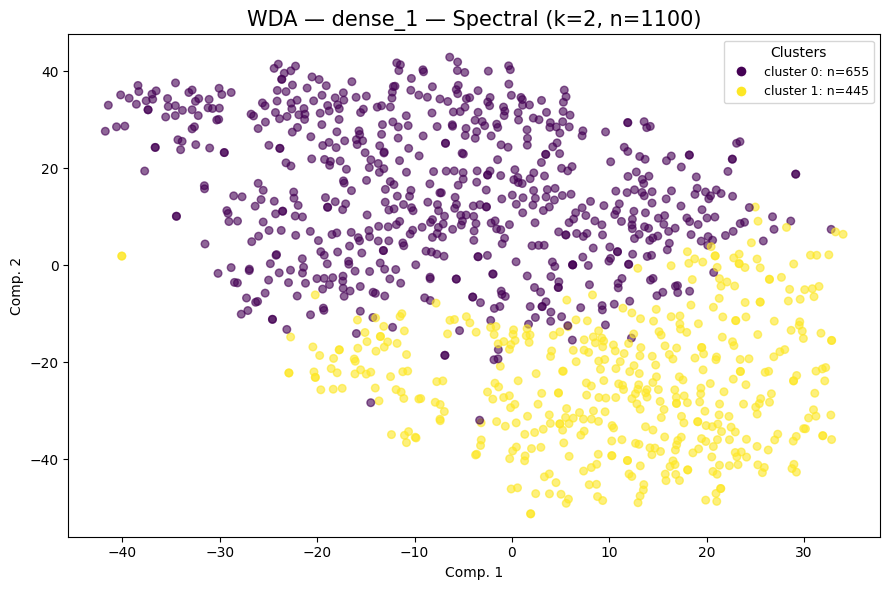


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_1 | spectral | k=2
  │  clusters=2  noise=0  sil=0.0831  DB=5.1219  CH=25.13
  └────────────────────────────────────────────────────────────────┘



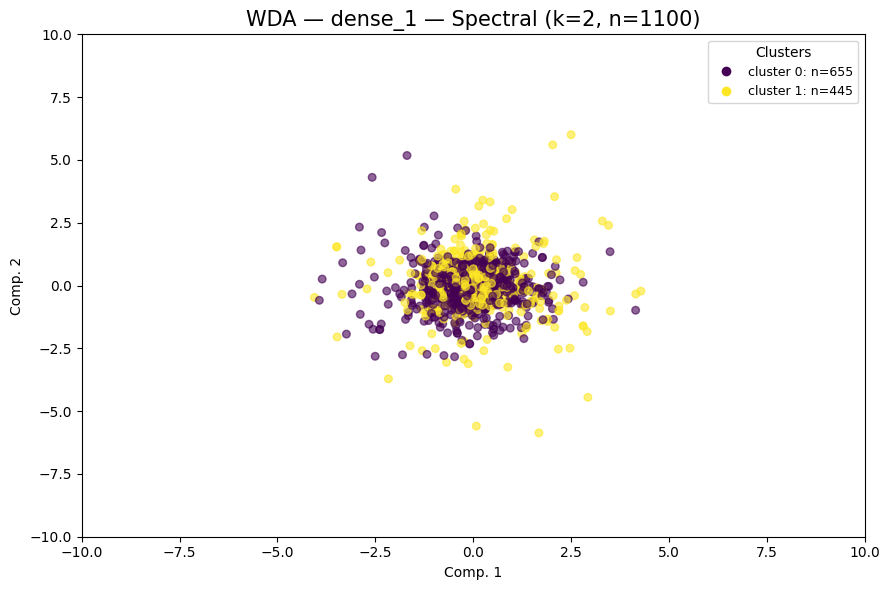


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_1 | spectral | k=2
  │  clusters=2  noise=0  sil=0.0831  DB=5.1219  CH=25.13
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([0, 1, 1, ..., 1, 0, 0]),
 'metrics': {'n_clusters': 2,
  'n_noise': 0,
  'silhouette': 0.083096,
  'davies_bouldin': 5.12186,
  'calinski_harabasz': 25.1293}}

In [82]:
cluster_plot_Spect(
            repr_wda_32["dense_1"],
            "WDA",
            "dense_1",
            spectral_k=2,
            vis_method="tsne",
            container=cluster_labels_all
        )

cluster_plot_Spect(
            repr_wda_32["dense_1"],
            "WDA",
            "dense_1",
            spectral_k=2, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10),
            container=cluster_labels_all
        )

#### Spectral Clustering k = 4

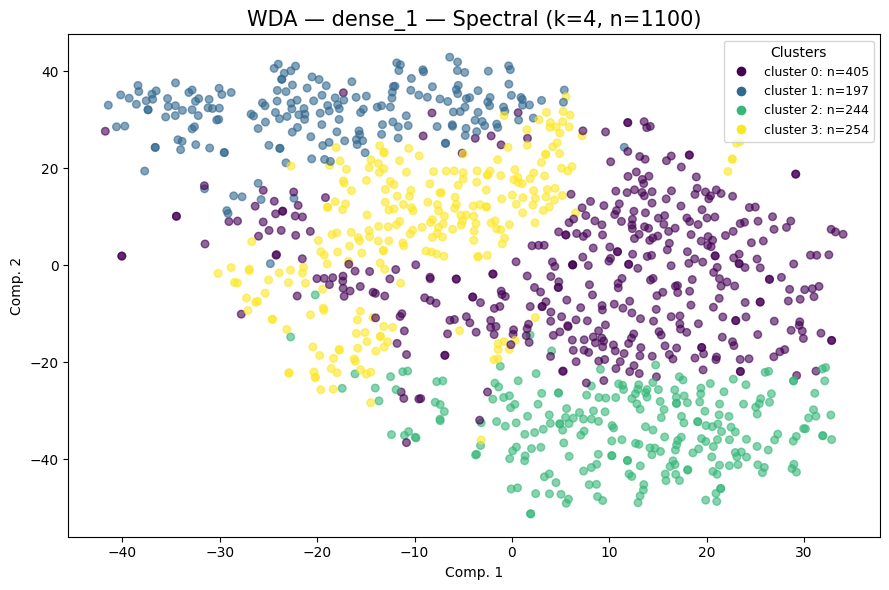


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_1 | spectral | k=4
  │  clusters=4  noise=0  sil=-0.0056  DB=4.1062  CH=22.98
  └────────────────────────────────────────────────────────────────┘



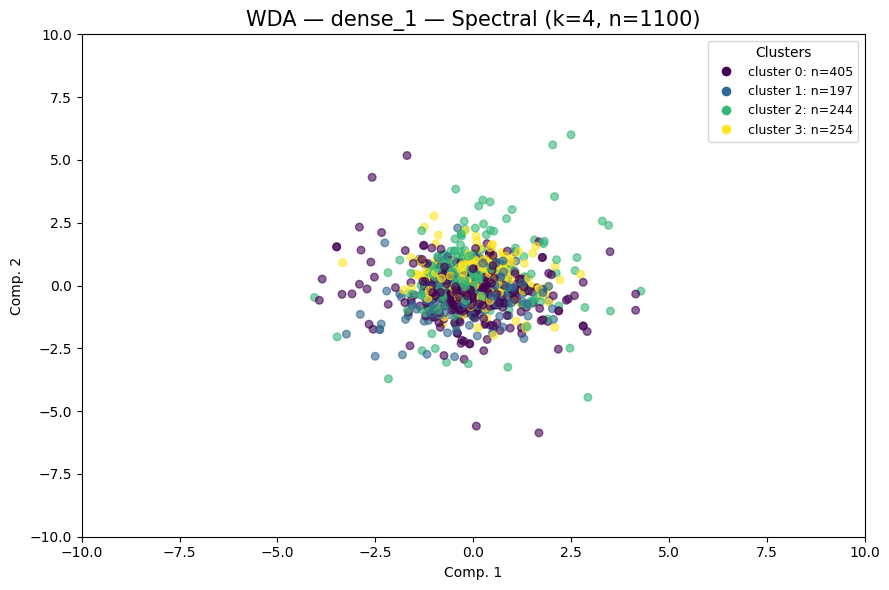


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_1 | spectral | k=4
  │  clusters=4  noise=0  sil=-0.0056  DB=4.1062  CH=22.98
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([1, 2, 3, ..., 0, 3, 0]),
 'metrics': {'n_clusters': 4,
  'n_noise': 0,
  'silhouette': -0.005627,
  'davies_bouldin': 4.106197,
  'calinski_harabasz': 22.9831}}

In [83]:
cluster_plot_Spect(
            repr_wda_32["dense_1"],
            "WDA",
            "dense_1",
            spectral_k=4,
            vis_method="tsne",
            container=cluster_labels_all
        )

cluster_plot_Spect(
            repr_wda_32["dense_1"],
            "WDA",
            "dense_1",
            spectral_k=4, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10),
            container=cluster_labels_all
        )

#### DBSCAN n = 1100

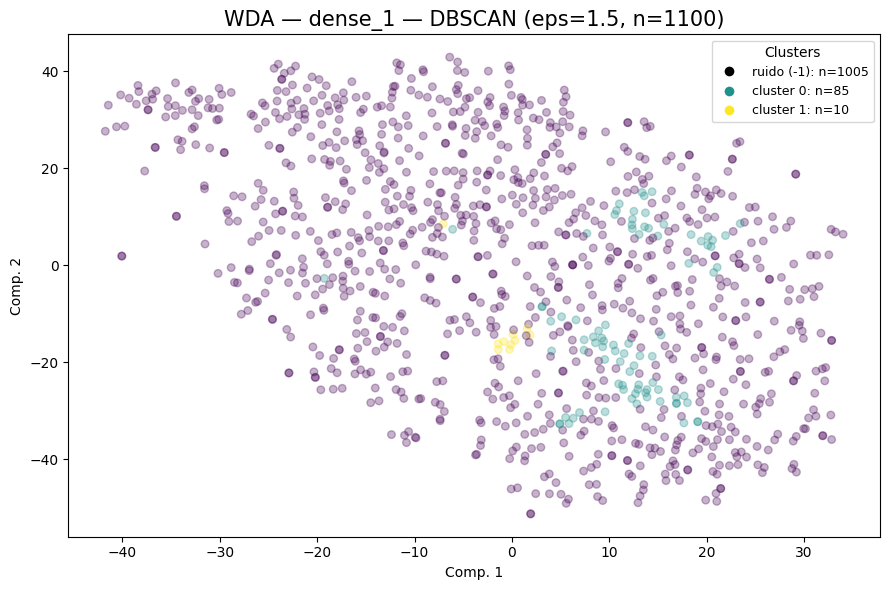


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_1 | dbscan | eps=1.5
  │  clusters=2  noise=1005  sil=0.1462  DB=1.5471  CH=10.44
  │  DBCV = -0.3294  (rango [-1,1], especifico DBSCAN)
  └────────────────────────────────────────────────────────────────┘



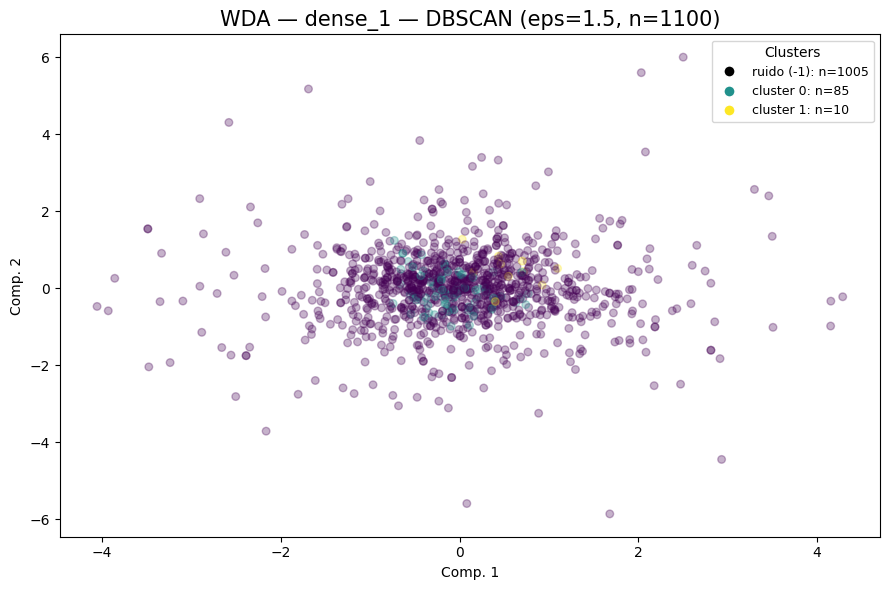


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_1 | dbscan | eps=1.5
  │  clusters=2  noise=1005  sil=0.1462  DB=1.5471  CH=10.44
  │  DBCV = -0.3294  (rango [-1,1], especifico DBSCAN)
  └────────────────────────────────────────────────────────────────┘



{'dbscan': array([-1,  0, -1, ..., -1, -1, -1], dtype=int64),
 'metrics': {'n_clusters': 2,
  'n_noise': 1005,
  'silhouette': 0.146244,
  'davies_bouldin': 1.547066,
  'calinski_harabasz': 10.4406},
 'dbcv': -0.329359}

In [84]:
res_dbs_dense1 = cluster_plot_DBSCAN(
            repr_wda_32["dense_1"],
            "WDA",
            "dense_1",
            dbscan_eps=1.5, 
            dbscan_min_samples=10, 
            vis_method="tsne", 
            xlim=None, 
            ylim=None,
            container=cluster_labels_all
        )
labels_dbs_dense1 = res_dbs_dense1["dbscan"]
cluster_plot_DBSCAN(
            repr_wda_32["dense_1"],
            "WDA",
            "dense_1",
            dbscan_eps=1.5, 
            dbscan_min_samples=10, 
            vis_method="pca", 
            xlim=None, 
            ylim=None,
            container=cluster_labels_all
        )

#### Espectros obtenidos de DBSCAN

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


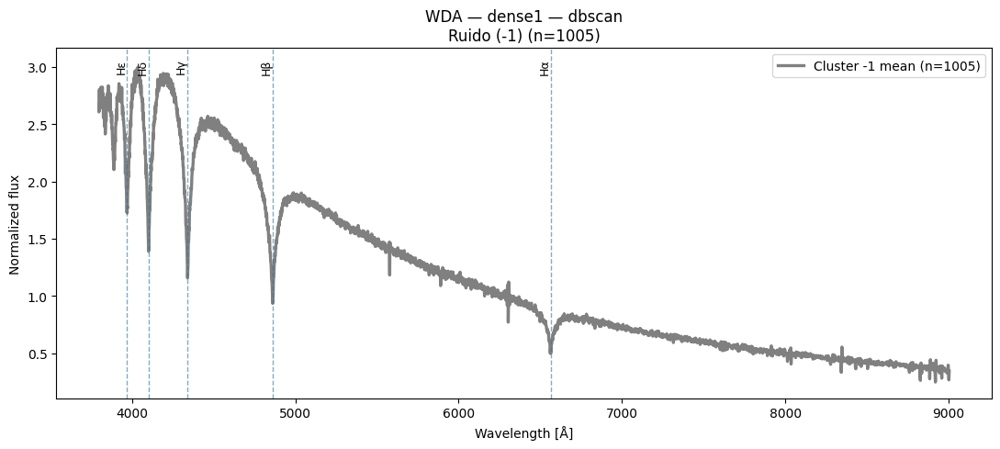

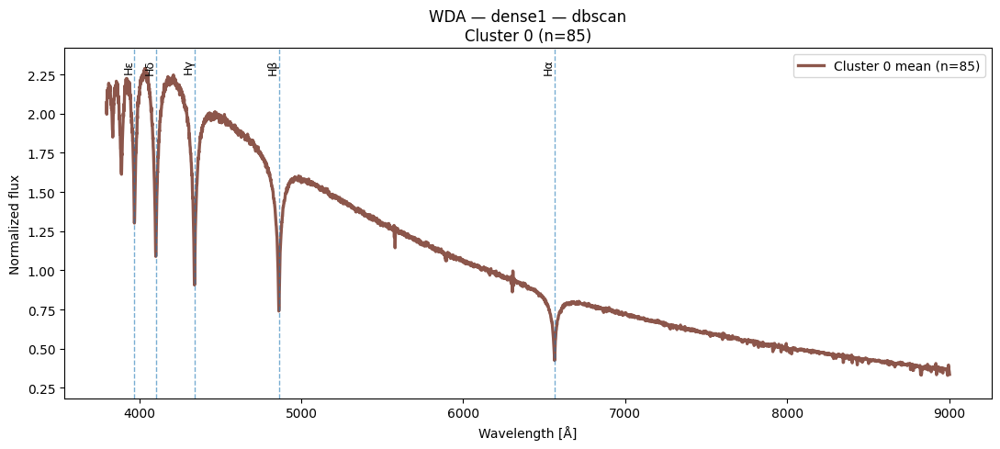

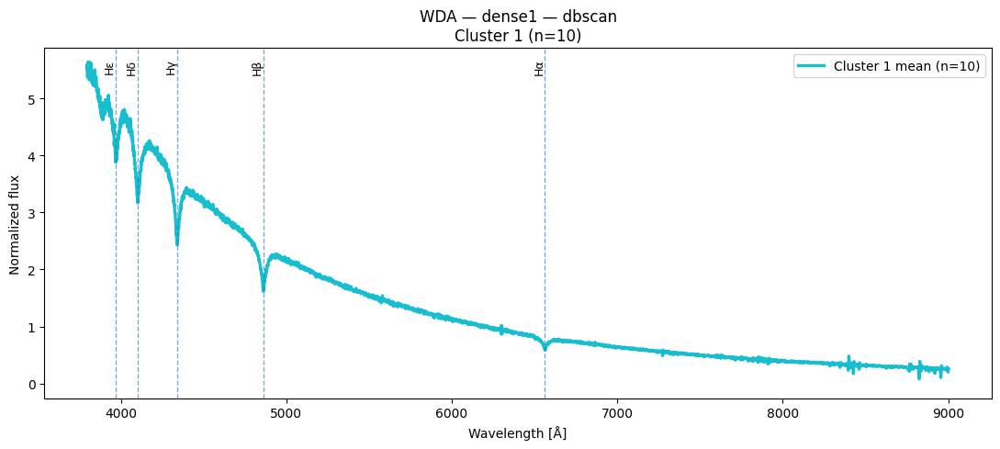

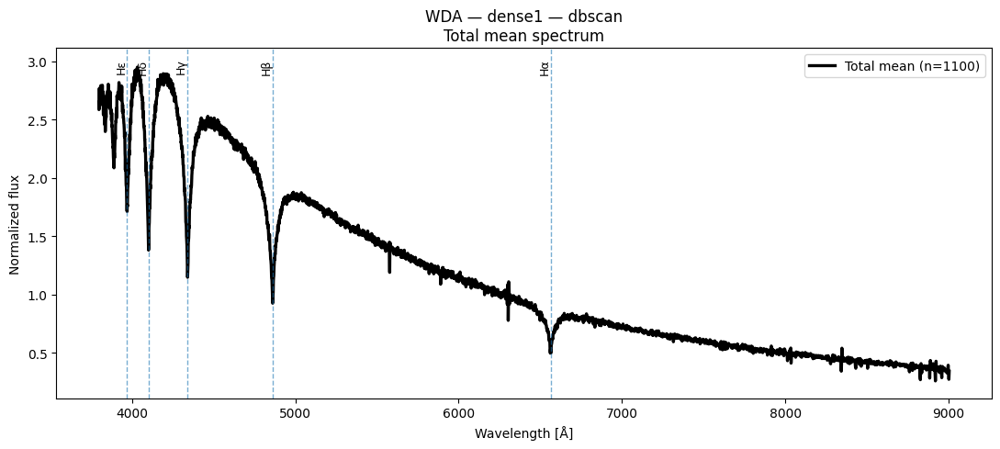

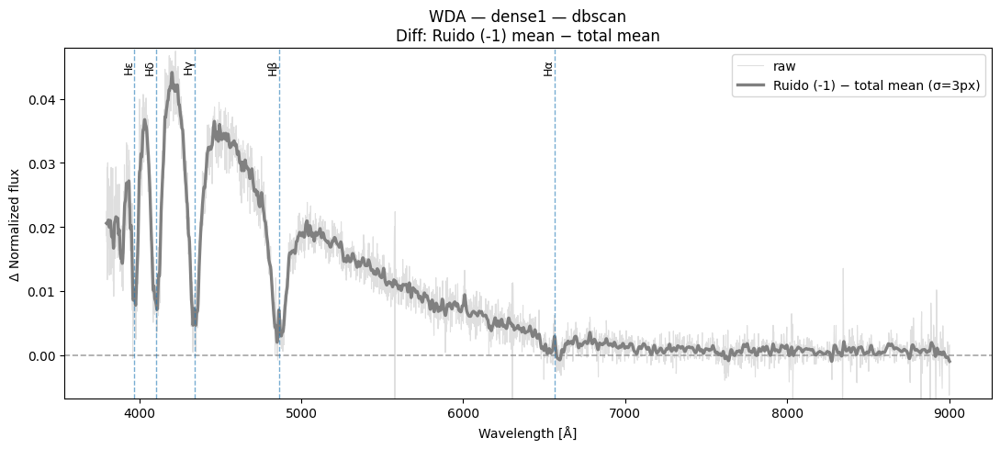

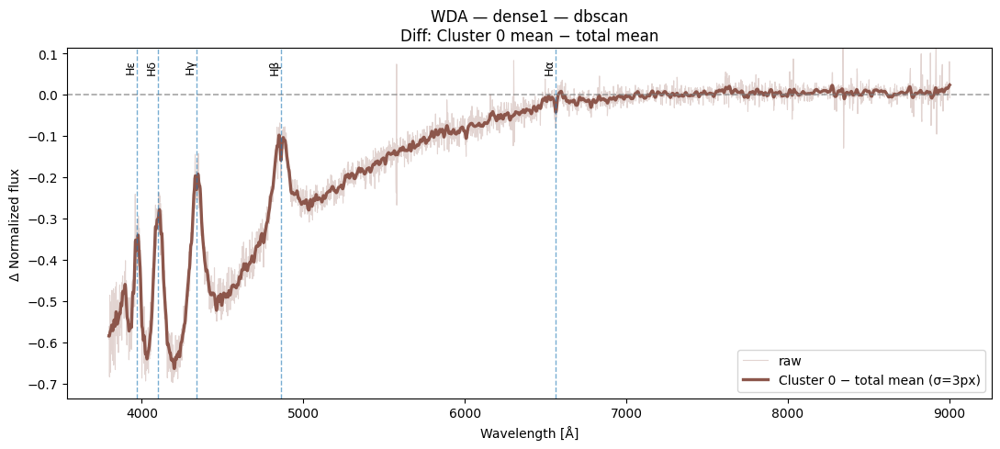

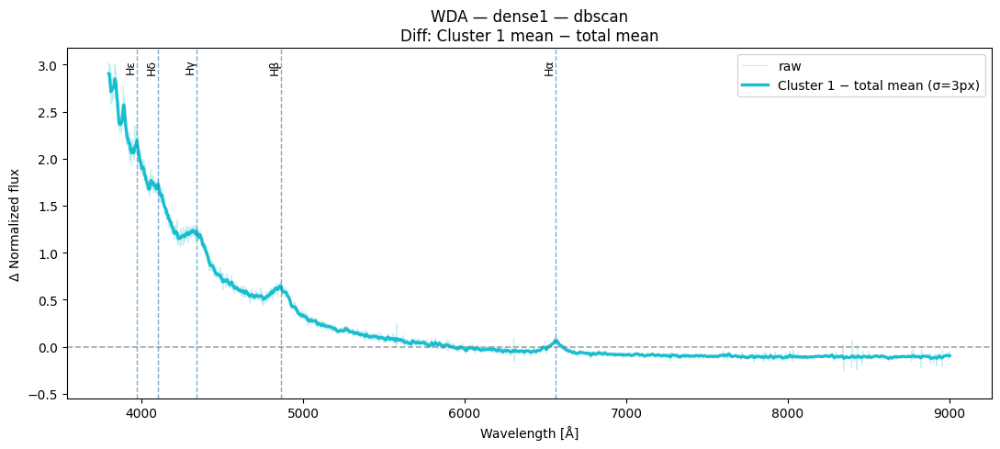

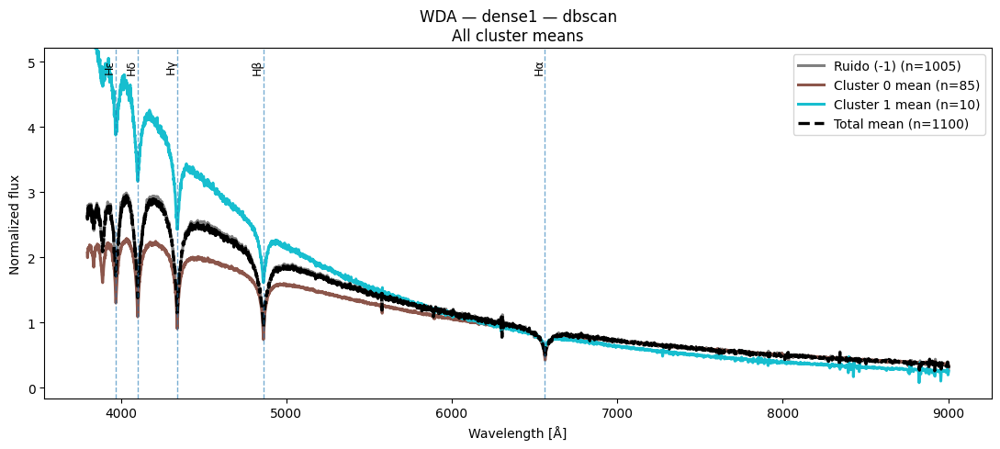

{'total_mean': array([2.6493979 , 2.5868607 , 2.5898647 , ..., 0.34275877, 0.27436805,
        0.34358275], dtype=float32),
 'group_means': {-1: array([2.6698792 , 2.60546   , 2.6123645 , ..., 0.3421869 , 0.26810586,
         0.34514776], dtype=float32),
  0: array([2.0704565 , 2.0117824 , 1.9967024 , ..., 0.3664882 , 0.35433948,
         0.33573303], dtype=float32),
  1: array([5.512115  , 5.605645  , 5.370374  , ..., 0.19852325, 0.22394557,
         0.2530301 ], dtype=float32)},
 'unique_clusters': array([-1,  0,  1], dtype=int64)}

In [85]:
plot_spectra_dbscan(
    X_wda_spec,
    labels_dbs_dense1,
    W_wda[0],
    class_name="WDA",
    layer_name="dense1"
)

### Resultados $\textbf{capa dense\_2}$ con Spectral Clustering + tSNE y PCA

#### Spectral Clustering k=3

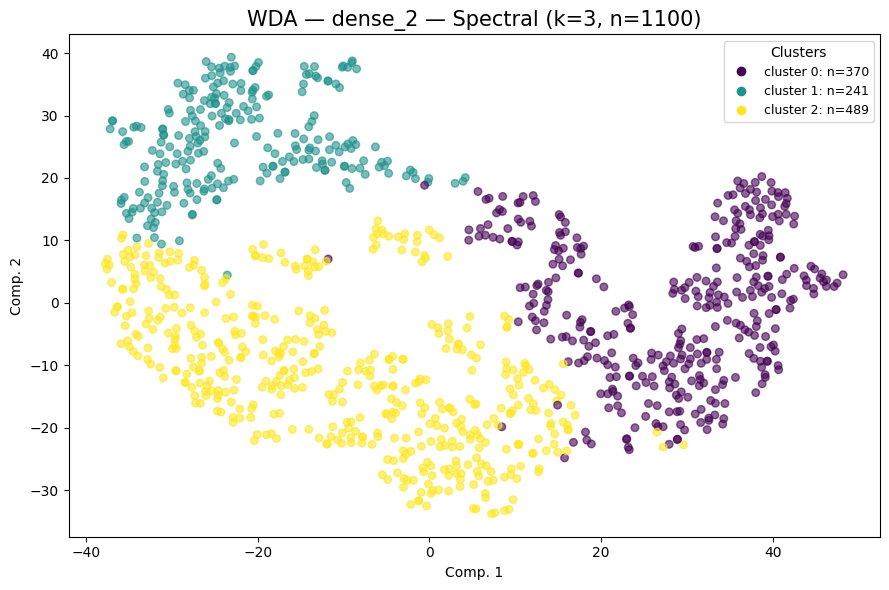


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_2 | spectral | k=3
  │  clusters=3  noise=0  sil=0.2710  DB=1.2327  CH=175.88
  └────────────────────────────────────────────────────────────────┘



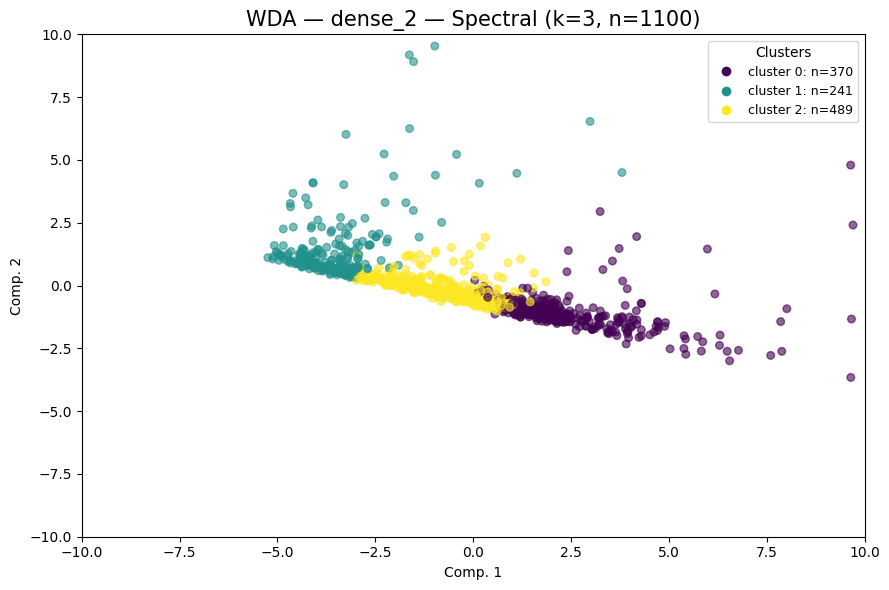


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_2 | spectral | k=3
  │  clusters=3  noise=0  sil=0.2710  DB=1.2327  CH=175.88
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([0, 1, 2, ..., 2, 0, 2]),
 'metrics': {'n_clusters': 3,
  'n_noise': 0,
  'silhouette': 0.271038,
  'davies_bouldin': 1.232705,
  'calinski_harabasz': 175.8825}}

In [86]:
res_spectral_dense2 = cluster_plot_Spect(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            spectral_k=3,
            vis_method="tsne",
            container=cluster_labels_all
        )
labels_spectral_dense2 = res_spectral_dense2["spectral"]
cluster_plot_Spect(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            spectral_k=3, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10),
            container=cluster_labels_all
        )

#### Spectral Clustering k = 2

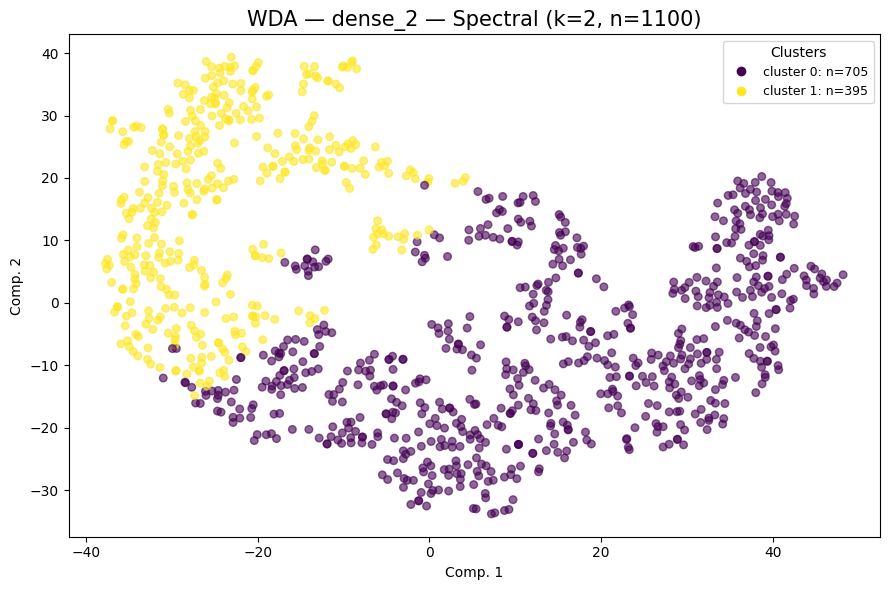


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_2 | spectral | k=2
  │  clusters=2  noise=0  sil=0.3845  DB=1.0462  CH=242.63
  └────────────────────────────────────────────────────────────────┘



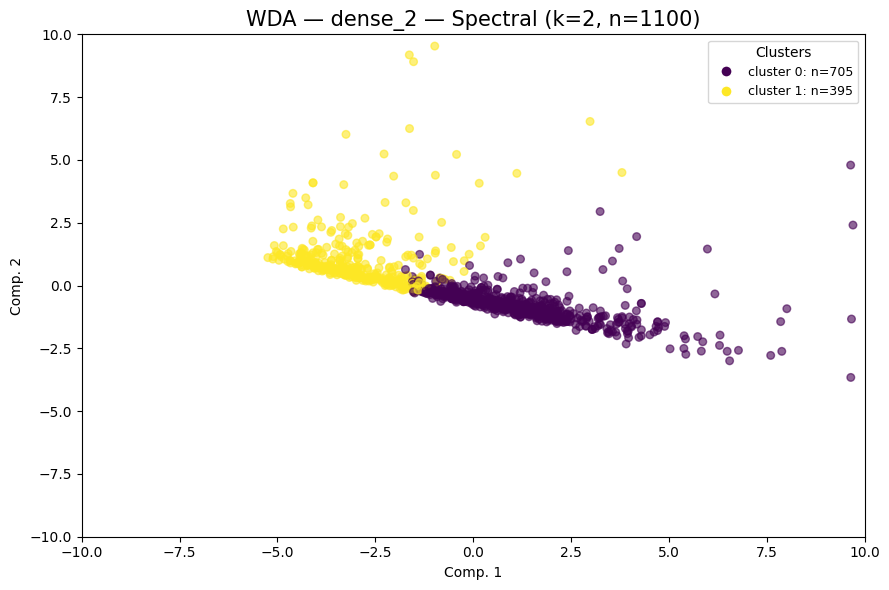


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_2 | spectral | k=2
  │  clusters=2  noise=0  sil=0.3845  DB=1.0462  CH=242.63
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([0, 1, 1, ..., 1, 0, 0]),
 'metrics': {'n_clusters': 2,
  'n_noise': 0,
  'silhouette': 0.384526,
  'davies_bouldin': 1.046158,
  'calinski_harabasz': 242.6344}}

In [87]:
res_spectral2_dense2 = cluster_plot_Spect(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            spectral_k=2,
            vis_method="tsne",
            container=cluster_labels_all
        )
labels_spectral2_dense2 = res_spectral2_dense2["spectral"]
cluster_plot_Spect(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            spectral_k=2, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10),
            container=cluster_labels_all
        )

### Spectral Clustering k = 4

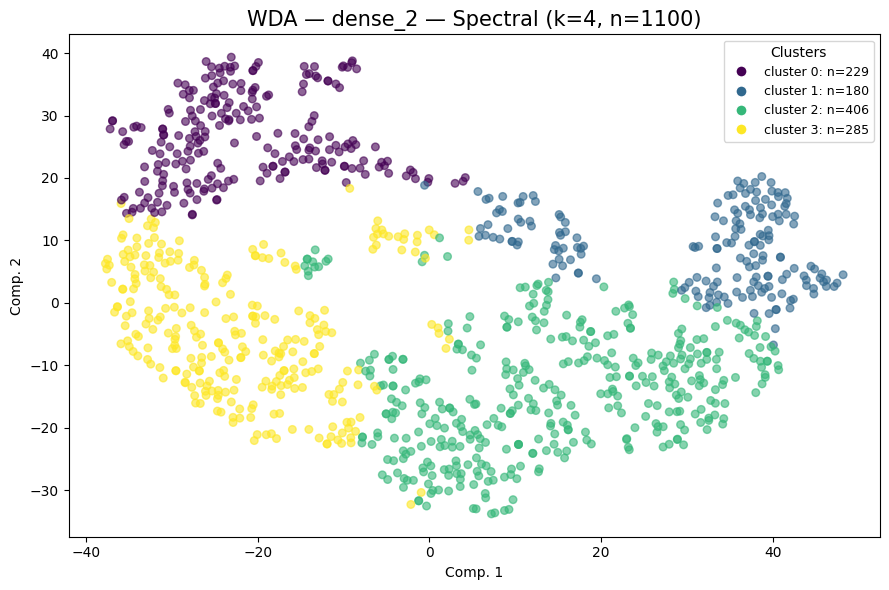


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_2 | spectral | k=4
  │  clusters=4  noise=0  sil=0.2007  DB=1.5040  CH=144.10
  └────────────────────────────────────────────────────────────────┘



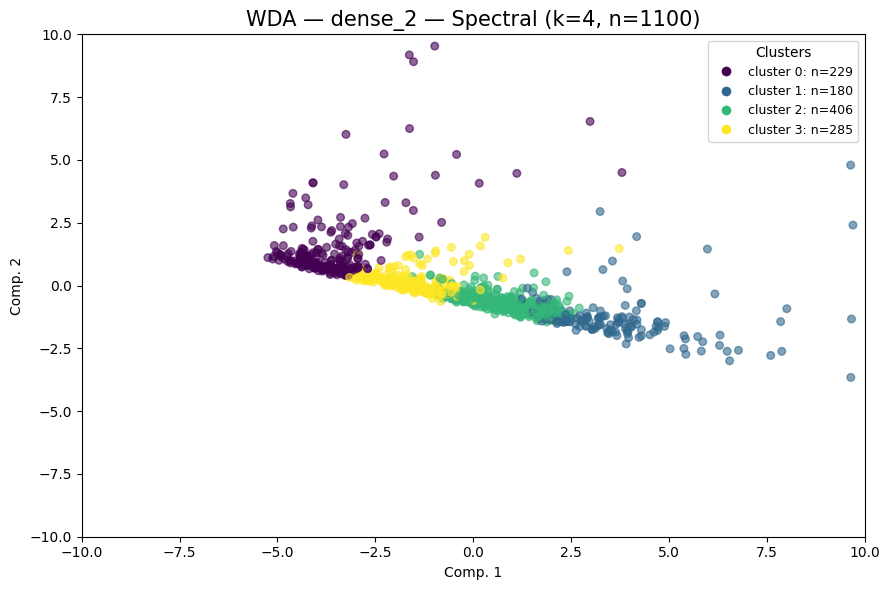


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_2 | spectral | k=4
  │  clusters=4  noise=0  sil=0.2007  DB=1.5040  CH=144.10
  └────────────────────────────────────────────────────────────────┘



{'spectral': array([1, 0, 3, ..., 3, 1, 2]),
 'metrics': {'n_clusters': 4,
  'n_noise': 0,
  'silhouette': 0.200664,
  'davies_bouldin': 1.503974,
  'calinski_harabasz': 144.1003}}

In [88]:
res_spectral4_dense2 = cluster_plot_Spect(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            spectral_k=4,
            vis_method="tsne",
            container=cluster_labels_all
        )
labels_spectral4_dense2 = res_spectral2_dense2["spectral"]
cluster_plot_Spect(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            spectral_k=4, 
            vis_method="pca",
            xlim=(-10,10), ylim=(-10,10),
            container=cluster_labels_all
        )

#### DBSCAN n=1100

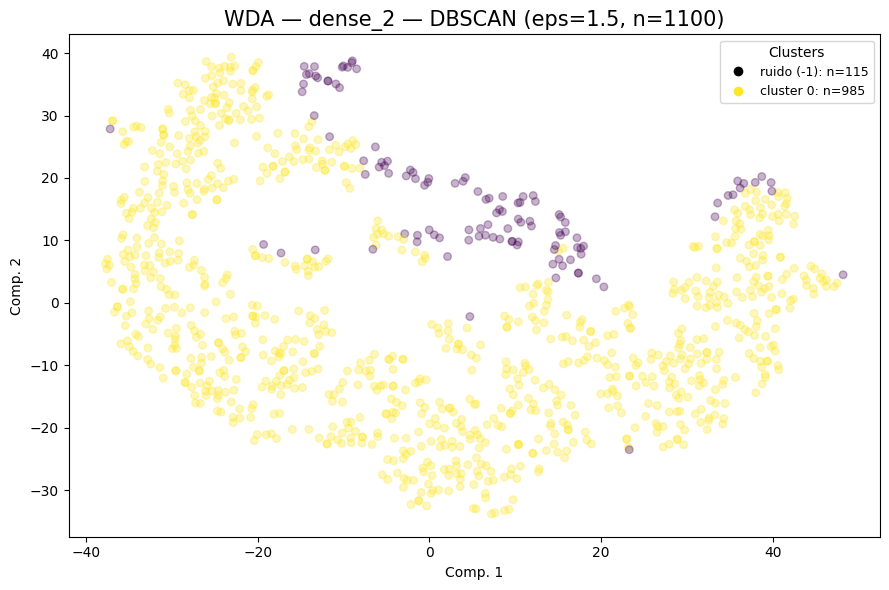


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_2 | dbscan | eps=1.5
  │  clusters=1  noise=115  sil=N/A  DB=N/A  CH=N/A
  │  DBCV = N/A  (rango [-1,1], especifico DBSCAN)
  └────────────────────────────────────────────────────────────────┘



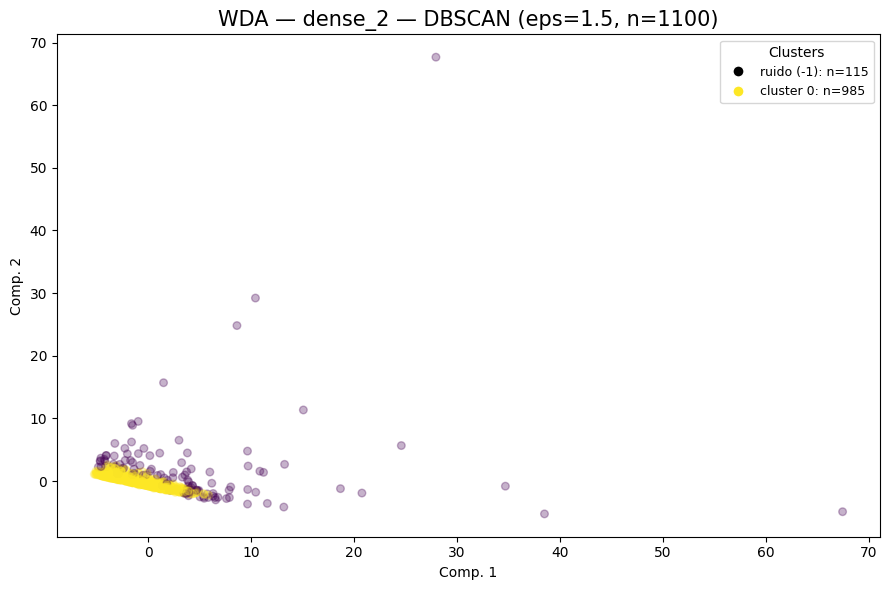


  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | dense_2 | dbscan | eps=1.5
  │  clusters=1  noise=115  sil=N/A  DB=N/A  CH=N/A
  │  DBCV = N/A  (rango [-1,1], especifico DBSCAN)
  └────────────────────────────────────────────────────────────────┘



{'dbscan': array([0, 0, 0, ..., 0, 0, 0], dtype=int64),
 'metrics': {'n_clusters': 1,
  'n_noise': 115,
  'silhouette': None,
  'davies_bouldin': None,
  'calinski_harabasz': None},
 'dbcv': nan}

In [89]:
res_dbs_dense2 = cluster_plot_DBSCAN(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            dbscan_eps=1.5, 
            dbscan_min_samples=10, 
            vis_method="tsne", 
            xlim=None, 
            ylim=None,
            container=cluster_labels_all
        )
labels_dbs_dense2 = res_dbs_dense2["dbscan"]
cluster_plot_DBSCAN(
            repr_wda_32["dense_2"],
            "WDA",
            "dense_2",
            dbscan_eps=1.5, 
            dbscan_min_samples=10, 
            vis_method="pca", 
            xlim=None, 
            ylim=None,
            container=cluster_labels_all
        )

#### Espectros obtenidos para dense_2 con Spectral Clustering k = 3 y n = 1100

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


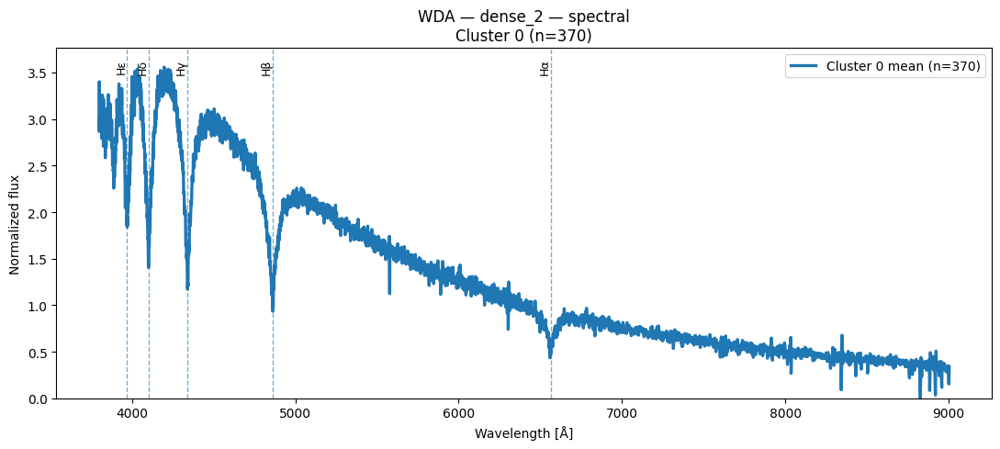

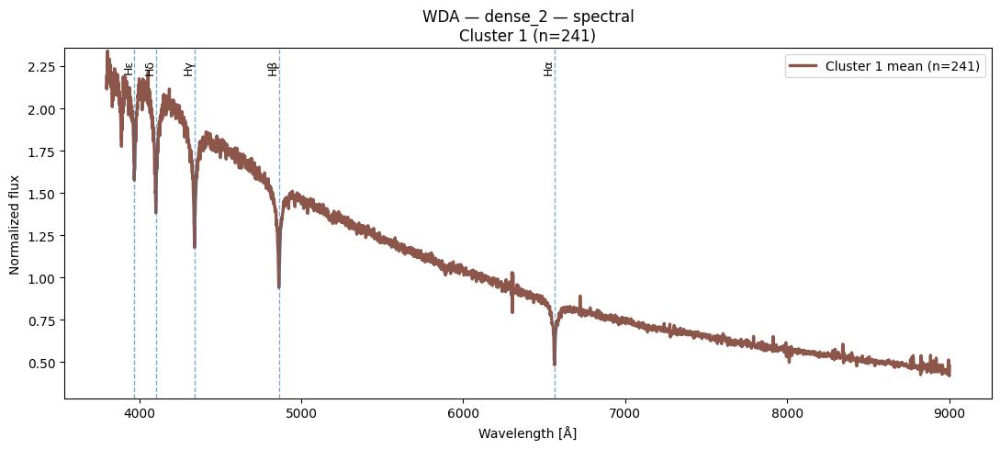

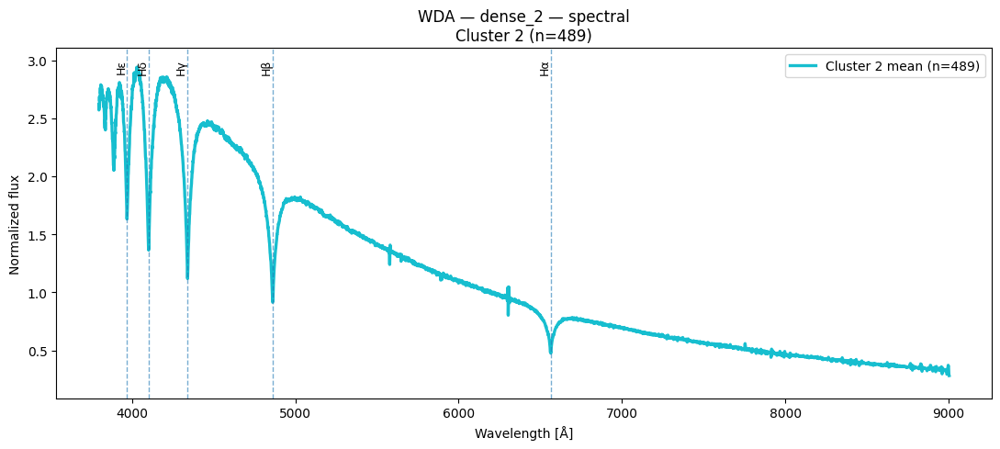

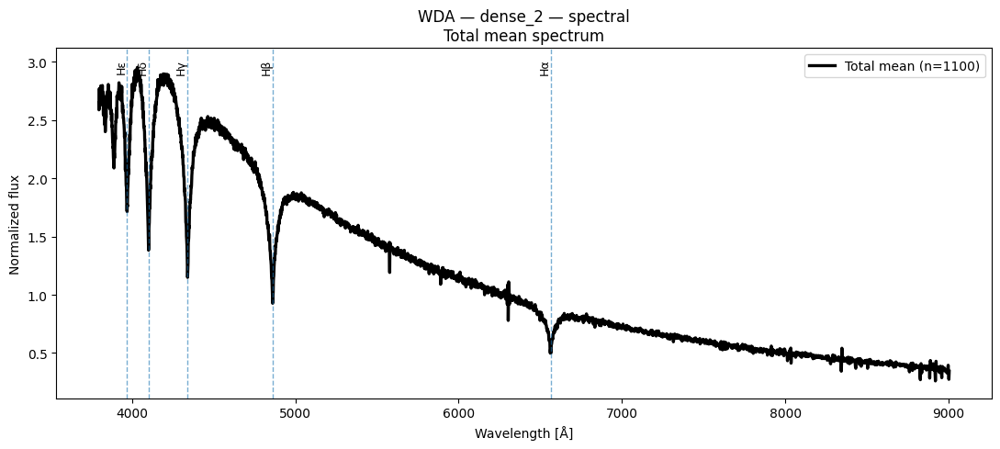

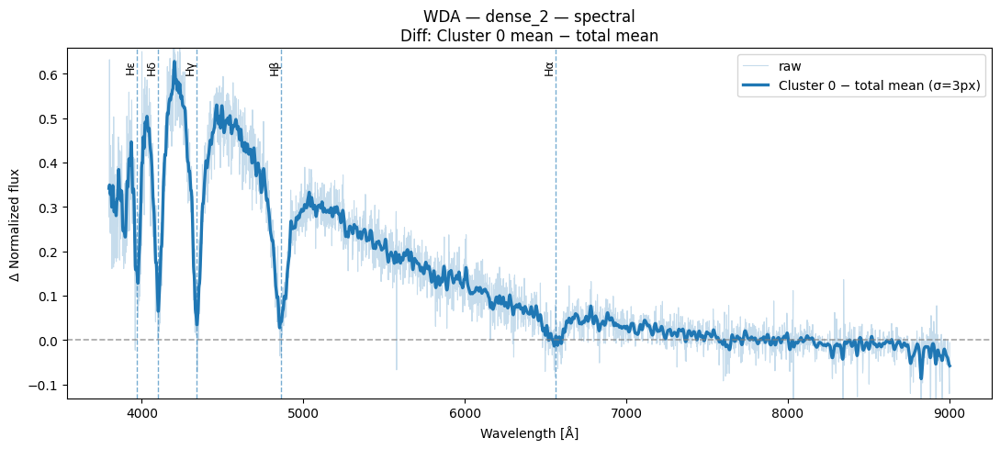

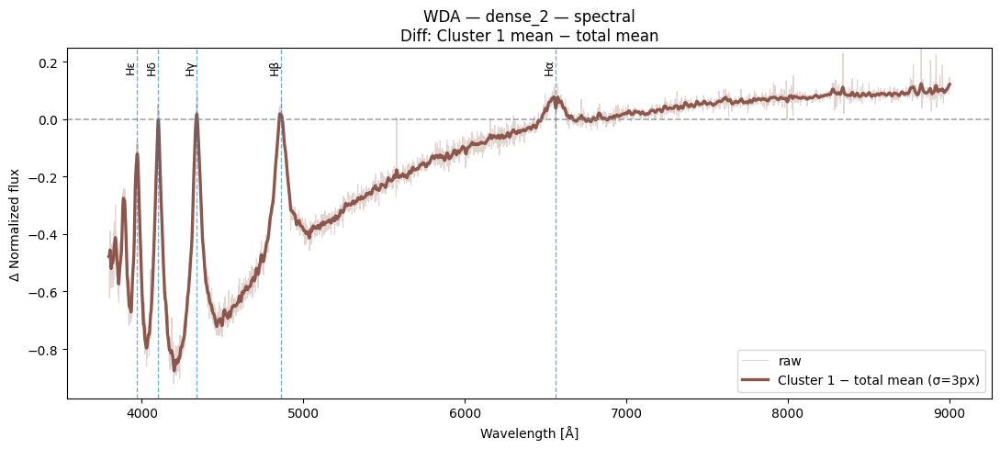

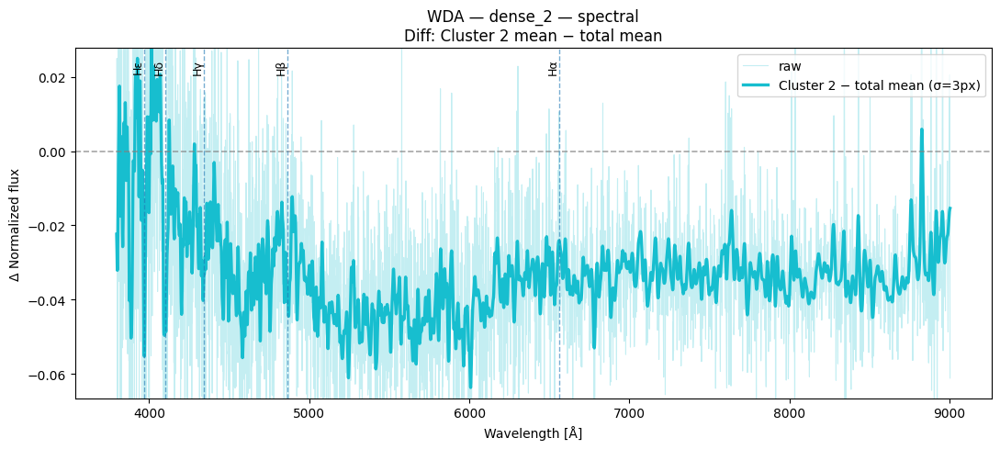

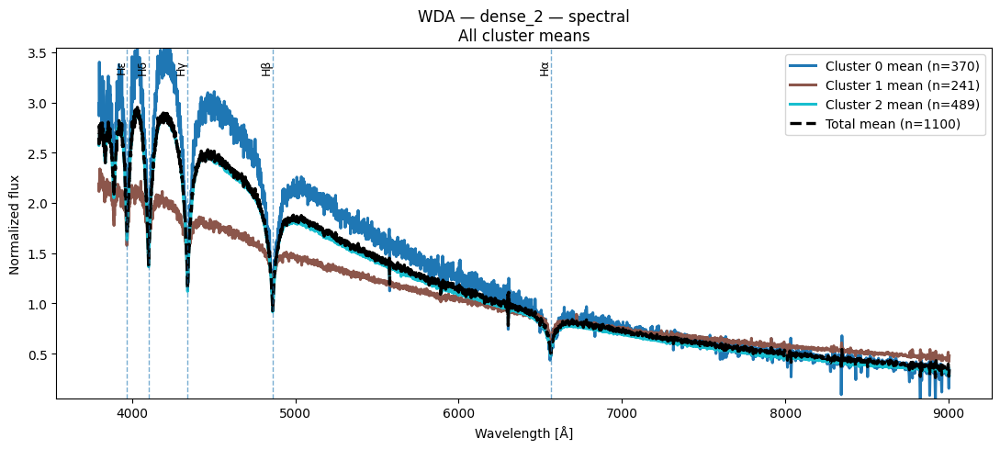

{'total_mean': array([2.6493979 , 2.5868607 , 2.5898647 , ..., 0.34275877, 0.27436805,
        0.34358275], dtype=float32),
 'group_means': {0: array([2.9904964 , 2.91507   , 2.8665686 , ..., 0.26025265, 0.15318817,
         0.33724385], dtype=float32),
  1: array([2.1885817 , 2.1160998 , 2.1143215 , ..., 0.43111524, 0.41862655,
         0.47746158], dtype=float32),
  2: array([2.6184115 , 2.5705345 , 2.6148593 , ..., 0.3616406 , 0.2949612 ,
         0.28239837], dtype=float32)},
 'unique_clusters': array([0, 1, 2])}

In [90]:
plot_spectra_spectral(
    X_wda_spec,
    labels_spectral_dense2,
    W_wda[0],
    class_name="WDA",
    layer_name="dense_2"
)

#### Espectros obtenidos para dense_2 con DBSCAN y n = 1100

C:\Users\javip\AppData\Local\Temp\ipykernel_25820\531566132.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap       = plt.cm.get_cmap("tab10", n_clusters)


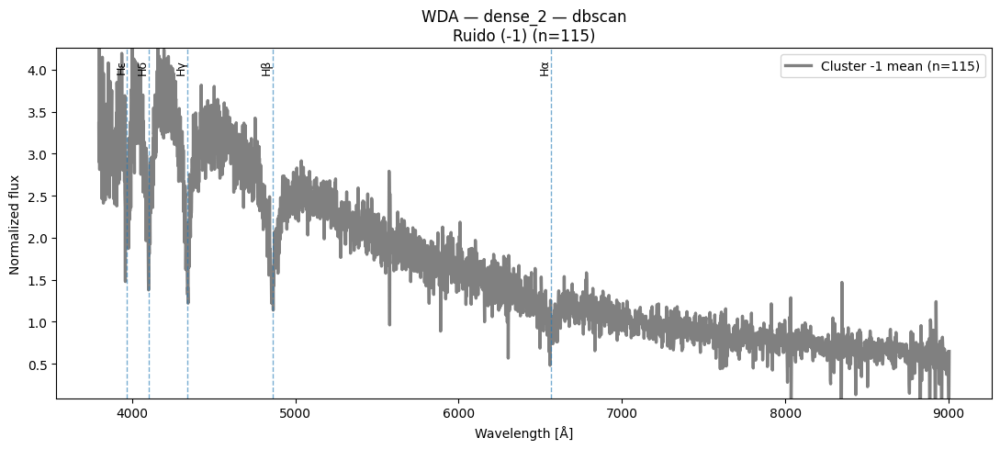

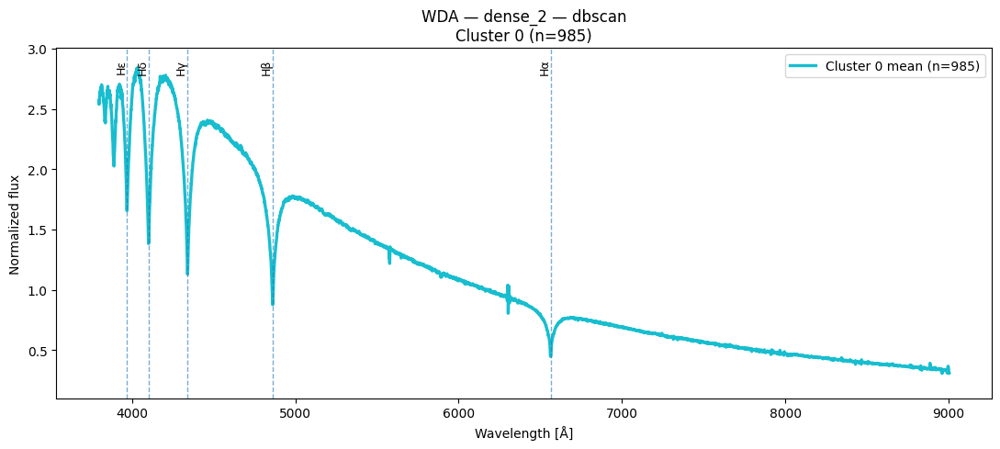

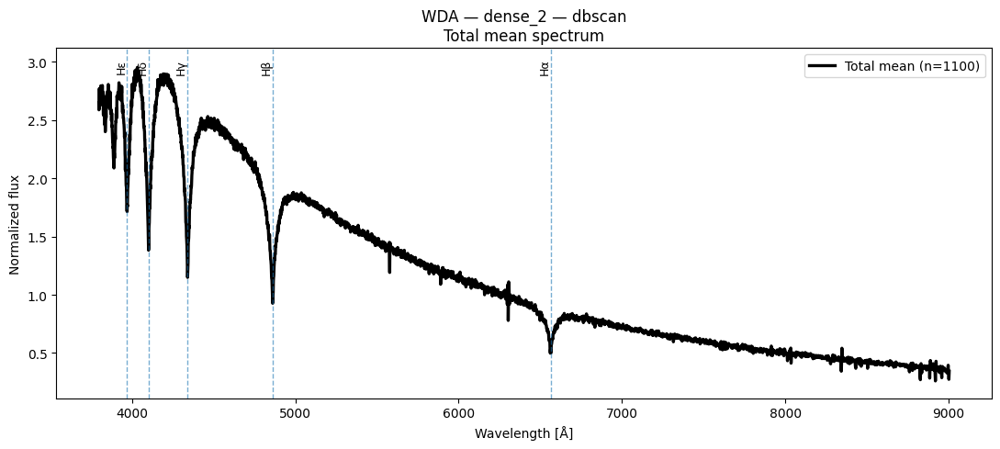

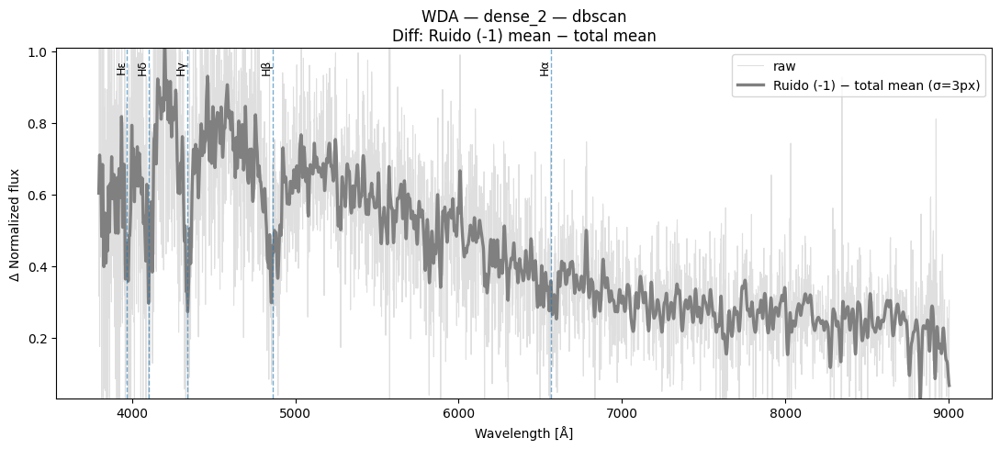

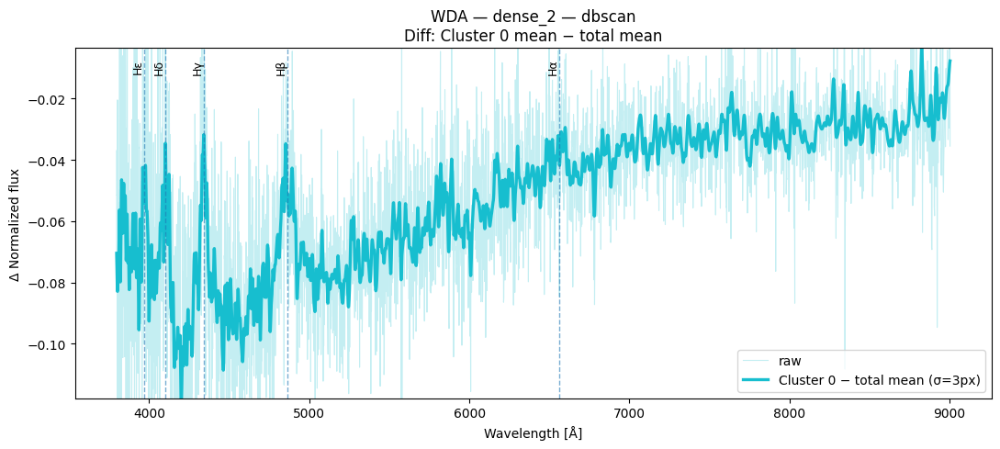

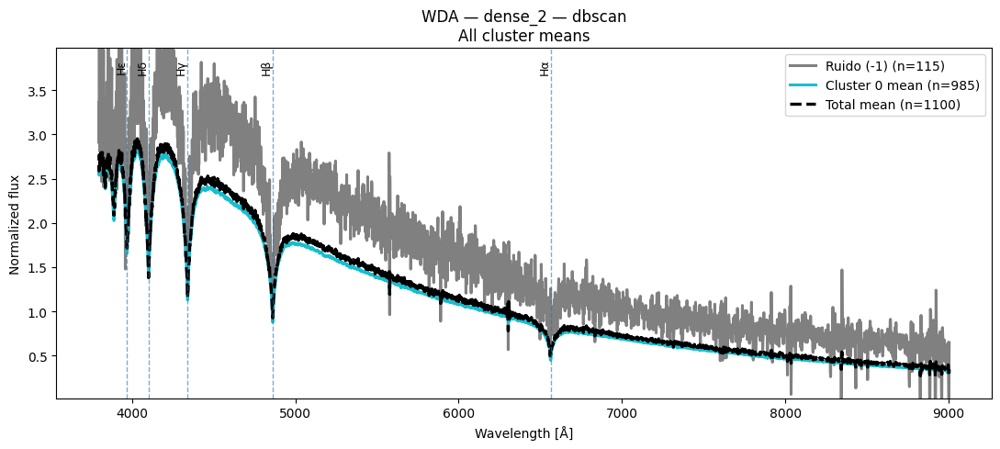

{'total_mean': array([2.6493979 , 2.5868607 , 2.5898647 , ..., 0.34275877, 0.27436805,
        0.34358275], dtype=float32),
 'group_means': {-1: array([3.3574717 , 2.9026318 , 3.032409  , ..., 0.26793537, 0.01046038,
         0.6476452 ], dtype=float32),
  0: array([2.5667284 , 2.5499933 , 2.5381944 , ..., 0.35149452, 0.3051795 ,
         0.3080834 ], dtype=float32)},
 'unique_clusters': array([-1,  0], dtype=int64)}

In [91]:
plot_spectra_dbscan(
    X_wda_spec,
    labels_dbs_dense2,
    W_wda[0],
    class_name="WDA",
    layer_name="dense_2"
)

## Explorador interactivo de Spectral Clustering

Selecciona la capa y el número de clusters para ejecutar el experimento y visualizarlo. Cada configuración queda cacheada en `spectral_store`.

In [92]:
spectral_explorer(repr_wda_32, class_name="WDA", suffix="wda")

interactive(children=(Dropdown(description='Capa:', options=('flatten', 'dense', 'dense_1', 'dense_2'), value=…

In [97]:
%run guardar_figuras_tesis.py

with guardar_figuras(["wda_flatten_spectral_k2_pca.png"]):
    cluster_plot_Spect(repr_wda_32["flatten"], "WDA", "flatten",
                       spectral_k=2, vis_method="pca")

with guardar_figuras(["wda_flatten_spectral_k2_tsne.png"]):
    cluster_plot_Spect(repr_wda_32["flatten"], "WDA", "flatten",
                       spectral_k=2, vis_method="tsne")

    guardada  wda_flatten_spectral_k2_pca.png

  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=2
  │  clusters=2  noise=0  sil=0.0668  DB=2.2879  CH=21.49
  └────────────────────────────────────────────────────────────────┘

    guardada  wda_flatten_spectral_k2_tsne.png

  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=2
  │  clusters=2  noise=0  sil=0.0668  DB=2.2879  CH=21.49
  └────────────────────────────────────────────────────────────────┘



In [98]:
%run guardar_figuras_tesis.py

with guardar_figuras(["wda_flatten_spectral_k3_pca.png"]):
    cluster_plot_Spect(repr_wda_32["flatten"], "WDA", "flatten",
                       spectral_k=3, vis_method="pca")

with guardar_figuras(["wda_flatten_spectral_k3_tsne.png"]):
    cluster_plot_Spect(repr_wda_32["flatten"], "WDA", "flatten",
                       spectral_k=3, vis_method="tsne")

    guardada  wda_flatten_spectral_k3_pca.png

  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=3
  │  clusters=3  noise=0  sil=-0.0472  DB=2.6617  CH=20.24
  └────────────────────────────────────────────────────────────────┘

    guardada  wda_flatten_spectral_k3_tsne.png

  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=3
  │  clusters=3  noise=0  sil=-0.0472  DB=2.6617  CH=20.24
  └────────────────────────────────────────────────────────────────┘



In [99]:
%run guardar_figuras_tesis.py

with guardar_figuras(["wda_flatten_spectral_k4_pca.png"]):
    cluster_plot_Spect(repr_wda_32["flatten"], "WDA", "flatten",
                       spectral_k=4, vis_method="pca")

with guardar_figuras(["wda_flatten_spectral_k4_tsne.png"]):
    cluster_plot_Spect(repr_wda_32["flatten"], "WDA", "flatten",
                       spectral_k=4, vis_method="tsne")

    guardada  wda_flatten_spectral_k4_pca.png

  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=4
  │  clusters=4  noise=0  sil=-0.0258  DB=3.3007  CH=18.87
  └────────────────────────────────────────────────────────────────┘

    guardada  wda_flatten_spectral_k4_tsne.png

  ┌────────────────────────────────────────────────────────────────┐
  │  WDA | flatten | spectral | k=4
  │  clusters=4  noise=0  sil=-0.0258  DB=3.3007  CH=18.87
  └────────────────────────────────────────────────────────────────┘



## Explorador interactivo de DBSCAN

Selecciona la capa, $\varepsilon$ y `min_samples`. Cada configuración queda cacheada en `dbscan_store` y se reporta además el DBCV.

In [93]:
dbscan_explorer(repr_wda_32, class_name="WDA", suffix="wda")

interactive(children=(Dropdown(description='Capa:', options=('flatten', 'dense', 'dense_1', 'dense_2'), value=…

## Explorador de espectros por cluster

Muestra los espectros promedio de los experimentos ya ejecutados en los exploradores anteriores, para Spectral Clustering o DBSCAN.

In [94]:
spectra_viewer(X_wda_spec, W_wda[0], class_name="WDA", suffix="wda")

## Exportación de espectros originales por cluster

Ejecuta primero el experimento que interese en el explorador correspondiente, de modo que
quede guardado en `spectral_store` o `dbscan_store`, y luego exporta desde ahí.

In [96]:
# --- Ejemplo A: exportar desde un experimento de Spectral Clustering ---
# clave = (capa, k). Debe existir en spectral_store.
CLAVE_SPECTRAL = ("dense", 5)

resumen_export = exportar_desde_store(
    spectral_store, CLAVE_SPECTRAL,
    df_spectra  = df_wda_DRAC,
    class_name  = "WDA",
    method_name = "spectral",
    spectra_2d  = X_wda_spec,
    wavelength  = W_wda[0],
)
display(resumen_export)

  cluster 0      n=  205  ->  espectros_por_cluster\original_spectra_WDA_dense_spectral_5_cluster0
  cluster 1      n=  376  ->  espectros_por_cluster\original_spectra_WDA_dense_spectral_5_cluster1
  cluster 2      n=   90  ->  espectros_por_cluster\original_spectra_WDA_dense_spectral_5_cluster2
  cluster 3      n=  125  ->  espectros_por_cluster\original_spectra_WDA_dense_spectral_5_cluster3
  cluster 4      n=  304  ->  espectros_por_cluster\original_spectra_WDA_dense_spectral_5_cluster4

  Total exportado: 1100 espectros en 5 carpetas dentro de 'espectros_por_cluster'


,cluster,n_espectros,n_copiados,carpeta
0,0,205,205,espectros_por_cluster\original_spectra_WDA_den...
1,1,376,376,espectros_por_cluster\original_spectra_WDA_den...
2,2,90,90,espectros_por_cluster\original_spectra_WDA_den...
3,3,125,125,espectros_por_cluster\original_spectra_WDA_den...
4,4,304,304,espectros_por_cluster\original_spectra_WDA_den...


In [ ]:
CLAVE_DBSCAN = ("dense", 1.5, 10)

resumen_export_db = exportar_desde_store(
    dbscan_store, CLAVE_DBSCAN,
    df_spectra  = df_wda_DRAC,
    class_name  = "WDA",
    method_name = "dbscan",
    spectra_2d  = X_wda_spec,
    wavelength  = W_wda[0],
)
display(resumen_export_db)

In [ ]:
# ej: exportar a partir de etiquetas ya guardadas en una variable ---
# util si se tienen las etiquetas sueltas (por ejemplo labels_flatten_k3_wda).
#
# exportar_espectros_originales(
#     labels_flatten_k3_wda, df_wda_DRAC, "WDA", "flatten", "spectral", k=3,
#     spectra_2d=X_wda_spec, wavelength=W_wda[0])

## Espectros sintetizados con puntero de longitud de onda

In [ ]:
# puntero sobre un experimento de Spectral Clustering
puntero_desde_store(
    spectral_store, ("dense", 5),
    spectra_2d  = X_wda_spec,
    wavelength  = W_wda[0],
    class_name  = "WDA",
    method_name = "spectral",
)

In [ ]:
# Puntero sobre un experimento de DBSCAN
# puntero_desde_store(
#     dbscan_store, ("dense", 1.5, 10),
#     spectra_2d  = X_wda_spec,
#     wavelength  = W_wda[0],
#     class_name  = "WDA",
#     method_name = "dbscan",
# )